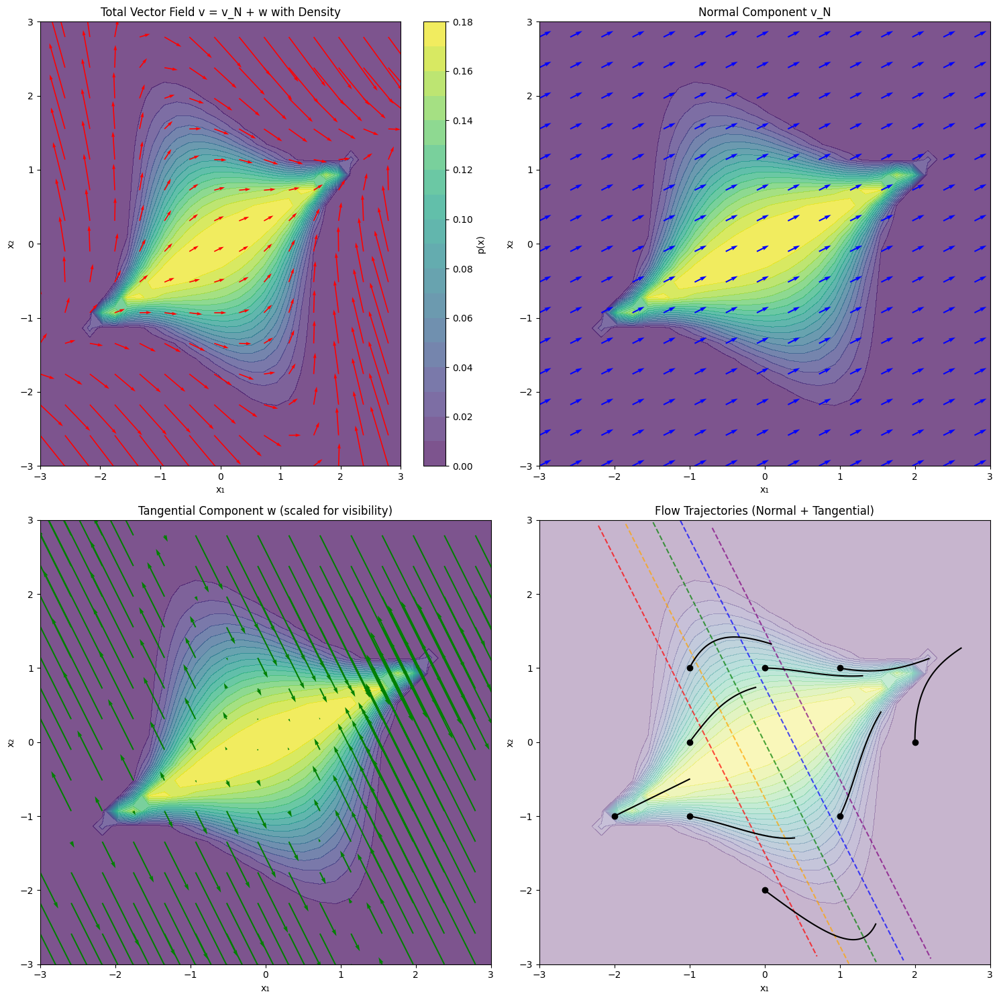

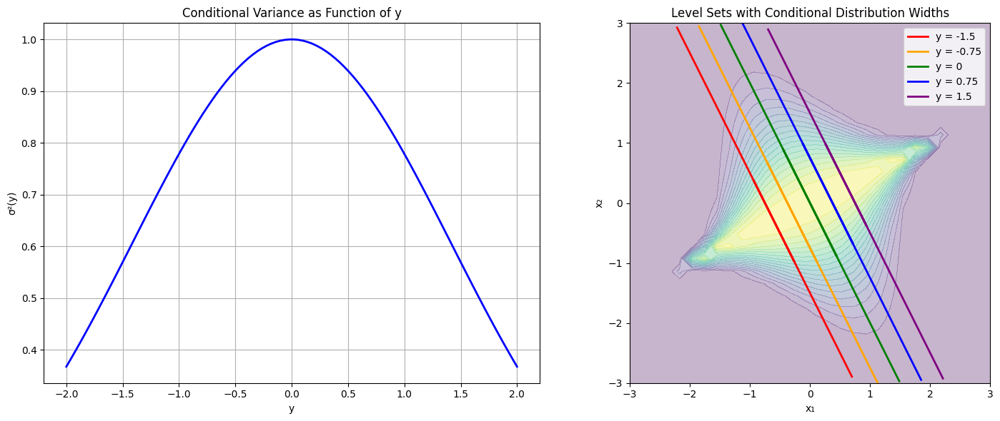

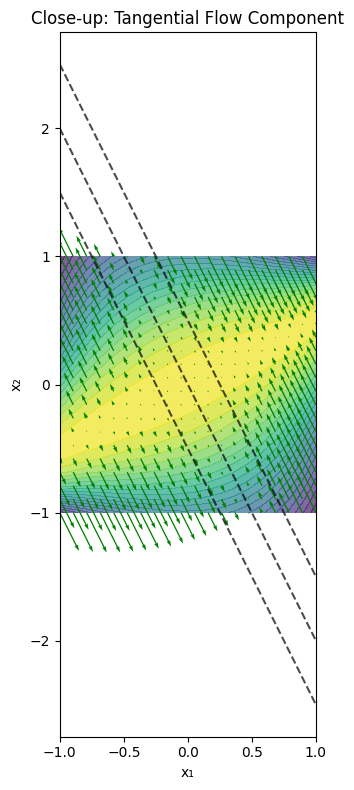

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patches
from scipy.stats import multivariate_normal
from scipy.integrate import odeint

def construct_special_distribution(x1, x2, a, b):
    """
    Construct a distribution where conditional variance changes with y
    p(x) = p(x|y) * p(y) * |∇f|
    """
    y = a*x1 + b*x2
    
    # Marginal distribution p(y) - Gaussian
    p_y = np.exp(-y**2/8) / np.sqrt(8*np.pi)
    
    # Gradient magnitude
    grad_f_norm = np.sqrt(a**2 + b**2)
    
    # Conditional mean (on the level set)
    mean_y = np.array([a*y/(a**2+b**2), b*y/(a**2+b**2)])
    
    # Distance from mean along tangent direction
    tangent = np.array([-b, a]) / grad_f_norm
    x = np.array([x1, x2])
    dist_tangent = np.dot(x - mean_y, tangent)
    
    # Conditional variance that changes with y
    sigma2_y = np.exp(-y**2/4)  # Variance decreases away from y=0
    
    # Conditional distribution
    p_x_given_y = np.exp(-dist_tangent**2/(2*sigma2_y)) / np.sqrt(2*np.pi*sigma2_y)
    
    # Total distribution
    p_x = p_x_given_y * p_y * grad_f_norm
    
    return p_x, p_x_given_y, p_y, sigma2_y

def compute_source_term(x1, x2, a, b):
    """Compute the source term S(x) = -∇·(p*v_N)"""
    p, _, _, _ = construct_special_distribution(x1, x2, a, b)
    
    # Normal vector field
    grad_f_norm_sq = a**2 + b**2
    v_N = np.array([a, b]) / grad_f_norm_sq
    
    # Numerical gradient for source term
    h = 1e-6
    
    # Compute divergence numerically
    p_vN_x = p * v_N[0]
    p_vN_y = p * v_N[1]
    
    # ∂(p*v_N_x)/∂x
    p_plus_x, _, _, _ = construct_special_distribution(x1+h, x2, a, b)
    p_minus_x, _, _, _ = construct_special_distribution(x1-h, x2, a, b)
    div_x = (p_plus_x*v_N[0] - p_minus_x*v_N[0]) / (2*h)
    
    # ∂(p*v_N_y)/∂y
    p_plus_y, _, _, _ = construct_special_distribution(x1, x2+h, a, b)
    p_minus_y, _, _, _ = construct_special_distribution(x1, x2-h, a, b)
    div_y = (p_plus_y*v_N[1] - p_minus_y*v_N[1]) / (2*h)
    
    S = -(div_x + div_y)
    
    return S

def compute_tangential_component(x1, x2, a, b):
    """
    Compute the tangential component w(x)
    For this special case, we can derive it analytically
    """
    y = a*x1 + b*x2
    
    p, p_x_given_y, p_y, sigma2_y = construct_special_distribution(x1, x2, a, b)
    
    # Gradient of variance
    d_sigma2_dy = -y/2 * np.exp(-y**2/4)
    
    # Tangent vector (normalized)
    grad_f_norm = np.sqrt(a**2 + b**2)
    tangent = np.array([-b, a]) / grad_f_norm
    
    # Mean position on level set
    mean_y = np.array([a*y/(a**2+b**2), b*y/(a**2+b**2)])
    
    # Distance from mean along tangent
    x = np.array([x1, x2])
    dist_tangent = np.dot(x - mean_y, tangent)
    
    # Tangential component (derived analytically)
    # w = (d_sigma2_dy / (2*sigma2_y)) * dist_tangent * tangent
    w = (d_sigma2_dy / (2*sigma2_y)) * dist_tangent * tangent
    
    return w

# Parameters
a, b = 2.0, 1.0  # Coefficients for f(x) = ax₁ + bx₂

# Create grid
x_range = np.linspace(-3, 3, 30)
y_range = np.linspace(-3, 3, 30)
X, Y = np.meshgrid(x_range, y_range)

# Compute distribution and vector field components
density = np.zeros_like(X)
v_N_x = np.zeros_like(X)
v_N_y = np.zeros_like(X)
w_x = np.zeros_like(X)
w_y = np.zeros_like(Y)

grad_f_norm_sq = a**2 + b**2

for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        x1, x2 = X[i,j], Y[i,j]
        
        # Density
        density[i,j], _, _, _ = construct_special_distribution(x1, x2, a, b)
        
        # Normal component
        v_N_x[i,j] = a / grad_f_norm_sq
        v_N_y[i,j] = b / grad_f_norm_sq
        
        # Tangential component
        w = compute_tangential_component(x1, x2, a, b)
        w_x[i,j] = w[0]
        w_y[i,j] = w[1]

# Total vector field
v_x = v_N_x + w_x
v_y = v_N_y + w_y

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

# 1. Vector field with density
ax = axes[0, 0]
cs = ax.contourf(X, Y, density, levels=20, cmap='viridis', alpha=0.7)
ax.quiver(X[::2,::2], Y[::2,::2], v_x[::2,::2], v_y[::2,::2], 
          scale=15, width=0.003, color='red')
ax.set_title('Total Vector Field v = v_N + w with Density')
ax.set_xlabel('x₁')
ax.set_ylabel('x₂')
plt.colorbar(cs, ax=ax, label='p(x)')

# 2. Normal component
ax = axes[0, 1]
ax.contourf(X, Y, density, levels=20, cmap='viridis', alpha=0.7)
ax.quiver(X[::2,::2], Y[::2,::2], v_N_x[::2,::2], v_N_y[::2,::2], 
          scale=15, width=0.003, color='blue')
ax.set_title('Normal Component v_N')
ax.set_xlabel('x₁')
ax.set_ylabel('x₂')

# 3. Tangential component
ax = axes[1, 0]
ax.contourf(X, Y, density, levels=20, cmap='viridis', alpha=0.7)
# Scale up tangential component for visibility
ax.quiver(X[::2,::2], Y[::2,::2], w_x[::2,::2], w_y[::2,::2], 
          scale=5, width=0.003, color='green')
ax.set_title('Tangential Component w (scaled for visibility)')
ax.set_xlabel('x₁')
ax.set_ylabel('x₂')

# 4. Flow trajectories
ax = axes[1, 1]
ax.contourf(X, Y, density, levels=20, cmap='viridis', alpha=0.3)

# Draw level sets
y_vals = [-1.5, -0.75, 0, 0.75, 1.5]
colors = ['red', 'orange', 'green', 'blue', 'purple']

for y_val, color in zip(y_vals, colors):
    x1_vals = np.linspace(-3, 3, 100)
    x2_vals = (y_val - a*x1_vals) / b
    mask = (x2_vals >= -3) & (x2_vals <= 3)
    ax.plot(x1_vals[mask], x2_vals[mask], '--', color=color, alpha=0.7)

# Define ODE for flow
def flow_ode(state, t):
    x1, x2 = state
    # Normal component
    v_N = np.array([a, b]) / grad_f_norm_sq
    # Tangential component
    w = compute_tangential_component(x1, x2, a, b)
    # Total velocity
    v = v_N + w
    return v

# Draw flow trajectories
start_points = [[-2, -1], [-1, -1], [0, -2], [1, -1], [2, 0], 
                [1, 1], [0, 1], [-1, 1], [-1, 0]]

# start_points = [[-1/b-b/5*i*noise, -1/a+a/5*i*noise] for i,noise in zip(range(-3,4), np.random.random(7))]

for start in start_points:
    t_span = np.linspace(0, 2.5, 50)
    trajectory = odeint(flow_ode, start, t_span)
    
    ax.plot(trajectory[:, 0], trajectory[:, 1], 'k-', linewidth=1.5)
    ax.plot(trajectory[0, 0], trajectory[0, 1], 'ko', markersize=6)

ax.set_title('Flow Trajectories (Normal + Tangential)')
ax.set_xlabel('x₁')
ax.set_ylabel('x₂')
ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

plt.tight_layout()
plt.show()

# Visualize how conditional variance changes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot variance as function of y
y_range = np.linspace(-2, 2, 100)
sigma2_values = np.exp(-y_range**2/4)

ax1.plot(y_range, sigma2_values, 'b-', linewidth=2)
ax1.set_xlabel('y')
ax1.set_ylabel('σ²(y)')
ax1.set_title('Conditional Variance as Function of y')
ax1.grid(True)

# Visualize conditional distributions at different y values
ax2.contourf(X, Y, density, levels=20, cmap='viridis', alpha=0.3)

for y_val, color in zip(y_vals, colors):
    # Level set line
    x1_vals = np.linspace(-3, 3, 100)
    x2_vals = (y_val - a*x1_vals) / b
    mask = (x2_vals >= -3) & (x2_vals <= 3)
    ax2.plot(x1_vals[mask], x2_vals[mask], color=color, linewidth=2, 
            label=f'y = {y_val}')
    
    # Show variance ellipse
    mean_y = np.array([a*y_val/(a**2+b**2), b*y_val/(a**2+b**2)])
    sigma2_y = np.exp(-y_val**2/4)
    
    # Tangent direction
    tangent = np.array([-b, a]) / np.sqrt(a**2 + b**2)
    
    # Draw ellipse representing 1-sigma contour
    theta = np.linspace(0, 2*np.pi, 100)
    ellipse = mean_y[:, np.newaxis] + np.sqrt(sigma2_y) * tangent[:, np.newaxis] * np.cos(theta)
    ax2.plot(ellipse[0], ellipse[1], color=color, linewidth=2)

ax2.set_title('Level Sets with Conditional Distribution Widths')
ax2.set_xlabel('x₁')
ax2.set_ylabel('x₂')
ax2.legend()
ax2.set_xlim(-3, 3)
ax2.set_ylim(-3, 3)
ax2.set_aspect('equal')

plt.tight_layout()
plt.show()

# Close-up view of tangential flow effect
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Zoom in on a region
x_zoom = np.linspace(-1, 1, 20)
y_zoom = np.linspace(-1, 1, 20)
X_zoom, Y_zoom = np.meshgrid(x_zoom, y_zoom)

# Compute components for zoomed region
w_x_zoom = np.zeros_like(X_zoom)
w_y_zoom = np.zeros_like(Y_zoom)
density_zoom = np.zeros_like(X_zoom)

for i in range(X_zoom.shape[0]):
    for j in range(X_zoom.shape[1]):
        x1, x2 = X_zoom[i,j], Y_zoom[i,j]
        density_zoom[i,j], _, _, _ = construct_special_distribution(x1, x2, a, b)
        w = compute_tangential_component(x1, x2, a, b)
        w_x_zoom[i,j] = w[0]
        w_y_zoom[i,j] = w[1]

ax.contourf(X_zoom, Y_zoom, density_zoom, levels=20, cmap='viridis', alpha=0.7)
ax.quiver(X_zoom, Y_zoom, w_x_zoom, w_y_zoom, scale=2, width=0.005, color='green')

# Draw some level sets
for y_val in [-0.5, 0, 0.5]:
    x1_vals = np.linspace(-1, 1, 100)
    x2_vals = (y_val - a*x1_vals) / b
    ax.plot(x1_vals, x2_vals, 'k--', alpha=0.7)

ax.set_title('Close-up: Tangential Flow Component')
ax.set_xlabel('x₁')
ax.set_ylabel('x₂')
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In [179]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.integrate import odeint
from scipy.stats import gaussian_kde
from scipy.interpolate import interp1d
import torch

# Determine device and dtype
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DTYPE = torch.float64 # Using float64 for better numerical stability in derivatives

# --- Helper: PyTorch 1D Linear Interpolation ---
class PyTorchLinearInterpolation1D(torch.nn.Module):
    def __init__(self, x_known, y_known, fill_value_mode="extrapolate", fill_value_const=None):
        super().__init__()
        # Ensure x_known is sorted
        sorted_indices = torch.argsort(x_known)
        # Register as buffers if they don't need to be model parameters but should be on the device
        self.register_buffer('x_known', x_known[sorted_indices].to(DTYPE))
        self.register_buffer('y_known', y_known[sorted_indices].to(DTYPE))
        
        self.fill_value_mode = fill_value_mode
        if fill_value_const is not None:
            self.register_buffer('fill_value_const', torch.tensor(fill_value_const, device=DEVICE, dtype=DTYPE))
        else:
            self.fill_value_const = None

    def forward(self, x_query):
        x_query = x_query.to(self.x_known.device, self.x_known.dtype) # Ensure query is on same device/dtype

        # Find indices for interpolation
        right_indices = torch.searchsorted(self.x_known, x_query)

        # Clamp indices to be valid
        idx0 = torch.clamp(right_indices - 1, 0, len(self.x_known) - 1)
        idx1 = torch.clamp(right_indices,     0, len(self.x_known) - 1)
        
        x0, x1 = self.x_known[idx0], self.x_known[idx1]
        y0, y1 = self.y_known[idx0], self.y_known[idx1]

        denom = x1 - x0
        
        t = torch.zeros_like(x_query, device=DEVICE, dtype=DTYPE)
        # Mask for valid denominators (avoid division by zero if x0 == x1)
        valid_denom_mask = (denom != 0)
        t[valid_denom_mask] = (x_query[valid_denom_mask] - x0[valid_denom_mask]) / denom[valid_denom_mask]
        
        y_interp = y0 + t * (y1 - y0)

        # Handle extrapolation / fill values
        left_mask = x_query < self.x_known[0]
        right_mask = x_query > self.x_known[-1]

        if self.fill_value_mode == "extrapolate":
            if torch.any(left_mask) and len(self.x_known) > 1:
                slope_left = (self.y_known[1] - self.y_known[0]) / (self.x_known[1] - self.x_known[0] + 1e-12)
                y_interp[left_mask] = self.y_known[0] + slope_left * (x_query[left_mask] - self.x_known[0])
            elif torch.any(left_mask) and len(self.x_known) == 1: 
                 y_interp[left_mask] = self.y_known[0]


            if torch.any(right_mask) and len(self.x_known) > 1:
                slope_right = (self.y_known[-1] - self.y_known[-2]) / (self.x_known[-1] - self.x_known[-2] + 1e-12)
                y_interp[right_mask] = self.y_known[-1] + slope_right * (x_query[right_mask] - self.x_known[-1])
            elif torch.any(right_mask) and len(self.x_known) == 1:
                 y_interp[right_mask] = self.y_known[0]
        
        elif self.fill_value_mode == "constant" and self.fill_value_const is not None:
            y_interp[left_mask] = self.fill_value_const
            y_interp[right_mask] = self.fill_value_const
        elif self.fill_value_mode == "boundary": 
            y_interp[left_mask] = self.y_known[0]
            y_interp[right_mask] = self.y_known[-1]
            
        return y_interp

# --- Main Class: GeneralContinuityVerifier ---
class GeneralContinuityVerifier:
    def __init__(self, p_distribution, f_potential_func, sigma_sq_y_func,
                 py_kde_samples=20000, py_num_grid_points=500, py_log_eps=1e-20):
        self.p_dist = p_distribution
        self.f_func = f_potential_func
        self.sigma_sq_y_func = sigma_sq_y_func
        self.py_log_eps = py_log_eps

        self._setup_py_interpolators(py_kde_samples, py_num_grid_points)
        self.d_sigma_sq_dy_func = self._create_derivative_of_sigma_sq_y()

    def _create_derivative_of_sigma_sq_y(self):
        def func_wrapper(y_tensor_with_grad):
            sigma_sq_val = self.sigma_sq_y_func(y_tensor_with_grad)
            return torch.autograd.grad(outputs=sigma_sq_val.sum(), inputs=y_tensor_with_grad, create_graph=True)[0]
        return func_wrapper
        
    def _setup_py_interpolators(self, num_samples, num_grid_points):
        print("Setting up p_Y(y) interpolators...")
        with torch.no_grad():
            x_samples = self.p_dist.sample((num_samples,)).to(DEVICE)
            x1_samples, x2_samples = x_samples[:, 0], x_samples[:, 1]
            y_f_samples = self.f_func(x1_samples, x2_samples).cpu().numpy()

        kde = gaussian_kde(y_f_samples)
        y_min, y_max = np.min(y_f_samples), np.max(y_f_samples)
        y_range_padding = (y_max - y_min) * 0.1
        y_grid_np = np.linspace(y_min - y_range_padding, y_max + y_range_padding, num_grid_points)
        py_values_np = np.maximum(kde(y_grid_np), 1e-30)

        self.y_grid_py = torch.tensor(y_grid_np, device=DEVICE, dtype=DTYPE)
        self.py_values_on_grid = torch.tensor(py_values_np, device=DEVICE, dtype=DTYPE)

        log_py_values = torch.log(self.py_values_on_grid + self.py_log_eps)
        self.interp_log_py = PyTorchLinearInterpolation1D(self.y_grid_py, log_py_values, fill_value_mode="boundary")

        dlogpy_dy_values = torch.gradient(log_py_values, spacing=(self.y_grid_py,))[0].squeeze()
        self.interp_dlogpy_dy = PyTorchLinearInterpolation1D(self.y_grid_py, dlogpy_dy_values, fill_value_mode="boundary")
        print("p_Y(y) interpolators setup complete.")

    def get_all_f_derivatives(self, x1, x2):
        # x1, x2 are grid tensors, assumed to be leaf nodes requiring grad.
        f_val = self.f_func(x1, x2)
        
        # Gradient: ∇f = [g1, g2]
        # create_graph=True is essential so g1 and g2 have graphs for Hessian computation.
        g1, g2 = torch.autograd.grad(f_val.sum(), (x1,x2), create_graph=True)
        grad_f_vec = torch.stack([g1, g2], dim=-1)
        
        grad_f_norm_sq = torch.sum(grad_f_vec**2, dim=-1)
        grad_f_norm = torch.sqrt(grad_f_norm_sq + 1e-12)

        # Hessian terms: H_11, H_22, H_12, H_21
        # H_ij = d(gi)/dxj
        # create_graph=False as Hessian components are not differentiated further.
        # retain_graph=True for the first grad from g1.sum() (for H_11) because g1.sum() is used again for H_12.
        # retain_graph=False for the second grad from g1.sum() (for H_12) as g1.sum()'s graph isn't needed after for g1 derivatives.
        H_11 = torch.autograd.grad(g1.sum(), x1, create_graph=False, retain_graph=True)[0]
        try:
            H_12 = torch.autograd.grad(g1.sum(), x2, create_graph=False, retain_graph=True)[0] 
        except Exception as e:
            H_12 = torch.zeros_like(x2)
        # Similarly for g2
        try:
            H_21 = torch.autograd.grad(g2.sum(), x1, create_graph=False, retain_graph=True)[0] 
        except Exception as e:
            H_21 = torch.zeros_like(x1)
        H_22 = torch.autograd.grad(g2.sum(), x2, create_graph=False, retain_graph=True)[0]
        
        # Laplacian: Δf = H_11 + H_22
        lap_f = H_11 + H_22

        # D²_û f = ûᵀ H û
        hat_u_vec = grad_f_vec / (grad_f_norm.unsqueeze(-1) + 1e-12)
        
        Hu_1 = H_11 * hat_u_vec[..., 0] + H_12 * hat_u_vec[..., 1]
        Hu_2 = H_21 * hat_u_vec[..., 0] + H_22 * hat_u_vec[..., 1] # Using H_21, assuming H_12=H_21
                                                                  # For safety, one could use H_12 for both if f is C2
        
        d2_f_hat_u = hat_u_vec[..., 0] * Hu_1 + hat_u_vec[..., 1] * Hu_2
        
        return {
            "f_val": f_val, "grad_f": grad_f_vec, "grad_f_norm_sq": grad_f_norm_sq,
            "grad_f_norm": grad_f_norm, "H_11": H_11, "H_12": H_12, "H_21": H_21, "H_22": H_22,
            "lap_f": lap_f, "d2_f_hat_u": d2_f_hat_u, "hat_u": hat_u_vec
        }

    def compute_normal_velocity_u(self, grad_f_vec, grad_f_norm_sq):
        u_vec = grad_f_vec / (grad_f_norm_sq.unsqueeze(-1) + 1e-12)
        return u_vec[..., 0], u_vec[..., 1]

    def compute_tangential_velocity_w(self, x1, x2, f_derivatives):
        y_val = f_derivatives["f_val"]
        grad_f_vec = f_derivatives["grad_f"]
        grad_f_norm = f_derivatives["grad_f_norm"]
        grad_f_norm_sq = f_derivatives["grad_f_norm_sq"]

        tangent_vec_unnorm = torch.stack([-grad_f_vec[..., 1], grad_f_vec[..., 0]], dim=-1)
        tangent_vec_norm = tangent_vec_unnorm / (grad_f_norm.unsqueeze(-1) + 1e-12)

        y_val_for_deriv = y_val.detach().clone().requires_grad_(True) if not y_val.requires_grad else y_val
        sigma_sq = self.sigma_sq_y_func(y_val_for_deriv)
        sigma_sq = torch.max(sigma_sq, torch.tensor(1e-9, device=DEVICE, dtype=DTYPE))
        d_sigma_sq_dy = self.d_sigma_sq_dy_func(y_val_for_deriv)

        x0_y_factor = y_val / (grad_f_norm_sq + 1e-12)
        mean_y_x1 = x0_y_factor * grad_f_vec[..., 0]
        mean_y_x2 = x0_y_factor * grad_f_vec[..., 1]
        
        vec_x_minus_mean_y_x1 = x1 - mean_y_x1
        vec_x_minus_mean_y_x2 = x2 - mean_y_x2
        dist_tangent = vec_x_minus_mean_y_x1 * tangent_vec_norm[..., 0] + \
                       vec_x_minus_mean_y_x2 * tangent_vec_norm[..., 1]
        
        w_factor = (d_sigma_sq_dy / (2 * sigma_sq + 1e-12)) * dist_tangent
        w_x1 = w_factor * tangent_vec_norm[..., 0]
        w_x2 = w_factor * tangent_vec_norm[..., 1]
        
        return w_x1, w_x2
    def compute_continuity_lhs(self, x1_grid, x2_grid, p_x_val, v_x1_val, v_x2_val):
        assert x1_grid.requires_grad and x2_grid.requires_grad
        pv_x1 = p_x_val * v_x1_val
        pv_x2 = p_x_val * v_x2_val

        # Compute both gradients in a single call to avoid graph reuse issues
        grad_outputs = torch.autograd.grad(
            outputs=[pv_x1.sum(), pv_x2.sum()], 
            inputs=[x1_grid, x2_grid], 
            create_graph=True, 
            retain_graph=True
        )
        grad_pv_x1_wrt_x1 = grad_outputs[0]
        grad_pv_x2_wrt_x2 = grad_outputs[1]
        
        return grad_pv_x1_wrt_x1 + grad_pv_x2_wrt_x2

    def compute_continuity_rhs(self, p_x_val, f_derivatives):
        y_val = f_derivatives["f_val"]
        lap_f = f_derivatives["lap_f"]
        d2_f_hat_u = f_derivatives["d2_f_hat_u"]
        grad_f_norm_sq = f_derivatives["grad_f_norm_sq"]

        dlogpy_dy_at_f = self.interp_dlogpy_dy(y_val.detach())
        term_f_geometry = (lap_f - 2 * d2_f_hat_u) / (grad_f_norm_sq + 1e-12)
        rhs = p_x_val * (dlogpy_dy_at_f + term_f_geometry)
        return rhs

    def flow_ode(self, state_np, t):
        x1_pt = torch.tensor([state_np[0]], dtype=DTYPE, device=DEVICE) # No grad needed for ODE state itself
        x2_pt = torch.tensor([state_np[1]], dtype=DTYPE, device=DEVICE)

        # For f_derivatives, inputs need grad if f_func uses ops that require it, but for value only, it's fine.
        # However, get_all_f_derivatives internally calls .grad, so inputs must require_grad.
        # We detach them as we only need values for ODE, not to propagate grads from ODE solver.
        temp_x1 = x1_pt.clone().requires_grad_(True)
        temp_x2 = x2_pt.clone().requires_grad_(True)
        f_derivs = self.get_all_f_derivatives(temp_x1, temp_x2)
        
        u_x1, u_x2 = self.compute_normal_velocity_u(f_derivs["grad_f"], f_derivs["grad_f_norm_sq"])
        # Pass original x1_pt, x2_pt (without grad) to w if they are just for coordinates
        w_x1, w_x2 = self.compute_tangential_velocity_w(x1_pt, x2_pt, f_derivs)
        
        v_x1 = u_x1 + w_x1
        v_x2 = u_x2 + w_x2
        
        return np.array([v_x1.item(), v_x2.item()])


# --- Visualization Function ---
def create_full_visualization_general(solver, grid_range=(-2, 2), grid_points=30, save_path=None):
    print("Starting visualization generation...")
    x_coords_np = np.linspace(grid_range[0], grid_range[1], grid_points)
    y_coords_np = np.linspace(grid_range[0], grid_range[1], grid_points)
    X_np, Y_np = np.meshgrid(x_coords_np, y_coords_np)

    X = torch.tensor(X_np, dtype=DTYPE, device=DEVICE, requires_grad=True)
    Y = torch.tensor(Y_np, dtype=DTYPE, device=DEVICE, requires_grad=True)

    xy_grid_stacked = torch.stack([X, Y], dim=-1)
    log_p_x = solver.p_dist.log_prob(xy_grid_stacked)
    p_x = torch.exp(log_p_x)

    print("Computing f derivatives on grid...")
    f_derivs_grid = solver.get_all_f_derivatives(X, Y)

    print("Computing velocity fields...")
    u_x1, u_x2 = solver.compute_normal_velocity_u(f_derivs_grid["grad_f"], f_derivs_grid["grad_f_norm_sq"])
    w_x1, w_x2 = solver.compute_tangential_velocity_w(X, Y, f_derivs_grid) # Pass X,Y for coordinate values in w
    
    v_x1 = u_x1 + w_x1
    v_x2 = u_x2 + w_x2

    print("Computing continuity equation terms...")
    # Ensure X, Y for LHS are the same leaf nodes with grad
    X_for_lhs = X 
    Y_for_lhs = Y
    # p_x, v_x1, v_x2 must be recomputed or ensured they are on the same graph as X_for_lhs, Y_for_lhs
    # if they were detached or from a different graph. Here, they are derived from the same X,Y.
    lhs_continuity = solver.compute_continuity_lhs(X_for_lhs, Y_for_lhs, p_x, v_x1, v_x2)
    rhs_continuity = solver.compute_continuity_rhs(p_x, f_derivs_grid)
    diff_continuity = lhs_continuity - rhs_continuity
    print("Continuity terms computed.")

    to_np = lambda t: t.cpu().detach().numpy()
    p_x_np = to_np(p_x)
    f_val_np = to_np(f_derivs_grid["f_val"])
    u_x1_np, u_x2_np = to_np(u_x1), to_np(u_x2)
    w_x1_np, w_x2_np = to_np(w_x1), to_np(w_x2)
    v_x1_np, v_x2_np = to_np(v_x1), to_np(v_x2)
    lhs_np = to_np(lhs_continuity)
    rhs_np = to_np(rhs_continuity)
    diff_np = to_np(diff_continuity)

    fig = plt.figure(figsize=(24, 24)) 
    gs = gridspec.GridSpec(4, 3, figure=fig, hspace=0.45, wspace=0.35)

    ax_px = fig.add_subplot(gs[0, 0])
    cs_px = ax_px.contourf(X_np, Y_np, p_x_np, levels=20, cmap='viridis')
    ax_px.set_title('Density p(x)', fontsize=14)
    ax_px.set_xlabel('x₁'); ax_px.set_ylabel('x₂'); ax_px.set_aspect('equal')
    plt.colorbar(cs_px, ax=ax_px, fraction=0.046, pad=0.04)

    ax_fx = fig.add_subplot(gs[0, 1])
    cs_fx = ax_fx.contourf(X_np, Y_np, f_val_np, levels=20, cmap='magma')
    ax_fx.contour(X_np, Y_np, f_val_np, levels=10, colors='white', linewidths=0.5, alpha=0.7)
    ax_fx.set_title('Potential f(x) and Level Sets', fontsize=14)
    ax_fx.set_xlabel('x₁'); ax_fx.set_ylabel('x₂'); ax_fx.set_aspect('equal')
    plt.colorbar(cs_fx, ax=ax_fx, fraction=0.046, pad=0.04)

    ax_v = fig.add_subplot(gs[0, 2])
    ax_v.contourf(X_np, Y_np, p_x_np, levels=20, cmap='viridis', alpha=0.3)
    skip = max(1, grid_points // 15)
    ax_v.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], v_x1_np[::skip,::skip]*3, v_x2_np[::skip,::skip]83,
              color='red', scale_units='xy', angles='xy', width=0.003, headwidth=3, headlength=4)
    ax_v.set_title('Total Velocity v (on p(x))', fontsize=14)
    ax_v.set_xlabel('x₁'); ax_v.set_ylabel('x₂'); ax_v.set_aspect('equal')
    ax_v.set_xlim(grid_range); ax_v.set_ylim(grid_range)

    ax_u = fig.add_subplot(gs[1, 0])
    ax_u.contourf(X_np, Y_np, f_val_np, levels=20, cmap='magma', alpha=0.3)
    ax_u.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], u_x1_np[::skip,::skip], u_x2_np[::skip,::skip],
              color='blue', scale_units='xy', angles='xy', width=0.003, headwidth=3, headlength=4)
    ax_u.set_title('Normal Velocity u (on f(x))', fontsize=14)
    ax_u.set_xlabel('x₁'); ax_u.set_ylabel('x₂'); ax_u.set_aspect('equal')
    ax_u.set_xlim(grid_range); ax_u.set_ylim(grid_range)

    ax_w = fig.add_subplot(gs[1, 1])
    ax_w.contourf(X_np, Y_np, f_val_np, levels=20, cmap='magma', alpha=0.3)
    w_scale_factor = np.percentile(np.abs(v_x1_np) + np.abs(v_x2_np), 95) / \
                     (np.percentile(np.abs(w_x1_np) + np.abs(w_x2_np), 95) + 1e-9)
    w_scale_factor = np.clip(w_scale_factor, 0.1, 10.0) # Cap scaling factor
    ax_w.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], 
                w_x1_np[::skip,::skip]*w_scale_factor, w_x2_np[::skip,::skip]*w_scale_factor,
                color='green', scale_units='xy', angles='xy', width=0.003, headwidth=3, headlength=4)
    ax_w.set_title(f'Tangential Velocity w (scaled {w_scale_factor:.1f}x)', fontsize=14)
    ax_w.set_xlabel('x₁'); ax_w.set_ylabel('x₂'); ax_w.set_aspect('equal')
    ax_w.set_xlim(grid_range); ax_w.set_ylim(grid_range)
    
    ax_py_marg = fig.add_subplot(gs[1, 2])
    ax_py_marg.plot(solver.y_grid_py.cpu().numpy(), solver.py_values_on_grid.cpu().numpy(), 'b-', label='$p_Y(y)$')
    ax_py_marg.set_xlabel('y = f(x)'); ax_py_marg.set_ylabel('$p_Y(y)$')
    ax_py_marg.set_title('$p_Y(y)$ Estimate and Derivative', fontsize=14)
    ax_py_marg.grid(True, alpha=0.5)
    ax_py_marg_twin = ax_py_marg.twinx()
    dlogpy_dy_on_grid = solver.interp_dlogpy_dy(solver.y_grid_py)
    ax_py_marg_twin.plot(solver.y_grid_py.cpu().numpy(), to_np(dlogpy_dy_on_grid), 'r--', label='d/dy log $p_Y(y)$')
    ax_py_marg_twin.set_ylabel('d/dy log $p_Y(y)$', color='r')
    ax_py_marg_twin.tick_params(axis='y', labelcolor='r')
    lines, labels = ax_py_marg.get_legend_handles_labels()
    lines2, labels2 = ax_py_marg_twin.get_legend_handles_labels()
    ax_py_marg_twin.legend(lines + lines2, labels + labels2, loc=0)

    ax_lhs = fig.add_subplot(gs[2, 0])
    val_max_abs = max(np.abs(lhs_np).max(), np.abs(rhs_np).max(), 1e-9) # Avoid zero val_max
    lh_levels = np.linspace(-val_max_abs, val_max_abs, 21)
    cs_lhs = ax_lhs.contourf(X_np, Y_np, lhs_np, levels=lh_levels, cmap='coolwarm', extend='both')
    ax_lhs.set_title('Continuity LHS: ∇⋅(pv)', fontsize=14)
    ax_lhs.set_xlabel('x₁'); ax_lhs.set_ylabel('x₂'); ax_lhs.set_aspect('equal')
    plt.colorbar(cs_lhs, ax=ax_lhs, fraction=0.046, pad=0.04)

    ax_rhs = fig.add_subplot(gs[2, 1])
    cs_rhs = ax_rhs.contourf(X_np, Y_np, rhs_np, levels=lh_levels, cmap='coolwarm', extend='both')
    ax_rhs.set_title('Continuity RHS', fontsize=14)
    ax_rhs.set_xlabel('x₁'); ax_rhs.set_ylabel('x₂'); ax_rhs.set_aspect('equal')
    plt.colorbar(cs_rhs, ax=ax_rhs, fraction=0.046, pad=0.04)

    ax_diff = fig.add_subplot(gs[2, 2])
    max_abs_diff = np.max(np.abs(diff_np))
    diff_levels = np.linspace(-max_abs_diff, max_abs_diff, 21) if max_abs_diff > 1e-9 else 20
    cs_diff = ax_diff.contourf(X_np, Y_np, diff_np, levels=diff_levels, cmap='RdBu_r', extend='both')
    ax_diff.set_title('Difference (LHS - RHS)', fontsize=14)
    ax_diff.set_xlabel('x₁'); ax_diff.set_ylabel('x₂'); ax_diff.set_aspect('equal')
    plt.colorbar(cs_diff, ax=ax_diff, fraction=0.046, pad=0.04, format="%.2e")
    
    ax_traj = fig.add_subplot(gs[3, 0])
    ax_traj.contourf(X_np, Y_np, p_x_np, levels=20, cmap='viridis', alpha=0.3)
    ax_traj.contour(X_np, Y_np, f_val_np, levels=5, colors='white', linewidths=0.7)
    start_points_np = []
    p_thresh = p_x_np.max() * 0.1
    high_p_indices = np.argwhere(p_x_np > p_thresh)
    if len(high_p_indices) > 0:
        selected_indices = high_p_indices[np.random.choice(len(high_p_indices), size=min(10, len(high_p_indices)), replace=False)]
        for idx_pair in selected_indices:
            start_points_np.append([X_np[idx_pair[0], idx_pair[1]], Y_np[idx_pair[0], idx_pair[1]]])
    else:
        for r_val in np.linspace(grid_range[0]*0.5, grid_range[1]*0.5, 3):
             for theta_val in np.linspace(0, 2*np.pi, 3, endpoint=False):
                start_points_np.append([r_val*np.cos(theta_val), r_val*np.sin(theta_val)])
    
    print(f"Plotting {len(start_points_np)} trajectories...")
    for start_pt_np in start_points_np:
        t_span = np.linspace(0, abs(grid_range[1]-grid_range[0])*0.5, 50)
        try:
            trajectory = odeint(solver.flow_ode, start_pt_np, t_span, rtol=1e-4, atol=1e-5)
            ax_traj.plot(trajectory[:, 0], trajectory[:, 1], 'k-', linewidth=1.0, alpha=0.8)
            ax_traj.plot(trajectory[0, 0], trajectory[0, 1], 'go', markersize=3)
            ax_traj.plot(trajectory[-1, 0], trajectory[-1, 1], 'ro', markersize=3)
        except Exception as e:
            print(f"Error in ODE integration for start point {start_pt_np}: {e}")
            
    ax_traj.set_title('Flow Trajectories', fontsize=14)
    ax_traj.set_xlabel('x₁'); ax_traj.set_ylabel('x₂'); ax_traj.set_aspect('equal')
    ax_traj.set_xlim(grid_range); ax_traj.set_ylim(grid_range)

    ax_sigma_sq = fig.add_subplot(gs[3, 1])
    y_plot_range_sigma = solver.y_grid_py
    sigma_sq_on_grid = solver.sigma_sq_y_func(y_plot_range_sigma)
    ax_sigma_sq.plot(to_np(y_plot_range_sigma), to_np(sigma_sq_on_grid), 'm-', label='$\sigma^2(y)$')
    ax_sigma_sq.set_xlabel('y = f(x)'); ax_sigma_sq.set_ylabel('$\sigma^2(y)$')
    ax_sigma_sq.set_title('Chosen Conditional Variance $\sigma^2(y)$', fontsize=14)
    ax_sigma_sq.grid(True, alpha=0.5)
    ax_sigma_sq.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    fig.suptitle('Continuity Equation Verification', fontsize=18)

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print("Visualization complete.")

if __name__ == "__main__":
    print(f"Using device: {DEVICE}, Dtype: {DTYPE}")

    mean_px = torch.tensor([0.5, 0.5], device=DEVICE, dtype=DTYPE)
    covariance_px = torch.tensor([[0.3, 0.1], [0.1, 0.3]], device=DEVICE, dtype=DTYPE)
    p_distribution = torch.distributions.MultivariateNormal(mean_px, covariance_px)

    def f_potential(x1, x2):
        return 1.001*(0.3 * x1**2 + 0.8 * x2**2 + 0.0001 * x1 * x2) -x1 -x2

    def sigma_sq_y(y_tensor):
        return 0.2 * torch.exp(-torch.abs(y_tensor) / 2.0) + 0.05

    solver = GeneralContinuityVerifier(
        p_distribution, 
        f_potential, 
        sigma_sq_y,
        py_kde_samples=10000,
        py_num_grid_points=200,
        py_log_eps=1e-20
    )
    create_full_visualization_general(solver, grid_range=(-2.0, 2.0), grid_points=25, save_path="continuity_verification.png")



SyntaxError: invalid syntax (3921457939.py, line 311)

Using device: cpu, Dtype: torch.float64
Setting up p_Y(y) interpolators...
p_Y(y) interpolators setup complete.
Computing all required derivatives on the grid...
Derivatives computed.
Solving for k(x) using finite differences...
Solving linear system for k...
Linear system solved.
Computing LHS and RHS of the main continuity equation for verification...
LHS and RHS computed.
Starting visualization generation...
Plotting 10 trajectories using odeint...


/var/folders/nc/zbqbbkkx08z7v1g3mlf8bdn00000gn/T/ipykernel_54397/3456177271.py:557: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Visualization saved to continuity_pde_solver_verification.png


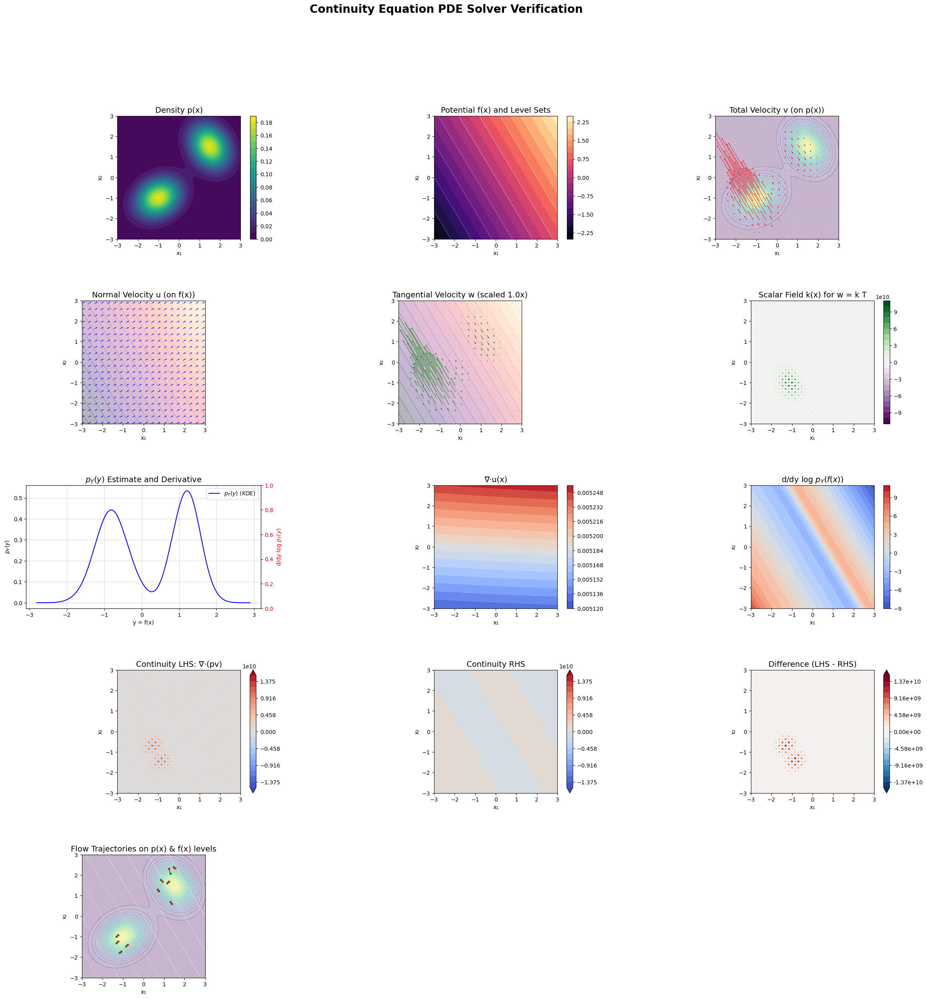

Visualization complete.


In [103]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.integrate import solve_ivp # More modern ODE solver
from scipy.stats import gaussian_kde
# For sparse matrix and solving the linear system for k(x)
from scipy.sparse import lil_matrix, csr_matrix
from scipy.sparse.linalg import spsolve
import torch

# Determine device and dtype
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DTYPE = torch.float64 # Using float64 for better numerical stability

print(f"Using device: {DEVICE}, Dtype: {DTYPE}")

# --- Helper: PyTorch 1D Linear Interpolation (from your draft) ---
class PyTorchLinearInterpolation1D(torch.nn.Module):
    def __init__(self, x_known, y_known, fill_value_mode="extrapolate", fill_value_const=None):
        super().__init__()
        sorted_indices = torch.argsort(x_known)
        self.register_buffer('x_known', x_known[sorted_indices].to(DTYPE))
        self.register_buffer('y_known', y_known[sorted_indices].to(DTYPE))
        
        self.fill_value_mode = fill_value_mode
        if fill_value_const is not None:
            self.register_buffer('fill_value_const', torch.tensor(fill_value_const, device=DEVICE, dtype=DTYPE))
        else:
            self.fill_value_const = None

    def forward(self, x_query):
        x_query = x_query.to(self.x_known.device, self.x_known.dtype)
        right_indices = torch.searchsorted(self.x_known, x_query)
        idx0 = torch.clamp(right_indices - 1, 0, len(self.x_known) - 1)
        idx1 = torch.clamp(right_indices,     0, len(self.x_known) - 1)
        
        x0, x1 = self.x_known[idx0], self.x_known[idx1]
        y0, y1 = self.y_known[idx0], self.y_known[idx1]
        denom = x1 - x0
        
        t = torch.zeros_like(x_query, device=DEVICE, dtype=DTYPE)
        valid_denom_mask = (denom != 0)
        t[valid_denom_mask] = (x_query[valid_denom_mask] - x0[valid_denom_mask]) / denom[valid_denom_mask]
        
        y_interp = y0 + t * (y1 - y0)

        left_mask = x_query < self.x_known[0]
        right_mask = x_query > self.x_known[-1]

        if self.fill_value_mode == "extrapolate":
            if torch.any(left_mask):
                slope_left = (self.y_known[1] - self.y_known[0]) / (self.x_known[1] - self.x_known[0] + 1e-12) if len(self.x_known) > 1 else torch.tensor(0.0, device=DEVICE, dtype=DTYPE)
                y_interp[left_mask] = self.y_known[0] + slope_left * (x_query[left_mask] - self.x_known[0])
            if torch.any(right_mask):
                slope_right = (self.y_known[-1] - self.y_known[-2]) / (self.x_known[-1] - self.x_known[-2] + 1e-12) if len(self.x_known) > 1 else torch.tensor(0.0, device=DEVICE, dtype=DTYPE)
                y_interp[right_mask] = self.y_known[-1] + slope_right * (x_query[right_mask] - self.x_known[-1])
        elif self.fill_value_mode == "constant" and self.fill_value_const is not None:
            y_interp[left_mask] = self.fill_value_const
            y_interp[right_mask] = self.fill_value_const
        elif self.fill_value_mode == "boundary": 
            y_interp[left_mask] = self.y_known[0]
            y_interp[right_mask] = self.y_known[-1]
        return y_interp

# --- Main Class: ContinuityPDESolver ---
class ContinuityPDESolver:
    def __init__(self, p_distribution, f_potential_func,
                 grid_range=(-3, 3), grid_points=50,
                 py_kde_samples=20000, py_num_grid_points=500, py_log_eps=1e-20,
                 k_solver_boundary_value=0.0, epsilon=1e-9):

        self.p_dist = p_distribution
        self.f_potential_func_orig = f_potential_func # Takes (N, D) tensor
        self.grid_range = grid_range
        self.grid_points = grid_points
        self.py_log_eps = py_log_eps
        self.k_solver_boundary_value = k_solver_boundary_value
        self.epsilon = torch.tensor(epsilon, device=DEVICE, dtype=DTYPE)

        self.x_coords_np = np.linspace(grid_range[0], grid_range[1], grid_points)
        self.y_coords_np = np.linspace(grid_range[0], grid_range[1], grid_points)
        self.dx = torch.tensor((self.x_coords_np[1] - self.x_coords_np[0]), device=DEVICE, dtype=DTYPE)
        self.dy = torch.tensor((self.y_coords_np[1] - self.y_coords_np[0]), device=DEVICE, dtype=DTYPE)

        # Create grid as leaf nodes for autograd
        _X_np, _Y_np = np.meshgrid(self.x_coords_np, self.y_coords_np)
        self.X_grid = torch.tensor(_X_np, dtype=DTYPE, device=DEVICE, requires_grad=True)
        self.Y_grid = torch.tensor(_Y_np, dtype=DTYPE, device=DEVICE, requires_grad=True)
        
        # Stacked grid for functions expecting (N, D) or (H, W, D)
        self.XY_grid_stacked = torch.stack([self.X_grid, self.Y_grid], dim=-1)
        
        self._setup_py_interpolators(py_kde_samples, py_num_grid_points)
        
        print("Computing all required derivatives on the grid...")
        self.grid_data = self._compute_all_grid_derivatives()
        print("Derivatives computed.")

    def f_potential_func_for_autograd(self, xy_stacked_tensor):
        # Wrapper for torch.autograd.functional needs (N,D) -> (N,) or (N,D) -> scalar sum for hessian/jacobian
        # Our original f_potential_func_orig already handles (N,D) or (H,W,D) and returns (N,) or (H,W)
        # If input is (H,W,D), output (H,W). For jacobian/hessian, flatten first.
        is_flat = (xy_stacked_tensor.ndim == 2)
        if not is_flat: # Expects (H,W,D)
            original_shape = xy_stacked_tensor.shape[:-1]
            xy_flat = xy_stacked_tensor.reshape(-1, xy_stacked_tensor.shape[-1])
            f_val_flat = self.f_potential_func_orig(xy_flat)
            return f_val_flat.reshape(original_shape)
        return self.f_potential_func_orig(xy_stacked_tensor)


    def _setup_py_interpolators(self, num_samples, num_grid_points):
        print("Setting up p_Y(y) interpolators...")
        with torch.no_grad():
            # Sample in batches if num_samples is very large to avoid OOM
            batch_size = 100000 
            y_f_samples_list = []
            for _ in range(int(np.ceil(num_samples / batch_size))):
                actual_samples = min(batch_size, num_samples - len(y_f_samples_list)*batch_size if y_f_samples_list else num_samples)
                if actual_samples <=0: break
                x_samples = self.p_dist.sample((actual_samples,)).to(DEVICE, DTYPE)
                y_f_samples_list.append(self.f_potential_func_orig(x_samples).cpu().numpy())
            y_f_samples = np.concatenate(y_f_samples_list)

        kde = gaussian_kde(y_f_samples)
        y_min, y_max = np.min(y_f_samples), np.max(y_f_samples)
        y_range_padding = (y_max - y_min) * 0.1 + 1e-5 # Add small const for stability if y_max=y_min
        y_grid_np = np.linspace(y_min - y_range_padding, y_max + y_range_padding, num_grid_points)
        py_values_np = np.maximum(kde(y_grid_np), 1e-30) # KDE can give tiny negatives

        self.y_grid_py_interp = torch.tensor(y_grid_np, device=DEVICE, dtype=DTYPE)
        self.py_values_on_grid_interp = torch.tensor(py_values_np, device=DEVICE, dtype=DTYPE)

        log_py_values = torch.log(self.py_values_on_grid_interp + self.py_log_eps)
        self.interp_log_py = PyTorchLinearInterpolation1D(self.y_grid_py_interp, log_py_values, fill_value_mode="boundary")
        
        # Compute gradient of log_py_values numerically for the interpolator
        dlogpy_dy_values = torch.gradient(log_py_values, spacing=((self.y_grid_py_interp[1] - self.y_grid_py_interp[0]).item(),))[0]
        self.interp_dlogpy_dy = PyTorchLinearInterpolation1D(self.y_grid_py_interp, dlogpy_dy_values, fill_value_mode="boundary")
        print("p_Y(y) interpolators setup complete.")

    def _compute_all_grid_derivatives(self):
        data = {}
        
        # p(x) and ∇p(x)
        # For log_prob, p_dist might expect (N,D). Reshape grid.
        flat_XY_grid = self.XY_grid_stacked.reshape(-1, 2)
        log_p_x_flat = self.p_dist.log_prob(flat_XY_grid)
        data['p_x'] = torch.exp(log_p_x_flat).reshape(self.X_grid.shape)
        
        # ∇p = p * ∇log_p
        grad_log_p_x_flat = torch.autograd.grad(log_p_x_flat.sum(), flat_XY_grid, create_graph=True)[0]
        data['grad_p_x_vec'] = data['p_x'].unsqueeze(-1) * grad_log_p_x_flat.reshape(self.XY_grid_stacked.shape)

        # f(x), ∇f(x), Hessian H_f(x), Laplacian Δf(x)
        # Use the X_grid, Y_grid that have requires_grad=True
        # It's often stabler to compute f on the stacked grid if f_potential_func_orig supports it,
        # or ensure X_grid, Y_grid are used consistently. Let's make f take X_grid, Y_grid.
        
        # To use torch.autograd.functional.jacobian/hessian, input must be (N,D) and func (N,D)->(N,)
        # Our self.f_potential_func_for_autograd is already designed for this.
        
        current_flat_XY_grid = torch.stack([self.X_grid.reshape(-1), self.Y_grid.reshape(-1)], dim=-1)
        current_flat_XY_grid.requires_grad_(True) # Ensure it's a leaf for these computations

        f_val_flat = self.f_potential_func_for_autograd(current_flat_XY_grid)
        data['f_val'] = f_val_flat.reshape(self.X_grid.shape)

        # grad_f: Use jacobian as grad is jacobian of R^D -> R function
        # The jacobian of f: (N,D) -> (N,) is a (N, D) tensor.
        # Note: jacobian needs a function that takes (D,) and returns scalar, or (N,D) -> (N,).
        # We sum the output of f_val_flat to make it scalar for grad, then unflatten.
        
        # grad_f computation
        grad_f_flat = torch.autograd.grad(f_val_flat.sum(), current_flat_XY_grid, create_graph=True)[0]
        data['grad_f_vec'] = grad_f_flat.reshape(self.XY_grid_stacked.shape)
        
        data['grad_f_norm_sq'] = torch.sum(data['grad_f_vec']**2, dim=-1)
        data['grad_f_norm'] = torch.sqrt(data['grad_f_norm_sq'] + self.epsilon)
        
        # Hessian H_f(x)
        # H_ij = d(grad_f_i) / dx_j
        # grad_f_flat has shape (N_pts, Dims)
        H_rows = []
        for i in range(current_flat_XY_grid.shape[1]): # Iterate over dimensions (0, 1 for 2D)
            # Gradient of i-th component of grad_f_flat
            # retain_graph=True because grad_f_flat graph is used multiple times
            row_i = torch.autograd.grad(grad_f_flat[:, i].sum(), current_flat_XY_grid, create_graph=True, retain_graph=True)[0]
            H_rows.append(row_i)
        
        # H_flat has shape (Dims, N_pts, Dims). We want (N_pts, Dims, Dims)
        H_flat_transposed = torch.stack(H_rows, dim=0) # (Dims, N_pts, Dims)
        data['H_f_mat'] = H_flat_transposed.permute(1,0,2).reshape(self.X_grid.shape[0], self.X_grid.shape[1], 2, 2)

        # Laplacian Δf = trace(H_f)
        data['lap_f'] = torch.diagonal(data['H_f_mat'], offset=0, dim1=-2, dim2=-1).sum(dim=-1)

        # u(x) = ∇f / ||∇f||²
        data['u_vec'] = data['grad_f_vec'] / (data['grad_f_norm_sq'].unsqueeze(-1) + self.epsilon)
        
        # û = ∇f / ||∇f||
        hat_u_vec = data['grad_f_vec'] / (data['grad_f_norm'].unsqueeze(-1) + self.epsilon)
        data['hat_u_vec'] = hat_u_vec

        # D²_û f = ûᵀ H_f û
        # H_f_mat is (H, W, D, D), hat_u_vec is (H, W, D)
        # Unsqueeze hat_u for matmul: (H,W,1,D) @ (H,W,D,D) @ (H,W,D,1)
        Hu = torch.matmul(data['H_f_mat'], hat_u_vec.unsqueeze(-1)) # (H,W,D,1)
        d2_f_hat_u_val = torch.matmul(hat_u_vec.unsqueeze(-2), Hu).squeeze(-1).squeeze(-1) # (H,W)
        data['d2_f_hat_u'] = d2_f_hat_u_val

        # ∇⋅u(x) = (Δf - 2 D²_û f) / ||∇f||²
        data['div_u'] = (data['lap_f'] - 2 * data['d2_f_hat_u']) / (data['grad_f_norm_sq'] + self.epsilon)
        
        # Interpolated dlogp_Y/dy at f(x)
        data['dlogpy_dy_at_f'] = self.interp_dlogpy_dy(data['f_val'].detach()) # Detach f_val as it's just an input to interpolator

        return data

    def _solve_for_k_finite_difference(self):
        print("Solving for k(x) using finite differences...")
        p_g = self.grid_data['p_x'].detach().cpu().numpy()
        grad_p_g_x1 = self.grid_data['grad_p_x_vec'][...,0].detach().cpu().numpy()
        grad_p_g_x2 = self.grid_data['grad_p_x_vec'][...,1].detach().cpu().numpy()
        
        grad_f_g_x1 = self.grid_data['grad_f_vec'][...,0].detach().cpu().numpy()
        grad_f_g_x2 = self.grid_data['grad_f_vec'][...,1].detach().cpu().numpy()
        
        u_g_x1 = self.grid_data['u_vec'][...,0].detach().cpu().numpy()
        u_g_x2 = self.grid_data['u_vec'][...,1].detach().cpu().numpy()
        
        dlogpy_dy_at_f_g = self.grid_data['dlogpy_dy_at_f'].detach().cpu().numpy()

        N = self.grid_points
        
        # Tangential vector T = (-∂f/∂x₂, ∂f/∂x₁)
        T_x1_g = -grad_f_g_x2
        T_x2_g = grad_f_g_x1
        
        # Coefficients of PDE for k: A ∂k/∂x₁ + B ∂k/∂x₂ + C k = D
        # Assuming ∇⋅T = 0 (since f is C²)
        A_coeff = p_g * T_x1_g
        B_coeff = p_g * T_x2_g
        C_coeff = grad_p_g_x1 * T_x1_g + grad_p_g_x2 * T_x2_g # This is ∇p⋅T
        
        RHS_D = - (grad_p_g_x1 * u_g_x1 + grad_p_g_x2 * u_g_x2) + p_g * dlogpy_dy_at_f_g
        
        # Setup sparse matrix for Mk = D_rhs
        total_points = N * N
        # Using LIL format for easier construction, then convert to CSR for solving
        M_matrix = lil_matrix((total_points, total_points), dtype=np.float64)
        D_rhs_vec = np.zeros(total_points, dtype=np.float64)

        dx_np = self.dx.item()
        dy_np = self.dy.item()

        for r in range(N): # row index (y-coordinate)
            for c in range(N): # col index (x-coordinate)
                idx = r * N + c # Flattened index
                
                # Fill RHS vector
                D_rhs_vec[idx] = RHS_D[r, c]
                
                # Fill Matrix M
                # C_coeff term (diagonal)
                M_matrix[idx, idx] = C_coeff[r, c]
                
                # Boundary conditions: k = k_solver_boundary_value on all boundaries
                # If on boundary, equation is just k_idx = boundary_val
                if r == 0 or r == N - 1 or c == 0 or c == N - 1:
                    M_matrix[idx, idx] = 1.0 # Overwrite C_coeff or other terms
                    D_rhs_vec[idx] = self.k_solver_boundary_value
                    # Zero out other connections for this boundary point's row
                    # This is implicitly handled if we build M for internal points and fill boundary k later
                    # For simplicity, let's make the boundary rows trivial k_idx = boundary_val
                    # Find non-zero elements in this row and set them to 0 if not diagonal
                    # This is complex with LIL. It's easier to set M_matrix[idx,j]=0 for j!=idx.
                    # But LIL format makes this inefficient to iterate.
                    # Better to build for internal points and adjust.
                    # For now, this simple setup:
                    if r > 0: M_matrix[idx, idx - N] = 0 # k(r-1,c)
                    if r < N-1: M_matrix[idx, idx + N] = 0 # k(r+1,c)
                    if c > 0: M_matrix[idx, idx - 1] = 0 # k(r,c-1)
                    if c < N-1: M_matrix[idx, idx + 1] = 0 # k(r,c+1)
                    continue # Skip finite difference for boundary points with fixed k

                # Finite difference for A * ∂k/∂x₁ (central difference)
                # ∂k/∂x₁ ~ (k(r,c+1) - k(r,c-1)) / (2*dx)
                M_matrix[idx, idx + 1] += A_coeff[r, c] / (2 * dx_np)
                M_matrix[idx, idx - 1] -= A_coeff[r, c] / (2 * dx_np)
                
                # Finite difference for B * ∂k/∂x₂ (central difference)
                # ∂k/∂x₂ ~ (k(r+1,c) - k(r-1,c)) / (2*dy)
                # Note: r maps to y, c maps to x. So k(r+1,c) is k_up, k(r-1,c) is k_down.
                M_matrix[idx, idx + N] += B_coeff[r, c] / (2 * dy_np) # k(r+1,c)
                M_matrix[idx, idx - N] -= B_coeff[r, c] / (2 * dy_np) # k(r-1,c)

        # Convert to CSR for efficient solving
        M_csr = M_matrix.tocsr()
        
        # Add regularization to diagonal for stability if needed, esp. if C_coeff is small
        # M_csr += scipy.sparse.eye(total_points) * 1e-6

        print("Solving linear system for k...")
        try:
            k_flat = spsolve(M_csr, D_rhs_vec)
            print("Linear system solved.")
        except Exception as e:
            print(f"Solving k failed: {e}. Using least squares.")
            # Fallback to least squares if spsolve fails (e.g. singular matrix)
            k_flat, istop, itn, normr = scipy.sparse.linalg.lsmr(M_csr, D_rhs_vec, atol=1e-8, btol=1e-8, conlim=1e5, maxiter=2000)[:4]
            print(f"LSMR finished: istop={istop}, itn={itn}, normr={normr}")

        k_grid = torch.tensor(k_flat.reshape((N, N)), device=DEVICE, dtype=DTYPE)
        self.grid_data['k_val'] = k_grid
        
        # Compute w(x) = k(x)T(x)
        T_x1_g_torch = torch.tensor(T_x1_g, device=DEVICE, dtype=DTYPE)
        T_x2_g_torch = torch.tensor(T_x2_g, device=DEVICE, dtype=DTYPE)
        
        w_x1 = k_grid * T_x1_g_torch
        w_x2 = k_grid * T_x2_g_torch
        self.grid_data['w_vec'] = torch.stack([w_x1, w_x2], dim=-1)
        
        # Compute v(x) = u(x) + w(x)
        self.grid_data['v_vec'] = self.grid_data['u_vec'] + self.grid_data['w_vec']
        return k_grid

    def compute_continuity_equation_terms_for_verification(self):
        print("Computing LHS and RHS of the main continuity equation for verification...")
        p_val = self.grid_data['p_x']
        v_x1_val = self.grid_data['v_vec'][..., 0]
        v_x2_val = self.grid_data['v_vec'][..., 1]

        # LHS: ∇⋅(pv)
        # We want d(p*v_x1)/dx1 + d(p*v_x2)/dx2
        # For a grid where dim 0 is y-axis and dim 1 is x-axis:
        # dF/dx1 corresponds to gradient along dim 1
        # dF/dx2 corresponds to gradient along dim 0
        
        # Let F1 = p_val * v_x1_val and F2 = p_val * v_x2_val
        # Spacing is (dy, dx)
        
        # Calculate gradient of F1 = p*v_x1
        # grad_F1_wrt_y (dim0), grad_F1_wrt_x (dim1)
        _, dF1_dx1 = torch.gradient(p_val * v_x1_val, spacing=(self.dy.item(), self.dx.item()), edge_order=2)
        
        # Calculate gradient of F2 = p*v_x2
        # grad_F2_wrt_y (dim0), grad_F2_wrt_x (dim1)
        dF2_dx2, _ = torch.gradient(p_val * v_x2_val, spacing=(self.dy.item(), self.dx.item()), edge_order=2)
        
        self.grid_data['lhs_continuity'] = dF1_dx1 + dF2_dx2
        
        # RHS: p(x) * ( d/dy log p_Y(f(x)) + ∇⋅u(x) )
        dlogpy_dy_at_f_val = self.grid_data['dlogpy_dy_at_f']
        div_u_val = self.grid_data['div_u']
        self.grid_data['rhs_continuity'] = p_val * (dlogpy_dy_at_f_val + div_u_val)
        
        self.grid_data['diff_continuity'] = self.grid_data['lhs_continuity'] - self.grid_data['rhs_continuity']
        print("LHS and RHS computed.")

    def get_velocity_field_for_ode(self):
        # Create interpolators for v_x1 and v_x2 if needed, or recompute on the fly for ODE.
        # For now, let's assume we might need to interpolate if ODE solver queries off-grid.
        # SciPy's solve_ivp typically requires a function v(t, xy) where xy is (D,) numpy array.
        
        # Store necessary components from self.grid_data that are on DEVICE
        # For ODE: p, ∇p, f, ∇f, H_f, u, ∇.u, pY', k
        # This is complex. A simpler approach is to interpolate the final v_vec.
        
        v_x1_np = self.grid_data['v_vec'][...,0].cpu().detach().numpy()
        v_x2_np = self.grid_data['v_vec'][...,1].cpu().detach().numpy()

        # Create 2D interpolators
        from scipy.interpolate import RegularGridInterpolator
        rgi_vx1 = RegularGridInterpolator((self.y_coords_np, self.x_coords_np), v_x1_np, bounds_error=False, fill_value=0)
        rgi_vx2 = RegularGridInterpolator((self.y_coords_np, self.x_coords_np), v_x2_np, bounds_error=False, fill_value=0)

        def velocity_fn_for_ode(xy_np,t):
            # xy_np is [x1, x2]
            # RegularGridInterpolator expects points as (N_pts, Dims), with y_coord first then x_coord.
            point = np.array([[xy_np[1], xy_np[0]]]) # Query point as (y,x)
            vx1 = rgi_vx1(point)[0]
            vx2 = rgi_vx2(point)[0]
            return np.array([vx1, vx2])
            
        return velocity_fn_for_ode

# --- Visualization Function (adapted from your draft) ---
def visualize_results(solver_instance, save_path=None):
    print("Starting visualization generation...")
    s = solver_instance # shorter name
    grid_data = s.grid_data
    
    X_np = s.X_grid.cpu().detach().numpy()
    Y_np = s.Y_grid.cpu().detach().numpy()

    to_np = lambda t: t.cpu().detach().numpy()

    p_x_np = to_np(grid_data['p_x'])
    f_val_np = to_np(grid_data['f_val'])
    u_x1_np = to_np(grid_data['u_vec'][...,0])
    u_x2_np = to_np(grid_data['u_vec'][...,1])
    w_x1_np = to_np(grid_data['w_vec'][...,0])
    w_x2_np = to_np(grid_data['w_vec'][...,1])
    v_x1_np = to_np(grid_data['v_vec'][...,0])
    v_x2_np = to_np(grid_data['v_vec'][...,1])
    
    k_val_np = to_np(grid_data.get('k_val', torch.zeros_like(s.X_grid)))

    lhs_np = to_np(grid_data['lhs_continuity'])
    rhs_np = to_np(grid_data['rhs_continuity'])
    diff_np = to_np(grid_data['diff_continuity'])
    
    div_u_np = to_np(grid_data['div_u'])
    dlogpy_dy_at_f_np = to_np(grid_data['dlogpy_dy_at_f'])

    # ... (rest of the plotting setup as in your original code) ...
    fig = plt.figure(figsize=(28, 28)) 
    gs = gridspec.GridSpec(5, 3, figure=fig, hspace=0.5, wspace=0.35)

    ax_px = fig.add_subplot(gs[0, 0])
    cs_px = ax_px.contourf(X_np, Y_np, p_x_np, levels=20, cmap='viridis')
    ax_px.set_title('Density p(x)', fontsize=14)
    ax_px.set_xlabel('x₁'); ax_px.set_ylabel('x₂'); ax_px.set_aspect('equal')
    plt.colorbar(cs_px, ax=ax_px, fraction=0.046, pad=0.04)

    ax_fx = fig.add_subplot(gs[0, 1])
    cs_fx = ax_fx.contourf(X_np, Y_np, f_val_np, levels=20, cmap='magma')
    ax_fx.contour(X_np, Y_np, f_val_np, levels=10, colors='white', linewidths=0.5, alpha=0.7)
    ax_fx.set_title('Potential f(x) and Level Sets', fontsize=14)
    ax_fx.set_xlabel('x₁'); ax_fx.set_ylabel('x₂'); ax_fx.set_aspect('equal')
    plt.colorbar(cs_fx, ax=ax_fx, fraction=0.046, pad=0.04)

    ax_v = fig.add_subplot(gs[0, 2])
    ax_v.contourf(X_np, Y_np, p_x_np, levels=20, cmap='viridis', alpha=0.3)
    skip = max(1, s.grid_points // 15)
    ax_v.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], v_x1_np[::skip,::skip], v_x2_np[::skip,::skip],
              color='red', scale_units='xy', angles='xy', width=0.003, headwidth=3, headlength=4)
    ax_v.set_title('Total Velocity v (on p(x))', fontsize=14)
    ax_v.set_xlabel('x₁'); ax_v.set_ylabel('x₂'); ax_v.set_aspect('equal')
    ax_v.set_xlim(s.grid_range); ax_v.set_ylim(s.grid_range)

    ax_u = fig.add_subplot(gs[1, 0])
    ax_u.contourf(X_np, Y_np, f_val_np, levels=20, cmap='magma', alpha=0.3)
    ax_u.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], u_x1_np[::skip,::skip], u_x2_np[::skip,::skip],
              color='blue', scale_units='xy', angles='xy', width=0.003, headwidth=3, headlength=4)
    ax_u.set_title('Normal Velocity u (on f(x))', fontsize=14)
    ax_u.set_xlabel('x₁'); ax_u.set_ylabel('x₂'); ax_u.set_aspect('equal')
    ax_u.set_xlim(s.grid_range); ax_u.set_ylim(s.grid_range)

    ax_w = fig.add_subplot(gs[1, 1])
    ax_w.contourf(X_np, Y_np, f_val_np, levels=20, cmap='magma', alpha=0.3)
    v_mag_perc = np.percentile(np.sqrt(v_x1_np**2 + v_x2_np**2), 95)
    w_mag_perc = np.percentile(np.sqrt(w_x1_np**2 + w_x2_np**2), 95)
    w_scale_factor = v_mag_perc / (w_mag_perc + 1e-9) if w_mag_perc > 1e-9 else 1.0
    w_scale_factor = np.clip(w_scale_factor, 0.1, 10.0) 
    
    ax_w.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], 
                w_x1_np[::skip,::skip]*w_scale_factor, w_x2_np[::skip,::skip]*w_scale_factor,
                color='green', scale_units='xy', angles='xy', width=0.003, headwidth=3, headlength=4)
    ax_w.set_title(f'Tangential Velocity w (scaled {w_scale_factor:.1f}x)', fontsize=14)
    ax_w.set_xlabel('x₁'); ax_w.set_ylabel('x₂'); ax_w.set_aspect('equal')
    ax_w.set_xlim(s.grid_range); ax_w.set_ylim(s.grid_range)
    
    ax_k = fig.add_subplot(gs[1, 2])
    cs_k = ax_k.contourf(X_np, Y_np, k_val_np, levels=20, cmap='PRGn')
    ax_k.set_title('Scalar Field k(x) for w = k T', fontsize=14)
    ax_k.set_xlabel('x₁'); ax_k.set_ylabel('x₂'); ax_k.set_aspect('equal')
    plt.colorbar(cs_k, ax=ax_k, fraction=0.046, pad=0.04)

    ax_py_marg = fig.add_subplot(gs[2, 0])
    ax_py_marg.plot(s.y_grid_py_interp.cpu().numpy(), s.py_values_on_grid_interp.cpu().numpy(), 'b-', label='$p_Y(y)$ (KDE)')
    ax_py_marg.set_xlabel('y = f(x)'); ax_py_marg.set_ylabel('$p_Y(y)$')
    ax_py_marg.set_title('$p_Y(y)$ Estimate and Derivative', fontsize=14)
    ax_py_marg.grid(True, alpha=0.5)
    ax_py_marg_twin = ax_py_marg.twinx()
    # dlogpy_dy_on_grid_interp = s.interp_dlogpy_dy(s.y_grid_py_interp)
    # ax_py_marg_twin.plot(s.y_grid_py_interp.cpu().numpy(), to_np(dlogpy_dy_on_grid_interp), 'r--', label='d/dy log $p_Y(y)$ (interp)')
    ax_py_marg_twin.set_ylabel('d/dy log $p_Y(y)$', color='r')
    ax_py_marg_twin.tick_params(axis='y', labelcolor='r')
    lines, labels = ax_py_marg.get_legend_handles_labels()
    lines2, labels2 = ax_py_marg_twin.get_legend_handles_labels()
    ax_py_marg_twin.legend(lines + lines2, labels + labels2, loc='best')

    ax_div_u = fig.add_subplot(gs[2, 1])
    cs_div_u = ax_div_u.contourf(X_np, Y_np, div_u_np, levels=20, cmap='coolwarm')
    ax_div_u.set_title('∇⋅u(x)', fontsize=14)
    ax_div_u.set_xlabel('x₁'); ax_div_u.set_ylabel('x₂'); ax_div_u.set_aspect('equal')
    plt.colorbar(cs_div_u, ax=ax_div_u, fraction=0.046, pad=0.04)

    ax_dlogpy = fig.add_subplot(gs[2, 2])
    cs_dlogpy = ax_dlogpy.contourf(X_np, Y_np, dlogpy_dy_at_f_np, levels=20, cmap='coolwarm')
    ax_dlogpy.set_title('d/dy log $p_Y(f(x))$', fontsize=14)
    ax_dlogpy.set_xlabel('x₁'); ax_dlogpy.set_ylabel('x₂'); ax_dlogpy.set_aspect('equal')
    plt.colorbar(cs_dlogpy, ax=ax_dlogpy, fraction=0.046, pad=0.04)

    ax_lhs = fig.add_subplot(gs[3, 0])
    val_max_abs = max(np.abs(lhs_np).max(), np.abs(rhs_np).max(), 1e-9) 
    lh_levels = np.linspace(-val_max_abs, val_max_abs, 21)
    cs_lhs = ax_lhs.contourf(X_np, Y_np, lhs_np, levels=lh_levels, cmap='coolwarm', extend='both')
    ax_lhs.set_title('Continuity LHS: ∇⋅(pv)', fontsize=14)
    ax_lhs.set_xlabel('x₁'); ax_lhs.set_ylabel('x₂'); ax_lhs.set_aspect('equal')
    plt.colorbar(cs_lhs, ax=ax_lhs, fraction=0.046, pad=0.04)

    ax_rhs = fig.add_subplot(gs[3, 1])
    cs_rhs = ax_rhs.contourf(X_np, Y_np, rhs_np, levels=lh_levels, cmap='coolwarm', extend='both')
    ax_rhs.set_title('Continuity RHS', fontsize=14)
    ax_rhs.set_xlabel('x₁'); ax_rhs.set_ylabel('x₂'); ax_rhs.set_aspect('equal')
    plt.colorbar(cs_rhs, ax=ax_rhs, fraction=0.046, pad=0.04)

    ax_diff = fig.add_subplot(gs[3, 2])
    max_abs_diff = np.max(np.abs(diff_np))
    diff_levels = np.linspace(-max_abs_diff, max_abs_diff, 21) if max_abs_diff > 1e-9 else np.linspace(-1,1,21)
    cs_diff = ax_diff.contourf(X_np, Y_np, diff_np, levels=diff_levels, cmap='RdBu_r', extend='both')
    ax_diff.set_title('Difference (LHS - RHS)', fontsize=14)
    ax_diff.set_xlabel('x₁'); ax_diff.set_ylabel('x₂'); ax_diff.set_aspect('equal')
    plt.colorbar(cs_diff, ax=ax_diff, fraction=0.046, pad=0.04, format="%.2e")
    
    ax_traj = fig.add_subplot(gs[4, 0])
    ax_traj.contourf(X_np, Y_np, p_x_np, levels=20, cmap='viridis', alpha=0.3)
    ax_traj.contour(X_np, Y_np, f_val_np, levels=10, colors='white', linewidths=0.7, alpha=0.5)
    
    start_points_np = []
    p_thresh = np.percentile(p_x_np, 85) 
    high_p_indices = np.argwhere(p_x_np > p_thresh)
    if len(high_p_indices) > 0:
        selected_indices = high_p_indices[np.random.choice(len(high_p_indices), size=min(10, len(high_p_indices)), replace=False)]
        for idx_pair in selected_indices: 
            start_points_np.append([X_np[idx_pair[0], idx_pair[1]], Y_np[idx_pair[0], idx_pair[1]]])
    else: 
        for r_val_frac in np.linspace(0.2, 0.6, 3):
             for theta_val in np.linspace(0, 2*np.pi, 3, endpoint=False):
                r_actual = r_val_frac * (s.grid_range[1] - s.grid_range[0])/2
                start_points_np.append([r_actual*np.cos(theta_val), r_actual*np.sin(theta_val)])
    
    # ODE integration part
    print(f"Plotting {len(start_points_np)} trajectories using odeint...") # Removed duplicate print
    ode_velocity_func = s.get_velocity_field_for_ode()
    t_span_val = abs(s.grid_range[1]-s.grid_range[0])*0.8 
    
    for start_pt_np in start_points_np:
        t_eval_points = np.linspace(0, t_span_val, 50) # Renamed from t_span for clarity with odeint's 't' argument
        try:
            # Using odeint
            trajectory = odeint(ode_velocity_func, start_pt_np, t_eval_points, rtol=1e-4, atol=1e-5)
            ax_traj.plot(trajectory[:, 0], trajectory[:, 1], 'k-', linewidth=1.0, alpha=0.8)
            ax_traj.plot(trajectory[0, 0], trajectory[0, 1], 'go', markersize=3) # Start
            ax_traj.plot(trajectory[-1, 0], trajectory[-1, 1], 'ro', markersize=3) # End
        except Exception as e:
            print(f"Error in ODE integration (odeint) for start point {start_pt_np}: {e}")
            
    ax_traj.set_title('Flow Trajectories on p(x) & f(x) levels', fontsize=14)
    ax_traj.set_xlabel('x₁'); ax_traj.set_ylabel('x₂'); ax_traj.set_aspect('equal')
    ax_traj.set_xlim(s.grid_range); ax_traj.set_ylim(s.grid_range)

    plt.tight_layout()
    fig.suptitle('Continuity Equation PDE Solver Verification', fontsize=20, fontweight='bold')

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Visualization saved to {save_path}")
    plt.show()
    print("Visualization complete.")

# ... (rest of your existing __main__ block) ...
if __name__ == "__main__":
    # --- Define p(x) ---
    # Example: Mixture of two Gaussians
    mix = torch.distributions.Categorical(torch.tensor([0.5, 0.5], device=DEVICE, dtype=DTYPE))
    comp_means = torch.tensor([[-1.0, -1.0], [1.5, 1.5]], device=DEVICE, dtype=DTYPE)
    comp_cov_mats = torch.stack([
        torch.tensor([[0.5, 0.1], [0.1, 0.4]], device=DEVICE, dtype=DTYPE),
        torch.tensor([[0.4, -0.1], [-0.1, 0.5]], device=DEVICE, dtype=DTYPE)
    ])
    comp = torch.distributions.MultivariateNormal(comp_means, comp_cov_mats)
    p_distribution = torch.distributions.MixtureSameFamily(mix, comp)

    # Alternative p(x): Simple Gaussian
    # mean_px = torch.tensor([0.0, 0.0], device=DEVICE, dtype=DTYPE)
    # covariance_px = torch.tensor([[0.8, 0.0], [0.0, 0.8]], device=DEVICE, dtype=DTYPE)
    # p_distribution = torch.distributions.MultivariateNormal(mean_px, covariance_px)


    # --- Define f(x) ---
    # Input x is (N, 2) or (H, W, 2) for grid, output (N,) or (H,W)
    def f_potential(xy_tensor):
        x1 = xy_tensor[..., 0]
        x2 = xy_tensor[..., 1]
        # Example: A non-trivial potential
        return 0.5 * x1 + 0.3 * x2 -0.001*x1*x2#0.5 * x1**2 + torch.sin(x2) + 0.2 * x1 * x2 - x1
        # Example: Simple quadratic
        # return 0.5 * x1**2 + 0.3 * x2**2 
        # Example: Linear
        # return x1 + x2


    # --- Initialize and Run Solver ---
    solver = ContinuityPDESolver(
        p_distribution, 
        f_potential,
        grid_range=(-3, 3), # Adjusted for typical distributions
        grid_points=40,     # Reduce for faster testing, increase for accuracy (e.g., 50-70)
        py_kde_samples=20000,
        py_num_grid_points=300,
        k_solver_boundary_value=0.0 # Assume k is zero at far boundaries
    )

    # Solve for k and compute velocities
    solver._solve_for_k_finite_difference() # This computes k, w, v and stores in grid_data

    # Verify the main continuity equation
    solver.compute_continuity_equation_terms_for_verification()

    # Visualize
    visualize_results(solver, save_path="continuity_pde_solver_verification.png")


Using device: cpu, Dtype: torch.float64
Setting up p_Y(y) interpolators...
p_Y(y) interpolators setup complete.
Computing all required derivatives on the grid...
Derivatives computed.
Solving for k(x) using finite differences...
Solving linear system for k...
Linear system solved with spsolve.
Computing LHS and RHS of the main continuity equation for verification...
LHS and RHS for continuity equation computed.
Starting visualization generation...
Plotting 10 trajectories using solve_ivp, t_end approx 0.00...


/var/folders/nc/zbqbbkkx08z7v1g3mlf8bdn00000gn/T/ipykernel_23200/2944096060.py:561: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust layout to make space for suptitle


Visualization saved to continuity_pde_solver_results.png


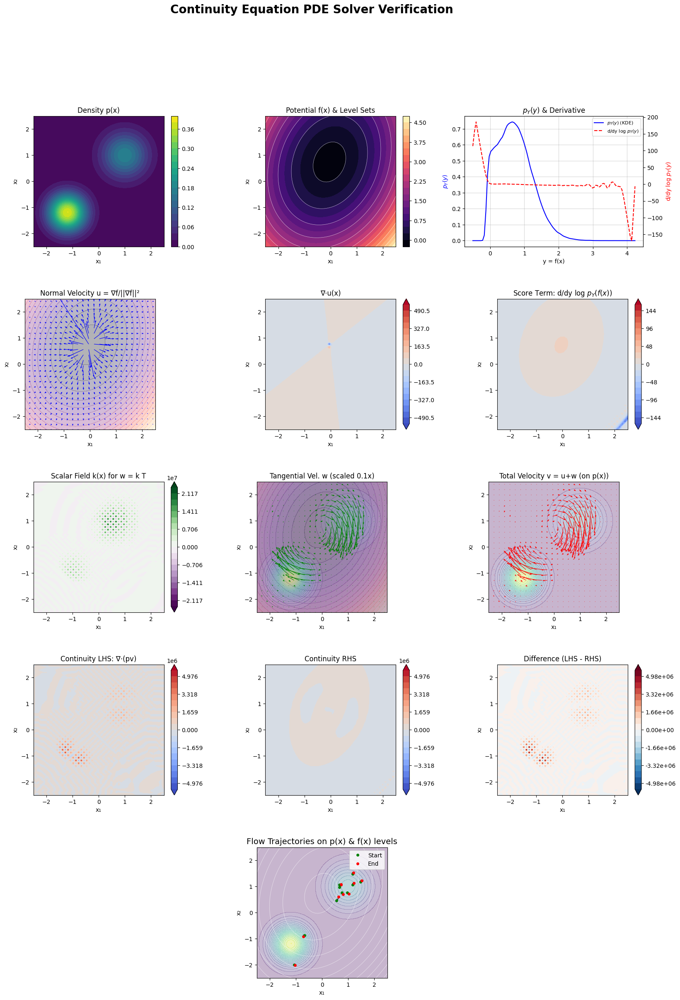

Visualization complete.


In [96]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.integrate import solve_ivp # Using solve_ivp as it's more modern
from scipy.stats import gaussian_kde
from scipy.interpolate import RegularGridInterpolator
from scipy.sparse import lil_matrix, csr_matrix
from scipy.sparse.linalg import spsolve, lsmr
import scipy.sparse
import torch

# Determine device and dtype
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DTYPE = torch.float64 # Using float64 for better numerical stability

print(f"Using device: {DEVICE}, Dtype: {DTYPE}")

# --- Helper: PyTorch 1D Linear Interpolation ---
class PyTorchLinearInterpolation1D(torch.nn.Module):
    def __init__(self, x_known, y_known, fill_value_mode="extrapolate", fill_value_const=None):
        super().__init__()
        # Ensure x_known and y_known are tensors on the correct device and dtype
        x_known = torch.as_tensor(x_known, device=DEVICE, dtype=DTYPE)
        y_known = torch.as_tensor(y_known, device=DEVICE, dtype=DTYPE)

        sorted_indices = torch.argsort(x_known)
        self.register_buffer('x_known', x_known[sorted_indices])
        self.register_buffer('y_known', y_known[sorted_indices])

        self.fill_value_mode = fill_value_mode
        if fill_value_const is not None:
            self.register_buffer('fill_value_const', torch.tensor(fill_value_const, device=DEVICE, dtype=DTYPE))
        else:
            self.fill_value_const = None

    def forward(self, x_query):
        x_query = torch.as_tensor(x_query, device=self.x_known.device, dtype=self.x_known.dtype)
        
        # Handle cases with very few known points
        if len(self.x_known) == 0:
            return torch.zeros_like(x_query) + (self.fill_value_const if self.fill_value_const is not None else torch.nan)
        if len(self.x_known) == 1:
            if self.fill_value_mode == "constant" and self.fill_value_const is not None:
                 return torch.zeros_like(x_query) + self.fill_value_const
            return torch.zeros_like(x_query) + self.y_known[0]


        right_indices = torch.searchsorted(self.x_known, x_query)
        idx0 = torch.clamp(right_indices - 1, 0, len(self.x_known) - 1)
        idx1 = torch.clamp(right_indices, 0, len(self.x_known) - 1)

        x0, x1 = self.x_known[idx0], self.x_known[idx1]
        y0, y1 = self.y_known[idx0], self.y_known[idx1]
        
        denom = x1 - x0
        # Avoid division by zero for points where x0 == x1 (e.g., query coincides with a known point)
        # In this case, t should be 0 if x_query == x0, or 1 if x_query == x1 (which idx logic handles)
        # More robustly, if x0=x1, then y_interp = y0 (or y1).
        t = torch.zeros_like(x_query, device=DEVICE, dtype=DTYPE)
        # Create a mask for valid denominators (non-zero)
        valid_denom_mask = (denom != 0)
        t[valid_denom_mask] = (x_query[valid_denom_mask] - x0[valid_denom_mask]) / denom[valid_denom_mask]
        # For cases where denom is 0 (x0=x1), x_query should be equal to x0 (or x1).
        # If x_query = x0 = x1, then t can be 0. y_interp = y0.
        # If idx0 == idx1, it means x_query is outside the range or exactly at a boundary point handled by clamping.
        # If x_query == x_known[j], idx0=j, idx1=j (if not boundary) or idx0=j-1,idx1=j. searchsorted can give idx for exact match.
        # If x0 == x1, it means idx0 == idx1. In this case, y_interp = y0. `t` being 0 works.
        
        y_interp = y0 + t * (y1 - y0)

        # Handle out-of-bounds cases
        left_mask = x_query < self.x_known[0]
        right_mask = x_query > self.x_known[-1]

        if self.fill_value_mode == "extrapolate":
            if torch.any(left_mask):
                # Ensure there are at least two points for slope calculation
                slope_left = (self.y_known[1] - self.y_known[0]) / (self.x_known[1] - self.x_known[0] + 1e-12) if len(self.x_known) > 1 else torch.tensor(0.0, device=DEVICE, dtype=DTYPE)
                y_interp[left_mask] = self.y_known[0] + slope_left * (x_query[left_mask] - self.x_known[0])
            if torch.any(right_mask):
                slope_right = (self.y_known[-1] - self.y_known[-2]) / (self.x_known[-1] - self.x_known[-2] + 1e-12) if len(self.x_known) > 1 else torch.tensor(0.0, device=DEVICE, dtype=DTYPE)
                y_interp[right_mask] = self.y_known[-1] + slope_right * (x_query[right_mask] - self.x_known[-1])
        elif self.fill_value_mode == "constant" and self.fill_value_const is not None:
            y_interp[left_mask] = self.fill_value_const
            y_interp[right_mask] = self.fill_value_const
        elif self.fill_value_mode == "boundary":
            y_interp[left_mask] = self.y_known[0]
            y_interp[right_mask] = self.y_known[-1]
        
        # Ensure no NaNs if t was undefined but masked (e.g. if x0=x1 and x_query is exactly that point)
        # This should be handled by idx0=idx1 -> y_interp = y0.
        y_interp[torch.isnan(y_interp) & (x0==x1)] = y0[torch.isnan(y_interp) & (x0==x1)]

        return y_interp

# --- Main Class: ContinuityPDESolver ---
class ContinuityPDESolver:
    def __init__(self, p_distribution, f_potential_func,
                 grid_range=(-3, 3), grid_points=50,
                 py_kde_samples=20000, py_num_grid_points=500, py_log_eps=1e-20,
                 k_solver_boundary_value=0.0, k_solver_reg_param=1e-6, epsilon=1e-9):

        self.p_dist = p_distribution
        self.f_potential_func_orig = f_potential_func
        self.grid_range = grid_range
        self.grid_points = grid_points
        self.py_log_eps = torch.tensor(py_log_eps, device=DEVICE, dtype=DTYPE)
        self.k_solver_boundary_value = k_solver_boundary_value
        self.k_solver_reg_param = k_solver_reg_param
        self.epsilon = torch.tensor(epsilon, device=DEVICE, dtype=DTYPE)

        self.x_coords_np = np.linspace(grid_range[0], grid_range[1], grid_points, dtype=np.float64)
        self.y_coords_np = np.linspace(grid_range[0], grid_range[1], grid_points, dtype=np.float64) # y-coordinates for the grid (x2)
        self.dx = torch.tensor((self.x_coords_np[1] - self.x_coords_np[0]), device=DEVICE, dtype=DTYPE)
        self.dy = torch.tensor((self.y_coords_np[1] - self.y_coords_np[0]), device=DEVICE, dtype=DTYPE) # Spacing for y-coordinates (x2)

        _X_np, _Y_np = np.meshgrid(self.x_coords_np, self.y_coords_np)
        self.X_grid = torch.tensor(_X_np, dtype=DTYPE, device=DEVICE, requires_grad=False) # x1 coordinates
        self.Y_grid = torch.tensor(_Y_np, dtype=DTYPE, device=DEVICE, requires_grad=False) # x2 coordinates
        
        # For autograd, create versions that require grad if functions need them as inputs
        self.X_grid_ag = self.X_grid.clone().detach().requires_grad_(True)
        self.Y_grid_ag = self.Y_grid.clone().detach().requires_grad_(True)

        self.XY_grid_stacked = torch.stack([self.X_grid, self.Y_grid], dim=-1)
        self.XY_grid_stacked_ag = torch.stack([self.X_grid_ag, self.Y_grid_ag], dim=-1)


        self._setup_py_interpolators(py_kde_samples, py_num_grid_points)

        print("Computing all required derivatives on the grid...")
        self.grid_data = self._compute_all_grid_derivatives()
        print("Derivatives computed.")

    def f_potential_func_for_autograd(self, xy_stacked_tensor_ag):
        # Wrapper for torch.autograd.functional needs (N,D) -> (N,) or (N,D) -> scalar sum for hessian/jacobian
        # Our original f_potential_func_orig already handles (N,D) or (H,W,D) and returns (N,) or (H,W)
        is_flat = (xy_stacked_tensor_ag.ndim == 2)
        if not is_flat: # Expects (H,W,D)
            original_shape = xy_stacked_tensor_ag.shape[:-1]
            xy_flat = xy_stacked_tensor_ag.reshape(-1, xy_stacked_tensor_ag.shape[-1])
            f_val_flat = self.f_potential_func_orig(xy_flat)
            return f_val_flat.reshape(original_shape)
        return self.f_potential_func_orig(xy_stacked_tensor_ag)

    def _setup_py_interpolators(self, num_samples, num_grid_points):
        print("Setting up p_Y(y) interpolators...")
        with torch.no_grad():
            batch_size = 100000 
            y_f_samples_list = []
            current_samples = 0
            while current_samples < num_samples:
                actual_batch_size = min(batch_size, num_samples - current_samples)
                if actual_batch_size <= 0: break
                # Sample on CPU first if p_dist is not on DEVICE or if sampling is faster on CPU
                x_samples_cpu = self.p_dist.sample((actual_batch_size,))
                x_samples = x_samples_cpu.to(device=DEVICE, dtype=DTYPE)
                y_f_samples_list.append(self.f_potential_func_orig(x_samples).cpu().numpy())
                current_samples += actual_batch_size
            
            y_f_samples = np.concatenate(y_f_samples_list)

            kde = gaussian_kde(y_f_samples, bw_method='scott')
            y_min, y_max = np.min(y_f_samples), np.max(y_f_samples)
            y_range_padding = (y_max - y_min) * 0.1 + 1e-5 
            y_grid_np = np.linspace(y_min - y_range_padding, y_max + y_range_padding, num_grid_points, dtype=np.float64)
            py_values_np = np.maximum(kde(y_grid_np), 1e-30) 

            self.y_grid_py_interp = torch.tensor(y_grid_np, device=DEVICE, dtype=DTYPE)
            self.py_values_on_grid_interp = torch.tensor(py_values_np, device=DEVICE, dtype=DTYPE)

            log_py_values = torch.log(self.py_values_on_grid_interp + self.py_log_eps)
            self.interp_log_py = PyTorchLinearInterpolation1D(self.y_grid_py_interp, log_py_values, fill_value_mode="boundary")

            if len(self.y_grid_py_interp) > 1:
                spacing_val = (self.y_grid_py_interp[1] - self.y_grid_py_interp[0]).item()
                dlogpy_dy_values = torch.gradient(log_py_values, spacing=(spacing_val,))[0]
            else: # Handle single point case for gradient
                dlogpy_dy_values = torch.zeros_like(log_py_values)
            self.interp_dlogpy_dy = PyTorchLinearInterpolation1D(self.y_grid_py_interp, dlogpy_dy_values, fill_value_mode="boundary")
        print("p_Y(y) interpolators setup complete.")

    def _compute_all_grid_derivatives(self):
        data = {}
        
        # Use the _ag (autograd) version of the grid for computations involving derivatives
        # Reshape for functions expecting (N, D)
        flat_XY_grid_ag = self.XY_grid_stacked_ag.reshape(-1, 2)

        # p(x) and ∇p(x)
        log_p_x_flat = self.p_dist.log_prob(flat_XY_grid_ag)
        data['p_x'] = torch.exp(log_p_x_flat).reshape(self.X_grid.shape)
        
        grad_log_p_x_flat = torch.autograd.grad(log_p_x_flat.sum(), flat_XY_grid_ag, create_graph=True)[0]
        data['grad_p_x_vec'] = data['p_x'].unsqueeze(-1) * grad_log_p_x_flat.reshape(self.XY_grid_stacked_ag.shape)

        # f(x), ∇f(x), Hessian H_f(x), Laplacian Δf(x)
        # f_potential_func_for_autograd expects (N,D)
        f_val_flat = self.f_potential_func_for_autograd(flat_XY_grid_ag)
        data['f_val'] = f_val_flat.reshape(self.X_grid.shape)

        # grad_f
        grad_f_flat = torch.autograd.grad(f_val_flat.sum(), flat_XY_grid_ag, create_graph=True)[0]
        data['grad_f_vec'] = grad_f_flat.reshape(self.XY_grid_stacked_ag.shape)

        data['grad_f_norm_sq'] = torch.sum(data['grad_f_vec']**2, dim=-1)
        data['grad_f_norm'] = torch.sqrt(data['grad_f_norm_sq'] + self.epsilon)

        # Hessian H_f(x)
        H_rows = []
        for i in range(flat_XY_grid_ag.shape[1]): # Iterate over dimensions (0, 1 for 2D)
            row_i = torch.autograd.grad(grad_f_flat[:, i].sum(), flat_XY_grid_ag, create_graph=True, retain_graph=True)[0]
            H_rows.append(row_i)
        # H_flat_transposed has shape (Dims, N_pts, Dims). We want (N_pts, Dims, Dims)
        H_flat_transposed = torch.stack(H_rows, dim=0) 
        data['H_f_mat'] = H_flat_transposed.permute(1,0,2).reshape(self.X_grid.shape[0], self.X_grid.shape[1], 2, 2)

        # Laplacian Δf = trace(H_f)
        data['lap_f'] = torch.diagonal(data['H_f_mat'], offset=0, dim1=-2, dim2=-1).sum(dim=-1)

        # u(x) = ∇f / ||∇f||²
        data['u_vec'] = data['grad_f_vec'] / (data['grad_f_norm_sq'].unsqueeze(-1) + self.epsilon)

        # û = ∇f / ||∇f||
        hat_u_vec = data['grad_f_vec'] / (data['grad_f_norm'].unsqueeze(-1) + self.epsilon)
        data['hat_u_vec'] = hat_u_vec

        # D²_û f = ûᵀ H_f û
        Hu = torch.matmul(data['H_f_mat'], hat_u_vec.unsqueeze(-1))
        d2_f_hat_u_val = torch.matmul(hat_u_vec.unsqueeze(-2), Hu).squeeze(-1).squeeze(-1)
        data['d2_f_hat_u'] = d2_f_hat_u_val

        # ∇⋅u(x) = (Δf - 2 D²_û f) / ||∇f||²
        data['div_u'] = (data['lap_f'] - 2 * data['d2_f_hat_u']) / (data['grad_f_norm_sq'] + self.epsilon)

        # Interpolated dlogp_Y/dy at f(x)
        # Detach f_val as it's input to interpolator not needing gradients here.
        data['dlogpy_dy_at_f'] = self.interp_dlogpy_dy(data['f_val'].detach())
        
        # Detach all computed grid data that might have grads, unless needed later
        for key in data:
            if isinstance(data[key], torch.Tensor):
                data[key] = data[key].detach()
        return data

    def _solve_for_k_finite_difference(self):
        print("Solving for k(x) using finite differences...")
        # Convert torch tensors to numpy for scipy solver
        to_np = lambda t: t.cpu().numpy()

        p_g = to_np(self.grid_data['p_x'])
        # grad_p_x_vec has shape (H, W, Dims)
        grad_p_g_x1 = to_np(self.grid_data['grad_p_x_vec'][...,0]) # d(p)/dx1
        grad_p_g_x2 = to_np(self.grid_data['grad_p_x_vec'][...,1]) # d(p)/dx2

        # grad_f_vec has shape (H, W, Dims)
        grad_f_g_x1 = to_np(self.grid_data['grad_f_vec'][...,0]) # df/dx1
        grad_f_g_x2 = to_np(self.grid_data['grad_f_vec'][...,1]) # df/dx2
        
        # u_vec has shape (H, W, Dims)
        u_g_x1 = to_np(self.grid_data['u_vec'][...,0])
        u_g_x2 = to_np(self.grid_data['u_vec'][...,1])

        dlogpy_dy_at_f_g = to_np(self.grid_data['dlogpy_dy_at_f'])

        N = self.grid_points

        # Tangential vector T = (-∂f/∂x₂, ∂f/∂x₁)
        # T_x1 is the x1 component of T, T_x2 is the x2 component of T
        T_x1_g = -grad_f_g_x2  # T_1 = -df/dx2
        T_x2_g = grad_f_g_x1   # T_2 =  df/dx1

        # PDE for k: p(T⋅∇k) + (∇p⋅T)k = -∇p⋅u + p * (dlogpY/dy)
        # A ∂k/∂x₁ + B ∂k/∂x₂ + C k = D_rhs
        # A = p * T₁
        # B = p * T₂
        # C = ∇p⋅T = (∂p/∂x₁)T₁ + (∂p/∂x₂)T₂
        # D_rhs = -∇p⋅u + p * (dlogpY/dy)
        
        A_coeff = p_g * T_x1_g
        B_coeff = p_g * T_x2_g
        C_coeff = grad_p_g_x1 * T_x1_g + grad_p_g_x2 * T_x2_g
        RHS_D_term = - (grad_p_g_x1 * u_g_x1 + grad_p_g_x2 * u_g_x2) + p_g * dlogpy_dy_at_f_g

        total_points = N * N
        M_matrix = lil_matrix((total_points, total_points), dtype=np.float64)
        D_rhs_vec = np.zeros(total_points, dtype=np.float64)

        dx_np = self.dx.item() # Grid spacing in x1
        dy_np = self.dy.item() # Grid spacing in x2 (Y_grid direction)

        for r in range(N): # row index (maps to y-coordinate, grid dim 0)
            for c in range(N): # col index (maps to x-coordinate, grid dim 1)
                idx = r * N + c 
                D_rhs_vec[idx] = RHS_D_term[r, c]
                
                # Dirichlet Boundary conditions: k = k_solver_boundary_value
                if r == 0 or r == N - 1 or c == 0 or c == N - 1:
                    M_matrix[idx, idx] = 1.0
                    D_rhs_vec[idx] = self.k_solver_boundary_value
                else: # Internal points - Finite difference
                    # C_coeff term (diagonal)
                    M_matrix[idx, idx] = C_coeff[r, c]

                    # A_coeff * ∂k/∂x₁ (central diff for x1, which is grid column c)
                    M_matrix[idx, idx + 1] += A_coeff[r, c] / (2 * dx_np) # k(r, c+1)
                    M_matrix[idx, idx - 1] -= A_coeff[r, c] / (2 * dx_np) # k(r, c-1)

                    # B_coeff * ∂k/∂x₂ (central diff for x2, which is grid row r)
                    M_matrix[idx, idx + N] += B_coeff[r, c] / (2 * dy_np) # k(r+1, c)
                    M_matrix[idx, idx - N] -= B_coeff[r, c] / (2 * dy_np) # k(r-1, c)
        
        M_csr = M_matrix.tocsr()
        
        # Add regularization to diagonal for stability
        if self.k_solver_reg_param > 0:
            M_csr_reg = M_csr + scipy.sparse.eye(total_points, dtype=np.float64) * self.k_solver_reg_param
        else:
            M_csr_reg = M_csr

        print("Solving linear system for k...")
        try:
            k_flat = spsolve(M_csr_reg, D_rhs_vec)
            print("Linear system solved with spsolve.")
        except Exception as e:
            print(f"Spsolve failed: {e}. Using LSMR as fallback.")
            k_flat, istop, itn, normr, *_ = lsmr(M_csr_reg, D_rhs_vec, atol=1e-8, btol=1e-8, conlim=1e8, maxiter=min(2*total_points,4000))
            print(f"LSMR finished: istop={istop}, itn={itn}, norm_residual={normr}")
            if istop not in [1,2]: # 1 means exact solution, 2 means near solution. Other values are problematic.
                 print(f"Warning: LSMR may not have converged well (istop={istop}).")


        k_grid = torch.tensor(k_flat.reshape((N, N)), device=DEVICE, dtype=DTYPE)
        self.grid_data['k_val'] = k_grid

        # Compute w(x) = k(x)T(x)
        T_x1_g_torch = torch.tensor(T_x1_g, device=DEVICE, dtype=DTYPE)
        T_x2_g_torch = torch.tensor(T_x2_g, device=DEVICE, dtype=DTYPE)

        w_x1 = k_grid * T_x1_g_torch
        w_x2 = k_grid * T_x2_g_torch
        self.grid_data['w_vec'] = torch.stack([w_x1, w_x2], dim=-1)

        # Compute v(x) = u(x) + w(x)
        self.grid_data['v_vec'] = self.grid_data['u_vec'] + self.grid_data['w_vec']
        return k_grid

    def compute_continuity_equation_terms_for_verification(self):
        print("Computing LHS and RHS of the main continuity equation for verification...")
        p_val = self.grid_data['p_x']
        v_x1_val = self.grid_data['v_vec'][..., 0] # v component along x1 (grid dim 1)
        v_x2_val = self.grid_data['v_vec'][..., 1] # v component along x2 (grid dim 0)

        # LHS: ∇⋅(pv) = ∂(p*v_x1)/∂x1 + ∂(p*v_x2)/∂x2
        # torch.gradient spacing is (spacing_dim0, spacing_dim1, ...)
        # Our grid: dim0 is Y (x2), dim1 is X (x1)
        # So spacing=(self.dy, self.dx)
        
        # For ∂(p*v_x1)/∂x1: we need the gradient of (p*v_x1) w.r.t. x1 (grid dim 1)
        # torch.gradient returns (grad_dim0, grad_dim1)
        _, d_pvx1_dx1 = torch.gradient(p_val * v_x1_val, spacing=(self.dy.item(), self.dx.item()), edge_order=2)
        
        # For ∂(p*v_x2)/∂x2: we need the gradient of (p*v_x2) w.r.t. x2 (grid dim 0)
        d_pvx2_dx2, _ = torch.gradient(p_val * v_x2_val, spacing=(self.dy.item(), self.dx.item()), edge_order=2)

        self.grid_data['lhs_continuity'] = d_pvx1_dx1 + d_pvx2_dx2

        # RHS: p(x) * ( d/dy log p_Y(f(x)) + ∇⋅u(x) )
        dlogpy_dy_at_f_val = self.grid_data['dlogpy_dy_at_f']
        div_u_val = self.grid_data['div_u']
        self.grid_data['rhs_continuity'] = p_val * (dlogpy_dy_at_f_val + div_u_val)

        self.grid_data['diff_continuity'] = self.grid_data['lhs_continuity'] - self.grid_data['rhs_continuity']
        print("LHS and RHS for continuity equation computed.")

    def get_velocity_field_for_ode(self):
        v_x1_np = self.grid_data['v_vec'][...,0].cpu().numpy()
        v_x2_np = self.grid_data['v_vec'][...,1].cpu().numpy()

        # RegularGridInterpolator expects coordinates for y-axis first, then x-axis
        rgi_vx1 = RegularGridInterpolator((self.y_coords_np, self.x_coords_np), v_x1_np, bounds_error=False, fill_value=0)
        rgi_vx2 = RegularGridInterpolator((self.y_coords_np, self.x_coords_np), v_x2_np, bounds_error=False, fill_value=0)

        def velocity_fn_for_ode(t, xy_np): # Signature for solve_ivp: func(t, y)
            # xy_np is [x1, x2]
            point = np.array([[xy_np[1], xy_np[0]]]) # Query point as (y_coord, x_coord)
            vx1 = rgi_vx1(point)[0]
            vx2 = rgi_vx2(point)[0]
            return np.array([vx1, vx2])
        return velocity_fn_for_ode

# --- Visualization Function ---
def visualize_results(solver_instance, save_path=None):
    print("Starting visualization generation...")
    s = solver_instance 
    grid_data = s.grid_data

    X_np = s.X_grid.cpu().numpy() # x1 coordinates
    Y_np = s.Y_grid.cpu().numpy() # x2 coordinates

    to_np = lambda t: t.cpu().numpy() if isinstance(t, torch.Tensor) else t


    # Prepare data for plotting
    plot_data = {name: to_np(data) for name, data in grid_data.items() if isinstance(data, torch.Tensor)}
    # Ensure all necessary fields are present, fill with zeros if not (e.g. k_val if solver failed early)
    required_fields = ['p_x', 'f_val', 'u_vec', 'w_vec', 'v_vec', 'k_val', 
                       'lhs_continuity', 'rhs_continuity', 'diff_continuity', 
                       'div_u', 'dlogpy_dy_at_f']
    for field in required_fields:
        if field not in plot_data:
            # Create dummy data with correct shape if possible, else scalar 0
            if field.endswith('_vec'):
                plot_data[field] = np.zeros((*X_np.shape, 2))
            else:
                plot_data[field] = np.zeros_like(X_np) if X_np is not None else 0.0


    fig = plt.figure(figsize=(20, 27)) # Adjusted for 5 rows
    # GridSpec: 5 rows, 3 columns. Last row for wide trajectory plot.
    gs = gridspec.GridSpec(5, 3, figure=fig, hspace=0.4, wspace=0.3)
    
    skip = max(1, s.grid_points // 20) # For quiver plots, adjust density

    # Row 0: p(x), f(x), p_Y(y)
    ax_px = fig.add_subplot(gs[0, 0])
    cs_px = ax_px.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis')
    ax_px.set_title('Density p(x)', fontsize=12); ax_px.set_xlabel('x₁'); ax_px.set_ylabel('x₂'); ax_px.set_aspect('equal')
    plt.colorbar(cs_px, ax=ax_px, fraction=0.046, pad=0.04)

    ax_fx = fig.add_subplot(gs[0, 1])
    cs_fx = ax_fx.contourf(X_np, Y_np, plot_data['f_val'], levels=20, cmap='magma')
    ax_fx.contour(X_np, Y_np, plot_data['f_val'], levels=10, colors='white', linewidths=0.5, alpha=0.7)
    ax_fx.set_title('Potential f(x) & Level Sets', fontsize=12); ax_fx.set_xlabel('x₁'); ax_fx.set_ylabel('x₂'); ax_fx.set_aspect('equal')
    plt.colorbar(cs_fx, ax=ax_fx, fraction=0.046, pad=0.04)

    ax_py_marg = fig.add_subplot(gs[0, 2])
    ax_py_marg.plot(s.y_grid_py_interp.cpu().numpy(), s.py_values_on_grid_interp.cpu().numpy(), 'b-', label='$p_Y(y)$ (KDE)')
    ax_py_marg.set_xlabel('y = f(x)'); ax_py_marg.set_ylabel('$p_Y(y)$', color='b')
    ax_py_marg.set_title('$p_Y(y)$ & Derivative', fontsize=12)
    ax_py_marg.grid(True, alpha=0.5)
    ax_py_marg_twin = ax_py_marg.twinx()
    dlogpy_dy_on_grid_interp = s.interp_dlogpy_dy(s.y_grid_py_interp)
    ax_py_marg_twin.plot(s.y_grid_py_interp.cpu().numpy(), to_np(dlogpy_dy_on_grid_interp), 'r--', label='d/dy log $p_Y(y)$')
    ax_py_marg_twin.set_ylabel('d/dy log $p_Y(y)$', color='r')
    lines, labels = ax_py_marg.get_legend_handles_labels()
    lines2, labels2 = ax_py_marg_twin.get_legend_handles_labels()
    ax_py_marg_twin.legend(lines + lines2, labels + labels2, loc='best', fontsize=8)

    # Row 1: u, ∇⋅u, score_term(f(x))
    ax_u = fig.add_subplot(gs[1, 0])
    ax_u.contourf(X_np, Y_np, plot_data['f_val'], levels=20, cmap='magma', alpha=0.3)
    ax_u.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], plot_data['u_vec'][::skip,::skip,0], plot_data['u_vec'][::skip,::skip,1],
                color='blue', scale_units='xy', angles='xy', width=0.0035, headwidth=3, headlength=4)
    ax_u.set_title('Normal Velocity u = ∇f/||∇f||²', fontsize=12); ax_u.set_xlabel('x₁'); ax_u.set_ylabel('x₂'); ax_u.set_aspect('equal')
    ax_u.set_xlim(s.grid_range); ax_u.set_ylim(s.grid_range)

    ax_div_u = fig.add_subplot(gs[1, 1])
    div_u_abs_max = np.max(np.abs(plot_data['div_u'])) if np.any(plot_data['div_u']) else 1.0
    cs_div_u = ax_div_u.contourf(X_np, Y_np, plot_data['div_u'], levels=np.linspace(-div_u_abs_max, div_u_abs_max, 21), cmap='coolwarm', extend='both')
    ax_div_u.set_title('∇⋅u(x)', fontsize=12); ax_div_u.set_xlabel('x₁'); ax_div_u.set_ylabel('x₂'); ax_div_u.set_aspect('equal')
    plt.colorbar(cs_div_u, ax=ax_div_u, fraction=0.046, pad=0.04)

    ax_dlogpy = fig.add_subplot(gs[1, 2])
    score_abs_max = np.max(np.abs(plot_data['dlogpy_dy_at_f'])) if np.any(plot_data['dlogpy_dy_at_f']) else 1.0
    cs_dlogpy = ax_dlogpy.contourf(X_np, Y_np, plot_data['dlogpy_dy_at_f'], levels=np.linspace(-score_abs_max, score_abs_max, 21), cmap='coolwarm', extend='both')
    ax_dlogpy.set_title('Score Term: d/dy log $p_Y(f(x))$', fontsize=12); ax_dlogpy.set_xlabel('x₁'); ax_dlogpy.set_ylabel('x₂'); ax_dlogpy.set_aspect('equal')
    plt.colorbar(cs_dlogpy, ax=ax_dlogpy, fraction=0.046, pad=0.04)

    # Row 2: k(x), w, v
    ax_k = fig.add_subplot(gs[2, 0])
    k_abs_max = np.max(np.abs(plot_data['k_val'])) if np.any(plot_data['k_val']) else 1.0
    cs_k = ax_k.contourf(X_np, Y_np, plot_data['k_val'], levels=np.linspace(-k_abs_max, k_abs_max, 21), cmap='PRGn', extend='both')
    ax_k.set_title('Scalar Field k(x) for w = k T', fontsize=12); ax_k.set_xlabel('x₁'); ax_k.set_ylabel('x₂'); ax_k.set_aspect('equal')
    plt.colorbar(cs_k, ax=ax_k, fraction=0.046, pad=0.04)

    ax_w = fig.add_subplot(gs[2, 1])
    ax_w.contourf(X_np, Y_np, plot_data['f_val'], levels=20, cmap='magma', alpha=0.3)
    ax_w.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    # Normalize w for visualization relative to u or v
    u_mag_max = np.percentile(np.sqrt(plot_data['u_vec'][...,0]**2 + plot_data['u_vec'][...,1]**2), 98)
    w_mag_max = np.percentile(np.sqrt(plot_data['w_vec'][...,0]**2 + plot_data['w_vec'][...,1]**2), 98)
    w_scale_vis = u_mag_max / (w_mag_max + 1e-9) if w_mag_max > 1e-9 else 1.0
    w_scale_vis = np.clip(w_scale_vis, 0.1, 5.0) # Cap scaling for sanity

    ax_w.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], 
                plot_data['w_vec'][::skip,::skip,0] * w_scale_vis, 
                plot_data['w_vec'][::skip,::skip,1] * w_scale_vis,
                color='green', scale_units='xy', angles='xy', width=0.0035, headwidth=3, headlength=4)
    ax_w.set_title(f'Tangential Vel. w (scaled {w_scale_vis:.1f}x)', fontsize=12); ax_w.set_xlabel('x₁'); ax_w.set_ylabel('x₂'); ax_w.set_aspect('equal')
    ax_w.set_xlim(s.grid_range); ax_w.set_ylim(s.grid_range)

    ax_v = fig.add_subplot(gs[2, 2])
    ax_v.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    ax_v.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], plot_data['v_vec'][::skip,::skip,0], plot_data['v_vec'][::skip,::skip,1],
                color='red', scale_units='xy', angles='xy', width=0.0035, headwidth=3, headlength=4)
    ax_v.set_title('Total Velocity v = u+w (on p(x))', fontsize=12); ax_v.set_xlabel('x₁'); ax_v.set_ylabel('x₂'); ax_v.set_aspect('equal')
    ax_v.set_xlim(s.grid_range); ax_v.set_ylim(s.grid_range)

    # Row 3: LHS, RHS, Difference for Continuity
    val_max_abs = max(np.abs(plot_data['lhs_continuity']).max(), np.abs(plot_data['rhs_continuity']).max(), 1e-9)
    cont_levels = np.linspace(-val_max_abs, val_max_abs, 21)

    ax_lhs = fig.add_subplot(gs[3, 0])
    cs_lhs = ax_lhs.contourf(X_np, Y_np, plot_data['lhs_continuity'], levels=cont_levels, cmap='coolwarm', extend='both')
    ax_lhs.set_title('Continuity LHS: ∇⋅(pv)', fontsize=12); ax_lhs.set_xlabel('x₁'); ax_lhs.set_ylabel('x₂'); ax_lhs.set_aspect('equal')
    plt.colorbar(cs_lhs, ax=ax_lhs, fraction=0.046, pad=0.04)

    ax_rhs = fig.add_subplot(gs[3, 1])
    cs_rhs = ax_rhs.contourf(X_np, Y_np, plot_data['rhs_continuity'], levels=cont_levels, cmap='coolwarm', extend='both')
    ax_rhs.set_title('Continuity RHS', fontsize=12); ax_rhs.set_xlabel('x₁'); ax_rhs.set_ylabel('x₂'); ax_rhs.set_aspect('equal')
    plt.colorbar(cs_rhs, ax=ax_rhs, fraction=0.046, pad=0.04)

    ax_diff = fig.add_subplot(gs[3, 2])
    max_abs_diff = np.max(np.abs(plot_data['diff_continuity'])) if np.any(plot_data['diff_continuity']) else 1.0
    diff_levels = np.linspace(-max_abs_diff, max_abs_diff, 21)
    cs_diff = ax_diff.contourf(X_np, Y_np, plot_data['diff_continuity'], levels=diff_levels, cmap='RdBu_r', extend='both')
    ax_diff.set_title('Difference (LHS - RHS)', fontsize=12); ax_diff.set_xlabel('x₁'); ax_diff.set_ylabel('x₂'); ax_diff.set_aspect('equal')
    plt.colorbar(cs_diff, ax=ax_diff, fraction=0.046, pad=0.04, format="%.2e")

    # Row 4: Trajectories (spans all columns)
    ax_traj = fig.add_subplot(gs[4, :]) # Spanning all 3 columns in the 5th row
    ax_traj.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    ax_traj.contour(X_np, Y_np, plot_data['f_val'], levels=10, colors='white', linewidths=0.7, alpha=0.5)

    start_points_np = []
    p_thresh = np.percentile(plot_data['p_x'], 85)
    high_p_indices = np.argwhere(plot_data['p_x'] > p_thresh)
    if len(high_p_indices) > 0:
        selected_indices = high_p_indices[np.random.choice(len(high_p_indices), size=min(10, len(high_p_indices)), replace=False)]
        for idx_pair in selected_indices: # idx_pair is [row_idx, col_idx]
            start_points_np.append([X_np[idx_pair[0], idx_pair[1]], Y_np[idx_pair[0], idx_pair[1]]])
    else: # Fallback if no points above threshold (e.g. p_x is flat)
        for r_val_frac in np.linspace(0.2, 0.6, 3):
            for theta_val in np.linspace(0, 2*np.pi, 3, endpoint=False):
                r_actual = r_val_frac * (s.grid_range[1] - s.grid_range[0])/2.0
                start_points_np.append([r_actual*np.cos(theta_val), r_actual*np.sin(theta_val)])
    
    ode_velocity_func = s.get_velocity_field_for_ode()
    # Determine t_span based on grid size and typical velocity magnitude
    v_mags = np.sqrt(plot_data['v_vec'][...,0]**2 + plot_data['v_vec'][...,1]**2)
    typical_v_mag = np.percentile(v_mags[plot_data['p_x'] > p_thresh] if len(high_p_indices)>0 else v_mags, 50)
    if typical_v_mag < 1e-6: typical_v_mag = 1.0 # Avoid division by zero if velocities are tiny
    t_end = (s.grid_range[1] - s.grid_range[0]) / (typical_v_mag + 1e-9) * 0.5 # Time to cross half grid width

    print(f"Plotting {len(start_points_np)} trajectories using solve_ivp, t_end approx {t_end:.2f}...")
    for start_pt_np in start_points_np:
        sol = solve_ivp(ode_velocity_func, [0, t_end], start_pt_np, dense_output=True, rtol=1e-4, atol=1e-5, method='RK45')
        t_eval = np.linspace(sol.t[0], sol.t[-1], 100)
        trajectory = sol.sol(t_eval).T
        
        ax_traj.plot(trajectory[:, 0], trajectory[:, 1], 'k-', linewidth=1.2, alpha=0.9)
        ax_traj.plot(trajectory[0, 0], trajectory[0, 1], 'go', markersize=4, label='Start' if start_pt_np == start_points_np[0] else "") # Start
        ax_traj.plot(trajectory[-1, 0], trajectory[-1, 1], 'ro', markersize=4, label='End' if start_pt_np == start_points_np[0] else "") # End

    ax_traj.set_title('Flow Trajectories on p(x) & f(x) levels', fontsize=14)
    ax_traj.set_xlabel('x₁'); ax_traj.set_ylabel('x₂'); ax_traj.set_aspect('equal')
    ax_traj.set_xlim(s.grid_range); ax_traj.set_ylim(s.grid_range)
    if start_points_np: ax_traj.legend(fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust layout to make space for suptitle
    fig.suptitle('Continuity Equation PDE Solver Verification', fontsize=20, fontweight='bold')

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Visualization saved to {save_path}")
    plt.show()
    print("Visualization complete.")

if __name__ == "__main__":
    # --- Define p(x) ---
    # Example: Mixture of two Gaussians
    mix_probs = torch.tensor([0.6, 0.4], device=DEVICE, dtype=DTYPE)
    means = torch.tensor([[-1.2, -1.2], [1.0, 1.0]], device=DEVICE, dtype=DTYPE)
    std_devs = torch.tensor([0.5, 0.6], device=DEVICE, dtype=DTYPE) # Simpler: isotropic Gaussians
    
    cov_mats_list = []
    for std in std_devs:
        cov_mats_list.append(torch.eye(2, device=DEVICE, dtype=DTYPE) * (std**2))
    cov_mats = torch.stack(cov_mats_list)

    # Check if distribution is on CPU or GPU based on DEVICE for p_distribution itself
    p_dist_device = DEVICE if DEVICE.type == 'cuda' else 'cpu' # PyTorch distributions often prefer CPU for some ops
    
    mix = torch.distributions.Categorical(mix_probs.to(p_dist_device))
    comp = torch.distributions.MultivariateNormal(means.to(p_dist_device), cov_mats.to(p_dist_device))
    p_distribution = torch.distributions.MixtureSameFamily(mix, comp)
    
    # Ensure sampling from p_distribution yields tensors on the correct device for subsequent processing
    # The solver class will move samples to DEVICE if needed.

    # --- Define f(x) ---
    def f_potential(xy_tensor): # xy_tensor is (..., 2)
        x1 = xy_tensor[..., 0]
        x2 = xy_tensor[..., 1]
        # Original: return 0.5 * x1 + 0.3 * x2 -0.001*x1*x2
        # Simpler for testing: linear
        # return 0.8 * x1 + 0.4 * x2
        # Quadratic
        return 0.3 * x1**2 - 0.1 * x1 * x2 + 0.2 * x2**2 + 0.1 * x1 - 0.3 * x2

    # --- Initialize and Run Solver ---
    solver = ContinuityPDESolver(
        p_distribution,
        f_potential,
        grid_range=(-2.5, 2.5),
        grid_points=50, # Increase for better accuracy, e.g., 60-80
        py_kde_samples=300000,
        py_num_grid_points=100,
        k_solver_boundary_value=0.0,
        k_solver_reg_param=1e-7, # Regularization for k-solver
        epsilon=1e-10
    )

    solver._solve_for_k_finite_difference()
    solver.compute_continuity_equation_terms_for_verification()
    visualize_results(solver, save_path="continuity_pde_solver_results.png")

Starting visualization generation...


KeyError: 'X_grid'

Using device: cpu, Dtype: torch.float64
Setting up grid...
Grid setup complete.
Solver initialized with advanced settings:
  KDE bandwidth factor: 0.7
  Spline smoothing for pY': s=1e-05
  Score d/dy log pY(y) capped at: +/- 20.0
  Probability cutoff for k(x): p < 1.0e-03 * p_max
--- Starting PDE solution process ---
Computing p(x) and f(x) on grid...
p(x) and f(x) computed.
Computing gradients (∇p, ∇f) and normal flow u...
∇p, ∇f, u, ∇⋅u computed.
Estimating marginal density pY(y) and its derivative...
pY(y) and d/dy log pY(y) estimated.
Computing PDE RHS for T⋅∇(pk) = RHS...
PDE RHS computed.
Solving for H=pk via T⋅∇H = RHS...
Sparse matrix A constructed. Solving AH=b for H using LSMR...
  Applied probability cutoff: k=0 for 1266/6400 points (p < 9.18e-05).
k(x) and w(x) computed (enhanced).
Computing total velocity v and terms for continuity check...
Total velocity and continuity check terms computed.
--- PDE solution process complete ---
Starting visualization generation...
Prepari

/var/folders/nc/zbqbbkkx08z7v1g3mlf8bdn00000gn/T/ipykernel_15636/3159287798.py:473: RuntimeWarning: invalid value encountered in divide
  w_vec_capped[::skip,::skip,0]/w_vec_norms[::skip,::skip],
/var/folders/nc/zbqbbkkx08z7v1g3mlf8bdn00000gn/T/ipykernel_15636/3159287798.py:474: RuntimeWarning: invalid value encountered in divide
  w_vec_capped[::skip,::skip,1]/w_vec_norms[::skip,::skip],
/var/folders/nc/zbqbbkkx08z7v1g3mlf8bdn00000gn/T/ipykernel_15636/3159287798.py:569: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97]) # Space for suptitle


Visualization saved to continuity_pde_solver_results.png


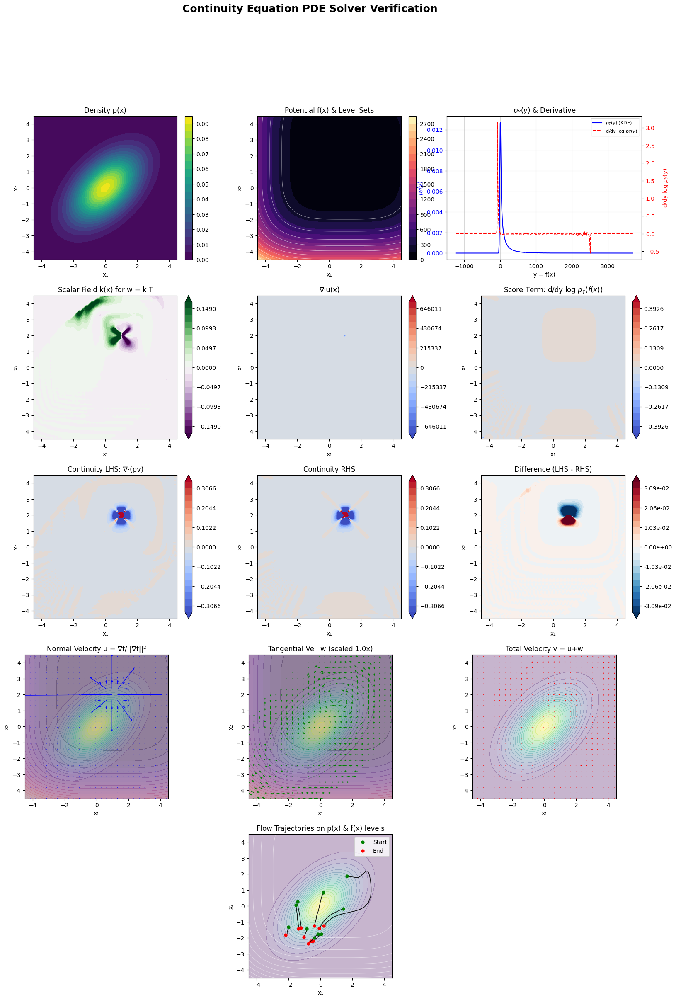

Visualization complete.


In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.integrate import solve_ivp
from scipy.stats import gaussian_kde
from scipy.interpolate import RegularGridInterpolator, interp1d
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import lsmr
import torch

# Determine device and dtype (from user code)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DTYPE = torch.float64 # Using float64 for better numerical stability

print(f"Using device: {DEVICE}, Dtype: {DTYPE}")

# --- Helper functions for PyTorch automatic differentiation ---
def pde_gradient(scalar_field_flat, coords_flat, create_graph=False, retain_graph=True):
    """Computes gradient of a scalar_field (N_points,) w.r.t. coords_flat (N_points, N_dim)."""
    if not coords_flat.requires_grad:
        coords_flat.requires_grad_(True) # Ensure coords require grad

    grad_outputs_tensor = torch.ones_like(scalar_field_flat, device=scalar_field_flat.device, dtype=scalar_field_flat.dtype)
    grads = torch.autograd.grad(
        outputs=scalar_field_flat,
        inputs=[coords_flat],
        grad_outputs=grad_outputs_tensor,
        create_graph=create_graph,
        retain_graph=retain_graph,
        allow_unused=True # Allow unused if some part of coords_flat is not used for some scalar_field_flat points (e.g. constants)
    )[0]
    if grads is None: # Handle case where gradient is None (e.g. scalar_field_flat doesn't depend on coords_flat)
        return torch.zeros_like(coords_flat)
    return grads # Shape (N_points, N_dim)

def pde_divergence(vector_field_flat, coords_flat, create_graph=False, retain_graph=True):
    """Computes divergence of a vector_field_flat (N_points, N_dim) w.r.t. coords_flat."""
    div = torch.zeros(vector_field_flat.shape[0], device=vector_field_flat.device, dtype=vector_field_flat.dtype)
    for i in range(vector_field_flat.shape[-1]): # Iterate over dimensions
        # We need the gradient of the i-th component of the vector field
        grad_Fi = pde_gradient(vector_field_flat[:, i], coords_flat, create_graph=create_graph, retain_graph=True) # retain_graph for loop
        if grad_Fi is not None:
            div += grad_Fi[:, i] # Add dF_i / dx_i
    if not retain_graph and coords_flat.grad is not None: # Clean up grads if not needed further
        coords_flat.grad.zero_()
    return div # Shape (N_points,)
from scipy.ndimage import gaussian_filter # For smoothing k(x)
from scipy.interpolate import UnivariateSpline # For pY derivative

class ContinuityPDESolver:
    def __init__(self, p_dist_or_func, f_potential_func, grid_range=(-3, 3), grid_points=100, 
                 kde_samples=10000, kde_bw_method=None, p_cutoff_fraction=1e-4,
                 kde_bw_factor=1.0, spline_s=None, 
                 score_magnitude_cap=None, k_smoothing_sigma=0.0): # New parameters
        if grid_points < 2:
            raise ValueError("grid_points must be at least 2 for finite differences.")
        self.p_dist_or_func = p_dist_or_func
        self.f_potential_func = f_potential_func
        self.grid_range_tuple = grid_range 
        self.grid_points = grid_points
        self.kde_samples = kde_samples
        self.kde_bw_method = kde_bw_method # Can be 'scott', 'silverman', or a float (base bandwidth)
        self.p_cutoff_fraction = p_cutoff_fraction
        
        # New parameters for robustness
        self.kde_bw_factor = kde_bw_factor  # Factor to scale the KDE bandwidth
        self.spline_s = spline_s            # Smoothing factor for UnivariateSpline (None or 0 for interpolation)
        self.score_magnitude_cap = score_magnitude_cap # Max absolute value for d/dy log pY(y)
        self.k_smoothing_sigma = k_smoothing_sigma # Sigma for Gaussian smoothing of k(x)

        self.dx = (self.grid_range_tuple[1] - self.grid_range_tuple[0]) / (grid_points - 1)
        self.grid_data = {} 
        self._setup_grid()

        # Print new parameter settings
        print(f"Solver initialized with advanced settings:")
        print(f"  KDE bandwidth factor: {self.kde_bw_factor}")
        print(f"  Spline smoothing for pY': s={self.spline_s if self.spline_s is not None else '0 (interpolation)'}")
        if self.score_magnitude_cap is not None:
            print(f"  Score d/dy log pY(y) capped at: +/- {self.score_magnitude_cap}")
        if self.k_smoothing_sigma > 0:
            print(f"  k(x) smoothing sigma: {self.k_smoothing_sigma}")
        if self.p_cutoff_fraction is not None and self.p_cutoff_fraction > 0:
            print(f"  Probability cutoff for k(x): p < {self.p_cutoff_fraction:.1e} * p_max")

    def _setup_grid(self):
        print("Setting up grid...")
        x1_lin = torch.linspace(self.grid_range_tuple[0], self.grid_range_tuple[1], self.grid_points, device=DEVICE, dtype=DTYPE)
        x2_lin = torch.linspace(self.grid_range_tuple[0], self.grid_range_tuple[1], self.grid_points, device=DEVICE, dtype=DTYPE)
        self.X_grid, self.Y_grid = torch.meshgrid(x1_lin, x2_lin, indexing='ij')
        
        self.coords_flat = torch.stack([self.X_grid.flatten(), self.Y_grid.flatten()], dim=1)
        self.coords_flat.requires_grad_(True)

        self.grid_data['X_grid'] = self.X_grid
        self.grid_data['Y_grid'] = self.Y_grid
        # For visualization function:
        self.grid_range = self.grid_range_tuple # For consistency with visualization function's s.grid_range
        print("Grid setup complete.")

    def _compute_p_and_f(self):
        print("Computing p(x) and f(x) on grid...")
        if hasattr(self.p_dist_or_func, 'log_prob'):
            # Ensure coords_flat is on the same device as distribution parameters
            p_dist_param_device = self.p_dist_or_func.mean.device if hasattr(self.p_dist_or_func, 'mean') else DEVICE
            log_p_x_flat = self.p_dist_or_func.log_prob(self.coords_flat.to(p_dist_param_device))
            self.p_x_flat = torch.exp(log_p_x_flat).to(DEVICE)
        else:
            self.p_x_flat = self.p_dist_or_func(self.coords_flat)
        self.grid_data['p_x'] = self.p_x_flat.reshape(self.grid_points, self.grid_points)

        self.f_val_flat = self.f_potential_func(self.coords_flat)
        self.grid_data['f_val'] = self.f_val_flat.reshape(self.grid_points, self.grid_points)
        print("p(x) and f(x) computed.")

    def _compute_gradients_and_u(self):
        print("Computing gradients (∇p, ∇f) and normal flow u...")
        # Detach previous calculations if graph is not needed, or clone if it is
        # For grad_p, p_x_flat is an input. For grad_f, f_val_flat is an input.
        self.grad_p_flat = pde_gradient(self.p_x_flat, self.coords_flat, retain_graph=True) 
        self.grad_f_flat = pde_gradient(self.f_val_flat, self.coords_flat, create_graph=True, retain_graph=True) # create_graph for u, then div_u
        
        self.norm_grad_f_sq_flat = torch.sum(self.grad_f_flat**2, dim=1)
        self.norm_grad_f_sq_flat_clamped = torch.clamp(self.norm_grad_f_sq_flat, min=1e-12)

        self.u_vec_flat = self.grad_f_flat / self.norm_grad_f_sq_flat_clamped.unsqueeze(1)
        self.grid_data['u_vec'] = self.u_vec_flat.reshape(self.grid_points, self.grid_points, 2)
        
        # Compute ∇⋅u using autograd
        # u_vec_flat was derived from grad_f_flat which had create_graph=True
        self.div_u_flat = pde_divergence(self.u_vec_flat, self.coords_flat, retain_graph=False) # retain_graph=False if div_u is final product from this graph
        self.grid_data['div_u'] = self.div_u_flat.reshape(self.grid_points, self.grid_points)
        print("∇p, ∇f, u, ∇⋅u computed.")


    def _estimate_marginal_density_py(self):
        print("Estimating marginal density pY(y) and its derivative...")
        if hasattr(self.p_dist_or_func, 'sample'):
            p_dist_param_device = self.p_dist_or_func.mean.device if hasattr(self.p_dist_or_func, 'mean') else DEVICE
            samples_x = self.p_dist_or_func.sample((self.kde_samples,)).to(p_dist_param_device)
        else:
            p_numpy = self.grid_data['p_x'].detach().cpu().numpy().flatten()
            p_numpy = np.maximum(p_numpy, 0)
            p_norm = p_numpy / np.sum(p_numpy)
            if np.all(p_norm < 1e-9):
                 print("Warning: p(x) is very small. Using uniform samples from grid for pY estimation.")
                 idx = np.random.choice(len(self.coords_flat), self.kde_samples, replace=True)
            else:
                idx = np.random.choice(len(self.coords_flat), self.kde_samples, replace=True, p=p_norm)
            samples_x = self.coords_flat[idx].detach()

        samples_y = self.f_potential_func(samples_x.to(DEVICE)).cpu().numpy() # Ensure samples_x is on DEVICE for f_potential_func

        min_y, max_y = np.min(samples_y), np.max(samples_y)
        y_range_ext = 0.5 * (max_y - min_y) if (max_y - min_y) > 1e-6 else 0.5
        self.y_grid_py_interp_np = np.linspace(min_y - y_range_ext, max_y + y_range_ext, 500)

        if (max_y - min_y) < 1e-6: # Degenerate case
            print(f"Warning: All f(x) samples map to y ≈ {min_y}. Using a narrow Gaussian for pY(y).")
            std_dev_mock = 1e-3 * (abs(min_y) if abs(min_y) > 1e-3 else 1.0) # Relative or absolute small std
            py_values_on_grid_np = (1/(std_dev_mock * np.sqrt(2*np.pi))) * np.exp(-0.5 * ((self.y_grid_py_interp_np - min_y)/std_dev_mock)**2)
            d_py_values_np = -(self.y_grid_py_interp_np - min_y)/(std_dev_mock**2) * py_values_on_grid_np
        else:
            kde = gaussian_kde(samples_y, bw_method=self.kde_bw_method)
            py_values_on_grid_np = kde(self.y_grid_py_interp_np).astype(np.float64)
            dy_kde = self.y_grid_py_interp_np[1] - self.y_grid_py_interp_np[0]
            d_py_values_np = np.gradient(py_values_on_grid_np, dy_kde)
        
        py_values_on_grid_np = np.maximum(py_values_on_grid_np, 1e-10) # For stability of log

        self.interp_py_func = interp1d(self.y_grid_py_interp_np, py_values_on_grid_np, kind='cubic', fill_value="extrapolate")
        self.interp_d_py_func = interp1d(self.y_grid_py_interp_np, d_py_values_np, kind='cubic', fill_value="extrapolate")

        f_val_np = self.f_val_flat.detach().cpu().numpy()
        py_at_f = np.maximum(self.interp_py_func(f_val_np), 1e-10)
        d_py_at_f = self.interp_d_py_func(f_val_np)
        
        self.dlogpy_dy_at_f_flat = torch.from_numpy(d_py_at_f / py_at_f).to(DEVICE, dtype=DTYPE)
        self.grid_data['dlogpy_dy_at_f'] = self.dlogpy_dy_at_f_flat.reshape(self.grid_points, self.grid_points)

        # For visualization:
        self.y_grid_py_interp = torch.from_numpy(self.y_grid_py_interp_np).to(DEVICE, dtype=DTYPE)
        self.py_values_on_grid_interp = torch.from_numpy(py_values_on_grid_np).to(DEVICE, dtype=DTYPE)
        self.interp_dlogpy_dy = lambda y_arr: self.interp_d_py_func(y_arr) / np.maximum(self.interp_py_func(y_arr), 1e-10)
        print("pY(y) and d/dy log pY(y) estimated.")

    def _compute_pde_rhs(self):
        print("Computing PDE RHS for T⋅∇(pk) = RHS...")
        # RHS = -∇p ⋅ u + p * (d/dy log pY(f(x)))
        term1_flat = -torch.sum(self.grad_p_flat * self.u_vec_flat, dim=1) # grad_p_flat might need retain_graph if p_x_flat has it
        term2_flat = self.p_x_flat * self.dlogpy_dy_at_f_flat
        self.pde_rhs_H_flat = term1_flat + term2_flat
        print("PDE RHS computed.")
    
    def _solve_for_k(self):
        # ... (code for setting up and solving AH=b for H_flat remains the same) ...
        print("Solving for H=pk via T⋅∇H = RHS...")
        T_vec_flat = torch.stack([-self.grad_f_flat.detach()[:, 1], self.grad_f_flat.detach()[:, 0]], dim=1)
        N = self.grid_points
        total_grid_points = N * N
        matrix_A = lil_matrix((total_grid_points, total_grid_points), dtype=np.float64)
        rhs_b = self.pde_rhs_H_flat.cpu().detach().numpy().astype(np.float64)

        for r in range(N): 
            for c in range(N): 
                idx = r * N + c 
                T1_rc = T_vec_flat[idx, 0].item()
                T2_rc = T_vec_flat[idx, 1].item()
                if r > 0 and r < N - 1: 
                    matrix_A[idx, (r + 1) * N + c] += T1_rc / (2 * self.dx)
                    matrix_A[idx, (r - 1) * N + c] -= T1_rc / (2 * self.dx)
                elif r == 0 and N > 1: 
                    matrix_A[idx, (r + 1) * N + c] += T1_rc / self.dx
                    matrix_A[idx, r * N + c]       -= T1_rc / self.dx
                elif r == N - 1 and N > 1: 
                    matrix_A[idx, r * N + c]       += T1_rc / self.dx
                    matrix_A[idx, (r - 1) * N + c] -= T1_rc / self.dx
                if c > 0 and c < N - 1: 
                    matrix_A[idx, r * N + (c + 1)] += T2_rc / (2 * self.dx)
                    matrix_A[idx, r * N + (c - 1)] -= T2_rc / (2 * self.dx)
                elif c == 0 and N > 1: 
                    matrix_A[idx, r * N + (c + 1)] += T2_rc / self.dx
                    matrix_A[idx, r * N + c]       -= T2_rc / self.dx
                elif c == N - 1 and N > 1: 
                    matrix_A[idx, r * N + c]       += T2_rc / self.dx
                    matrix_A[idx, r * N + (c - 1)] -= T2_rc / self.dx
                if abs(T1_rc) < 1e-9 and abs(T2_rc) < 1e-9:
                    matrix_A[idx, idx] += 1e-4 

        print("Sparse matrix A constructed. Solving AH=b for H using LSMR...")
        matrix_A_csr = matrix_A.tocsr()
        H_flat_np, istop, itn, normr, normar, norma, conda, normx = lsmr(
            matrix_A_csr, rhs_b, atol=1e-7, btol=1e-7, conlim=1e10, maxiter=2*total_grid_points, show=False
        )
        if istop not in [1,2,7]:
             print(f"Warning: LSMR may not have converged optimally. istop={istop}. Norm(residual)={normr:.1e}")

        self.H_flat = torch.from_numpy(H_flat_np).to(DEVICE, dtype=DTYPE)
        
        p_clamped_for_k = torch.clamp(self.p_x_flat.detach(), min=1e-9)
        k_val_candidate = self.H_flat / p_clamped_for_k

        if self.p_cutoff_fraction is not None and self.p_cutoff_fraction > 0:
            p_max_val = self.p_x_flat.detach().max()
            p_threshold_val = torch.tensor(0.0, device=DEVICE, dtype=DTYPE) # Default to 0 if p_max is 0
            if p_max_val > 1e-12: # Avoid issues if p_max is extremely small or zero
                p_threshold_val = p_max_val * self.p_cutoff_fraction
            
            low_p_mask = self.p_x_flat.detach() < p_threshold_val
            k_val_intermediate = torch.where(low_p_mask, torch.zeros_like(k_val_candidate), k_val_candidate)
            num_cutoff_points = torch.sum(low_p_mask).item()
            if num_cutoff_points > 0:
                 print(f"  Applied probability cutoff: k=0 for {num_cutoff_points}/{total_grid_points} points (p < {p_threshold_val:.2e}).")
        else:
            k_val_intermediate = k_val_candidate
        
        # Apply Gaussian smoothing to k(x)
        if self.k_smoothing_sigma > 0:
            print(f"  Applying Gaussian smoothing to k(x) with sigma={self.k_smoothing_sigma}...")
            k_val_grid_np = k_val_intermediate.reshape(self.grid_points, self.grid_points).cpu().numpy()
            k_val_grid_np_smooth = gaussian_filter(k_val_grid_np, sigma=self.k_smoothing_sigma)
            self.k_val_flat = torch.from_numpy(k_val_grid_np_smooth).to(DEVICE, dtype=DTYPE).flatten()
        else:
            self.k_val_flat = k_val_intermediate
        
        self.grid_data['k_val'] = self.k_val_flat.reshape(self.grid_points, self.grid_points)
        self.w_vec_flat = self.k_val_flat.unsqueeze(1) * T_vec_flat 
        self.grid_data['w_vec'] = self.w_vec_flat.reshape(self.grid_points, self.grid_points, 2)
        print("k(x) and w(x) computed (enhanced).")
    def _compute_total_velocity_and_continuity_check(self):
        print("Computing total velocity v and terms for continuity check...")
        self.v_vec_flat = self.u_vec_flat.detach() + self.w_vec_flat.detach() # Detach components
        self.grid_data['v_vec'] = self.v_vec_flat.reshape(self.grid_points, self.grid_points, 2)

        # Continuity check: LHS_viz = ∇⋅(pv), RHS_viz = ∇⋅(pu) - ∇p⋅u + p * (d/dy log pY(f(x)))
        # For these divergences, use finite differences as p, u, v are now grid data.
        def fd_divergence_grid(vector_field_grid, dx_val): # vector_field_grid (N, N, 2)
            N = vector_field_grid.shape[0]
            # dF1/dx1
            df1dx1 = torch.empty_like(vector_field_grid[:,:,0])
            df1dx1[1:-1, :] = (vector_field_grid[2:, :, 0] - vector_field_grid[:-2, :, 0]) / (2*dx_val)
            if N > 1:
                df1dx1[0, :] = (vector_field_grid[1, :, 0] - vector_field_grid[0, :, 0]) / dx_val
                df1dx1[-1, :] = (vector_field_grid[-1, :, 0] - vector_field_grid[-2, :, 0]) / dx_val
            else: # N=1 case
                df1dx1[:,:] = 0

            # dF2/dx2
            df2dx2 = torch.empty_like(vector_field_grid[:,:,1])
            df2dx2[:, 1:-1] = (vector_field_grid[:, 2:, 1] - vector_field_grid[:, :-2, 1]) / (2*dx_val)
            if N > 1:
                df2dx2[:, 0] = (vector_field_grid[:, 1, 1] - vector_field_grid[:, 0, 1]) / dx_val
                df2dx2[:, -1] = (vector_field_grid[:, -1, 1] - vector_field_grid[:, -2, 1]) / dx_val
            else:
                df2dx2[:,:] = 0
            return (df1dx1 + df2dx2)

        p_grid = self.grid_data['p_x']
        v_grid = self.grid_data['v_vec']
        u_grid = self.grid_data['u_vec']

        pv_grid = p_grid.unsqueeze(-1) * v_grid
        pu_grid = p_grid.unsqueeze(-1) * u_grid
        
        div_pv_grid = fd_divergence_grid(pv_grid.detach(), self.dx)
        div_pu_grid = fd_divergence_grid(pu_grid.detach(), self.dx)
        
        self.grid_data['lhs_continuity'] = div_pv_grid
        
        # RHS_viz_flat = div_pu_flat - ∇p⋅u + p * (d/dy log pY(f(x)))
        # All components should be flat for consistency before reshaping
        rhs_term_gradp_u = torch.sum(self.grad_p_flat.detach() * self.u_vec_flat.detach(), dim=1)
        rhs_term_p_dlogpy = self.p_x_flat.detach() * self.dlogpy_dy_at_f_flat.detach()
        
        rhs_viz_flat = div_pu_grid.flatten() - rhs_term_gradp_u + rhs_term_p_dlogpy
        self.grid_data['rhs_continuity'] = rhs_viz_flat.reshape(self.grid_points, self.grid_points)
        
        self.grid_data['diff_continuity'] = (self.grid_data['lhs_continuity'] - self.grid_data['rhs_continuity'])
        print("Total velocity and continuity check terms computed.")

    def solve(self):
        print("--- Starting PDE solution process ---")
        self._compute_p_and_f()
        self._compute_gradients_and_u()
        self._estimate_marginal_density_py()
        self._compute_pde_rhs()
        self._solve_for_k() 
        self._compute_total_velocity_and_continuity_check()
        print("--- PDE solution process complete ---")
        return self.grid_data

    def get_velocity_field_for_ode(self):
        print("Preparing velocity field interpolator for ODE solver...")
        v_vec_np_x = self.grid_data['v_vec'][:,:,0].cpu().detach().numpy()
        v_vec_np_y = self.grid_data['v_vec'][:,:,1].cpu().detach().numpy()

        x1_lin_np = self.X_grid[:,0].cpu().detach().numpy()
        x2_lin_np = self.Y_grid[0,:].cpu().detach().numpy()

        interp_vx = RegularGridInterpolator((x1_lin_np, x2_lin_np), v_vec_np_x, method='linear', bounds_error=False, fill_value=0)
        interp_vy = RegularGridInterpolator((x1_lin_np, x2_lin_np), v_vec_np_y, method='linear', bounds_error=False, fill_value=0)

        def velocity_field_func(t, xy_arr): # xy_arr is [x_coord, y_coord]
            point = np.array([[xy_arr[0], xy_arr[1]]])
            vx = interp_vx(point)
            vy = interp_vy(point)
            return [vx[0], vy[0]]
        
        print("Velocity field interpolator ready.")
        return velocity_field_func

# --- Visualization Function (user provided, slightly adapted for solver instance var names) ---
def visualize_results(solver_instance, save_path=None):
    print("Starting visualization generation...")
    s = solver_instance 
    grid_data = s.grid_data

    # Data for plots, convert tensors to numpy
    X_np = grid_data['X_grid'].cpu().numpy()
    Y_np = grid_data['Y_grid'].cpu().numpy()

    to_np = lambda t: t.detach().cpu().numpy() if isinstance(t, torch.Tensor) else t

    plot_data = {name: to_np(data) for name, data in grid_data.items() if name not in ['X_grid', 'Y_grid']}
    
    required_fields = ['p_x', 'f_val', 'u_vec', 'w_vec', 'v_vec', 'k_val', 
                       'lhs_continuity', 'rhs_continuity', 'diff_continuity', 
                       'div_u', 'dlogpy_dy_at_f']
    for field in required_fields:
        if field not in plot_data:
            if field.endswith('_vec'):
                plot_data[field] = np.zeros((*X_np.shape, 2))
            else:
                plot_data[field] = np.zeros_like(X_np)

    fig = plt.figure(figsize=(20, 27))
    gs = gridspec.GridSpec(5, 3, figure=fig, hspace=0.25, wspace=0.15) # Adjusted spacing
    
    skip = max(1, s.grid_points // 25) # Quiver plot density

    # Row 0: p(x), f(x), p_Y(y)
    ax_px = fig.add_subplot(gs[0, 0])
    cs_px = ax_px.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis')
    fig.colorbar(cs_px, ax=ax_px, fraction=0.046, pad=0.04)
    ax_px.set_title('Density p(x)'); ax_px.set_xlabel('x₁'); ax_px.set_ylabel('x₂'); ax_px.set_aspect('equal')

    ax_fx = fig.add_subplot(gs[0, 1])
    cs_fx = ax_fx.contourf(X_np, Y_np, plot_data['f_val'], levels=20, cmap='magma')
    ax_fx.contour(X_np, Y_np, plot_data['f_val'], levels=10, colors='white', linewidths=0.5, alpha=0.7)
    fig.colorbar(cs_fx, ax=ax_fx, fraction=0.046, pad=0.04)
    ax_fx.set_title('Potential f(x) & Level Sets'); ax_fx.set_xlabel('x₁'); ax_fx.set_ylabel('x₂'); ax_fx.set_aspect('equal')

    ax_py_marg = fig.add_subplot(gs[0, 2])
    y_grid_np = s.y_grid_py_interp.cpu().numpy()
    py_vals_np = s.py_values_on_grid_interp.cpu().numpy()
    
    # Calculate cumulative distribution to find 99th percentile
    cumulative_py = np.cumsum(py_vals_np)
    cumulative_py = cumulative_py / cumulative_py[-1]  # Normalize to [0,1]
    percentile_90_idx = np.argmax(cumulative_py >= 0.9)
    percentile_10_idx = np.argmax(cumulative_py >= 0.1)
    y_90th_percentile_from_py = y_grid_np[percentile_90_idx]
    y_10th_percentile_from_py = y_grid_np[percentile_10_idx]
    ax_py_marg.plot(y_grid_np, py_vals_np, 'b-', label='$p_Y(y)$ (KDE)')
    ax_py_marg.set_xlabel('y = f(x)'); ax_py_marg.set_ylabel('$p_Y(y)$', color='b')
    ax_py_marg.tick_params(axis='y', labelcolor='b')
    ax_py_marg.set_title('$p_Y(y)$ & Derivative'); ax_py_marg.grid(True, alpha=0.5)
    
    ax_py_marg_twin = ax_py_marg.twinx()
    dlogpy_dy_on_y_grid_np = s.interp_dlogpy_dy(y_grid_np) # This is d/dy log p_Y(y)
    ax_py_marg_twin.plot(y_grid_np, dlogpy_dy_on_y_grid_np, 'r--', label='d/dy log $p_Y(y)$')
    ax_py_marg_twin.set_ylabel('d/dy log $p_Y(y)$', color='r')
    ax_py_marg_twin.tick_params(axis='y', labelcolor='r')
    lines, labels = ax_py_marg.get_legend_handles_labels()
    lines2, labels2 = ax_py_marg_twin.get_legend_handles_labels()
    ax_py_marg_twin.legend(lines + lines2, labels + labels2, loc='best', fontsize=8)

    # Row 1: u, ∇⋅u, score_term(f(x))

    ax_div_u = fig.add_subplot(gs[1, 1])
    div_u_abs_max = np.max(np.abs(plot_data['div_u'])) if np.any(plot_data['div_u']) else 1.0
    div_u_abs_max = max(div_u_abs_max, 1e-9) # Avoid zero range
    cs_div_u = ax_div_u.contourf(X_np, Y_np, plot_data['div_u'], levels=np.linspace(-div_u_abs_max, div_u_abs_max, 21), cmap='coolwarm', extend='both')
    fig.colorbar(cs_div_u, ax=ax_div_u, fraction=0.046, pad=0.04)
    ax_div_u.set_title('∇⋅u(x)'); ax_div_u.set_xlabel('x₁'); ax_div_u.set_ylabel('x₂'); ax_div_u.set_aspect('equal')

    ax_dlogpy = fig.add_subplot(gs[1, 2])
    dlogpy_abs_max = np.max(np.abs(plot_data['dlogpy_dy_at_f'])) if np.any(plot_data['dlogpy_dy_at_f']) else 1.0
    dlogpy_abs_max = max(dlogpy_abs_max, 1e-9)
    cs_dlogpy = ax_dlogpy.contourf(X_np, Y_np, plot_data['dlogpy_dy_at_f'], levels=np.linspace(-dlogpy_abs_max, dlogpy_abs_max, 21), cmap='coolwarm', extend='both')
    fig.colorbar(cs_dlogpy, ax=ax_dlogpy, fraction=0.046, pad=0.04)
    ax_dlogpy.set_title('Score Term: d/dy log $p_Y(f(x))$'); ax_dlogpy.set_xlabel('x₁'); ax_dlogpy.set_ylabel('x₂'); ax_dlogpy.set_aspect('equal')

    # Row 2: k(x), w, v
    ax_u = fig.add_subplot(gs[3, 0])
    ax_u.contourf(X_np, Y_np, plot_data['f_val'], levels=20, cmap='magma', alpha=0.3)
    ax_u.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    ax_u.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], plot_data['u_vec'][::skip,::skip,0], plot_data['u_vec'][::skip,::skip,1],
                color='blue', scale_units='xy', angles='xy', width=0.0035, headwidth=3, headlength=4, scale=3) # Added scale=None
    ax_u.set_title('Normal Velocity u = ∇f/||∇f||²'); ax_u.set_xlabel('x₁'); ax_u.set_ylabel('x₂'); ax_u.set_aspect('equal')
    ax_u.set_xlim(s.grid_range); ax_u.set_ylim(s.grid_range)

    ax_k = fig.add_subplot(gs[1, 0])
    k_abs_max = np.percentile(np.abs(plot_data['k_val']), 99) if np.any(plot_data['k_val']) else 1.0 # Percentile for robustness
    k_abs_max = max(k_abs_max, 1e-9)
    cs_k = ax_k.contourf(X_np, Y_np, plot_data['k_val'], levels=np.linspace(-k_abs_max, k_abs_max, 21), cmap='PRGn', extend='both')
    fig.colorbar(cs_k, ax=ax_k, fraction=0.046, pad=0.04)
    ax_k.set_title('Scalar Field k(x) for w = k T'); ax_k.set_xlabel('x₁'); ax_k.set_ylabel('x₂'); ax_k.set_aspect('equal')

    ax_w = fig.add_subplot(gs[3, 1])
    ax_w.contourf(X_np, Y_np, plot_data['f_val'], levels=20, cmap='magma', alpha=0.3)
    w_mags = np.sqrt(plot_data['w_vec'][...,0]**2 + plot_data['w_vec'][...,1]**2)
    # Scale w for visualization relative to u if w is too small/large
    if np.any(w_mags) and np.any(plot_data['u_vec']):
         w_scale_factor = np.percentile(np.sqrt(plot_data['u_vec'][...,0]**2 + plot_data['u_vec'][...,1]**2), 95) / \
                          (np.percentile(w_mags, 95) + 1e-9)
         w_scale_factor = np.clip(w_scale_factor, 0.1, 10.0) # Cap scaling
    else:
        w_scale_factor = 1.0
        
    w_scale_factor = 1.0
    # Cap w vector lengths to 90th percentile
    w_vec_scaled = plot_data['w_vec'] * w_scale_factor
    w_mags_scaled = np.sqrt(w_vec_scaled[...,0]**2 + w_vec_scaled[...,1]**2)
    w_mag_cap = np.percentile(w_mags_scaled[w_mags_scaled > 0], 60) if np.any(w_mags_scaled > 0) else 1.0
    w_vec_capped = np.where(w_mags_scaled[...,None] > w_mag_cap, 
                           w_vec_scaled * (w_mag_cap / (w_mags_scaled[...,None] + 1e-9)), 
                           w_vec_scaled)

    w_vec_norms = np.sqrt(plot_data['w_vec'][...,0]**2 + plot_data['w_vec'][...,1]**2)**0.5
    ax_w.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    ax_w.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], 
                w_vec_capped[::skip,::skip,0]/w_vec_norms[::skip,::skip], 
                w_vec_capped[::skip,::skip,1]/w_vec_norms[::skip,::skip],
                color='green', scale_units='xy', angles='xy', width=0.0035, headwidth=3, headlength=4, scale=1)
    ax_w.set_title(f'Tangential Vel. w (scaled {w_scale_factor:.1f}x)'); ax_w.set_xlabel('x₁'); ax_w.set_ylabel('x₂'); ax_w.set_aspect('equal')
    ax_w.set_xlim(s.grid_range); ax_w.set_ylim(s.grid_range)

    ax_v = fig.add_subplot(gs[3, 2])
    ax_v.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    
    # Cap v vector lengths to 90th percentile
    v_mags = np.sqrt(plot_data['v_vec'][...,0]**2 + plot_data['v_vec'][...,1]**2)
    v_mag_cap = np.percentile(v_mags[v_mags > 0], 80) if np.any(v_mags > 0) else 1.0
    v_vec_capped = np.where(v_mags[...,None] > v_mag_cap, 
                           plot_data['v_vec'] * (v_mag_cap / (v_mags[...,None] + 1e-9)), 
                           plot_data['v_vec'])
    
    ax_v.quiver(X_np[::skip,::skip], Y_np[::skip,::skip], v_vec_capped[::skip,::skip,0], v_vec_capped[::skip,::skip,1],
                color='red', scale_units='xy', angles='xy', width=0.0035, headwidth=3, headlength=4, scale=4)
    ax_v.set_title('Total Velocity v = u+w'); ax_v.set_xlabel('x₁'); ax_v.set_ylabel('x₂'); ax_v.set_aspect('equal')
    ax_v.set_xlim(s.grid_range); ax_v.set_ylim(s.grid_range)
    
    # Row 3: LHS, RHS, Difference for Continuity
    val_max_abs = np.percentile(np.abs(np.concatenate([plot_data['lhs_continuity'].flatten(), plot_data['rhs_continuity'].flatten()])), 99)
    val_max_abs = max(val_max_abs, 1e-9)
    cont_levels = np.linspace(-val_max_abs, val_max_abs, 21)

    ax_lhs = fig.add_subplot(gs[2, 0])
    cs_lhs = ax_lhs.contourf(X_np, Y_np, plot_data['lhs_continuity'], levels=cont_levels, cmap='coolwarm', extend='both')
    fig.colorbar(cs_lhs, ax=ax_lhs, fraction=0.046, pad=0.04)
    ax_lhs.set_title('Continuity LHS: ∇⋅(pv)'); ax_lhs.set_xlabel('x₁'); ax_lhs.set_ylabel('x₂'); ax_lhs.set_aspect('equal')

    ax_rhs = fig.add_subplot(gs[2, 1])
    cs_rhs = ax_rhs.contourf(X_np, Y_np, plot_data['rhs_continuity'], levels=cont_levels, cmap='coolwarm', extend='both')
    fig.colorbar(cs_rhs, ax=ax_rhs, fraction=0.046, pad=0.04)
    ax_rhs.set_title('Continuity RHS'); ax_rhs.set_xlabel('x₁'); ax_rhs.set_ylabel('x₂'); ax_rhs.set_aspect('equal')

    ax_diff = fig.add_subplot(gs[2, 2])
    max_abs_diff = np.percentile(np.abs(plot_data['diff_continuity']), 99) if np.any(plot_data['diff_continuity']) else 1.0
    max_abs_diff = max(max_abs_diff, 1e-9)
    diff_levels = np.linspace(-max_abs_diff, max_abs_diff, 21)
    cs_diff = ax_diff.contourf(X_np, Y_np, plot_data['diff_continuity'], levels=diff_levels, cmap='RdBu_r', extend='both')
    fig.colorbar(cs_diff, ax=ax_diff, fraction=0.046, pad=0.04, format="%.2e")
    ax_diff.set_title('Difference (LHS - RHS)'); ax_diff.set_xlabel('x₁'); ax_diff.set_ylabel('x₂'); ax_diff.set_aspect('equal')

    # Row 4: Trajectories
    ax_traj = fig.add_subplot(gs[4, :])
    ax_traj.contourf(X_np, Y_np, plot_data['p_x'], levels=20, cmap='viridis', alpha=0.3)
    ax_traj.contour(X_np, Y_np, plot_data['f_val'], levels=10, colors='white', linewidths=0.7, alpha=0.5)

    start_points_np = []
    p_thresh = np.percentile(plot_data['p_x'], 85)
    high_p_indices = np.argwhere(plot_data['p_x'] > p_thresh)
    if len(high_p_indices) > 0:
        num_traj = min(10, len(high_p_indices))
        selected_indices = high_p_indices[np.random.choice(len(high_p_indices), size=num_traj, replace=False)]
        for idx_pair in selected_indices:
            start_points_np.append([X_np[idx_pair[0], idx_pair[1]], Y_np[idx_pair[0], idx_pair[1]]])
    else: 
        for r_frac in np.linspace(0.2, 0.6, 3):
            for theta in np.linspace(0, 2*np.pi, 3, endpoint=False):
                r_val = r_frac * (s.grid_range[1] - s.grid_range[0])/2.0
                start_points_np.append([r_val*np.cos(theta), r_val*np.sin(theta)])
    
    ode_velocity_func = s.get_velocity_field_for_ode()
    v_mags_flat = np.sqrt(plot_data['v_vec'][...,0]**2 + plot_data['v_vec'][...,1]**2).flatten()
    if len(high_p_indices) > 0:
        v_mags_in_high_p = v_mags_flat[plot_data['p_x'].flatten() > p_thresh]
        typical_v_mag = np.percentile(v_mags_in_high_p, 50) if len(v_mags_in_high_p) > 0 else np.percentile(v_mags_flat, 50)
    else:
        typical_v_mag = np.percentile(v_mags_flat, 50) if len(v_mags_flat) > 0 else 1.0
    
    typical_v_mag = max(typical_v_mag, 1e-6) # Avoid zero velocity
    t_end = (s.grid_range[1] - s.grid_range[0]) / typical_v_mag * 0.5 

    print(f"Plotting {len(start_points_np)} trajectories using solve_ivp, t_end approx {t_end:.2f}...")
    plotted_legend = False
    for start_pt_np in start_points_np:
        point_t_end = min([t_end, (y_90th_percentile_from_py - y_10th_percentile_from_py)/2])
        sol = solve_ivp(ode_velocity_func, [0, point_t_end], start_pt_np, dense_output=True, rtol=1e-4, atol=1e-5, method='RK45')
        t_eval = np.linspace(sol.t[0], sol.t[-1], 100)
        trajectory = sol.sol(t_eval).T
        
        ax_traj.plot(trajectory[:, 0], trajectory[:, 1], 'k-', linewidth=1.2, alpha=0.9)
        if not plotted_legend:
            ax_traj.plot(trajectory[0, 0], trajectory[0, 1], 'go', markersize=5, label='Start')
            ax_traj.plot(trajectory[-1, 0], trajectory[-1, 1], 'ro', markersize=5, label='End')
            plotted_legend = True
        else:
            ax_traj.plot(trajectory[0, 0], trajectory[0, 1], 'go', markersize=5)
            ax_traj.plot(trajectory[-1, 0], trajectory[-1, 1], 'ro', markersize=5)


    ax_traj.set_title('Flow Trajectories on p(x) & f(x) levels'); ax_traj.set_xlabel('x₁'); ax_traj.set_ylabel('x₂'); ax_traj.set_aspect('equal')
    ax_traj.set_xlim(s.grid_range); ax_traj.set_ylim(s.grid_range)
    if start_points_np: ax_traj.legend(fontsize=10)

    plt.tight_layout(rect=[0, 0, 1, 0.97]) # Space for suptitle
    fig.suptitle('Continuity Equation PDE Solver Verification', fontsize=18, fontweight='bold')

    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Visualization saved to {save_path}")
    plt.show()
    print("Visualization complete.")


if __name__ == "__main__":
    # --- Define p(x) ---
    mix_probs = torch.tensor([0.8, 0.1,0.1], device=DEVICE, dtype=DTYPE)
    means = torch.tensor([[-1.2, -1.2], [1.2, 0.], [0., 1.2]], device=DEVICE, dtype=DTYPE)
    std_devs = torch.tensor([0.7, 0.3, 0.3], device=DEVICE, dtype=DTYPE)*2.
    
    
    cov_mats_list = []
    for std in std_devs:
        cov_mats_list.append(torch.eye(2, device=DEVICE, dtype=DTYPE) * (std**2) + torch.tensor([[0.0, 0.2], [0.2, 0.0]], device=DEVICE, dtype=DTYPE))
    cov_mats = torch.stack(cov_mats_list)
    
    p_dist_param_device = DEVICE 
    mix = torch.distributions.Categorical(mix_probs.to(p_dist_param_device))
    comp = torch.distributions.MultivariateNormal(means.to(p_dist_param_device), cov_mats.to(p_dist_param_device))
    p_distribution = torch.distributions.MixtureSameFamily(mix, comp)
    

    # --- Define f(x) ---
    # Example 1: Simple linear function f(x) = x1
    # def f_potential_func(coords_tensor): # coords_tensor is (N, 2)
    #     return coords_tensor[:, 0] 

    # Example 2: Quadratic bowl f(x) = (x1^2 + x2^2)/2
    def f_potential_func(coords_tensor): # coords_tensor is (N, 2)
        return torch.sum(coords_tensor**2, dim=-1) / 3.0 +torch.sum(coords_tensor, dim=-1) 

    mix_probs = torch.tensor([0.7, 0.15,0.15], device=DEVICE, dtype=DTYPE)
    means = torch.tensor([[-1.5, -1.5], [2, -.2], [-.2,2]], device=DEVICE, dtype=DTYPE)
    std_devs = torch.tensor([0.7, 0.3, 0.3], device=DEVICE, dtype=DTYPE)*1.9


    cov_mats_list = []
    for std in std_devs:
        cov_mats_list.append(torch.eye(2, device=DEVICE, dtype=DTYPE) * (std**2) + torch.tensor([[0.0, (std*0.4)*2/3], [(std*0.4)*2/3, 0.0]], device=DEVICE, dtype=DTYPE))
    cov_mats = torch.stack(cov_mats_list)
    p_dist_param_device = DEVICE 
    mix = torch.distributions.Categorical(mix_probs)
    comp = torch.distributions.MultivariateNormal(means, cov_mats)
    p_distribution = torch.distributions.MixtureSameFamily(mix, comp)
    
    # Function version of p_distribution density
    def p_density(coords_tensor):
        # pepe
        # return torch.exp(p_distribution.log_prob(coords_tensor+(coords_tensor@torch.tensor([[1.],[1.]], device=DEVICE, dtype=DTYPE)+5.5)**-2*torch.tensor([[.3,-.6]], device=DEVICE, dtype=DTYPE)))#coords_tensor/2*torch.abs(1+coords_tensor@torch.tensor([[-.6],[.6]], device=DEVICE, dtype=DTYPE))))

        return torch.exp(p_distribution.log_prob(coords_tensor+(coords_tensor@torch.tensor([[1.],[1.]], device=DEVICE, dtype=DTYPE))*torch.tensor([[-.3,.3]], device=DEVICE, dtype=DTYPE)))#coords_tensor/2*torch.abs(1+coords_tensor@torch.tensor([[-.6],[.6]], device=DEVICE, dtype=DTYPE))))

    normal = torch.distributions.MultivariateNormal(torch.tensor([[0, 0]], device=DEVICE, dtype=DTYPE), torch.tensor([[2.0, 1.0], [1.0, 2.0]], device=DEVICE, dtype=DTYPE))
    def p_density(coords_tensor):
        
        return torch.exp(normal.log_prob(coords_tensor))#coords_tensor/2*torch.abs(1+coords_tensor@torch.tensor([[-.6],[.6]], device=DEVICE, dtype=DTYPE))))


    def f_potential_func(coords_tensor): # coords_tensor is (N, 2)
        return torch.sum(coords_tensor**2, dim=-1) / 300.0 +torch.sum(coords_tensor, dim=-1)*2
    def f_potential_func(coords_tensor): # coords_tensor is (N, 2)
        return torch.sum((coords_tensor-torch.tensor([[1, 2]], device=DEVICE, dtype=DTYPE))**4, dim=-1) 
    # --- Initialize and Run Solver ---
    solver = ContinuityPDESolver(
        p_dist_or_func=p_density,
        f_potential_func=f_potential_func,
        grid_range=(-4.5, 4.5),
        grid_points=80,      # Moderately increased grid points
        kde_samples=500000,   # Reduced from millions, check if robust methods help
        kde_bw_method='scott',  # Use 'scott' or 'silverman' or a float value
        p_cutoff_fraction=1e-3,
        
        # New parameters for tuning:
        kde_bw_factor=0.7,          # e.g., 1.0 (no change), 1.5 (wider), 0.7 (narrower)
        spline_s=1e-5,              # Smoothing for spline derivative of pY. Try None or 0 for pure interpolation, or small positive.
                                    # Heuristic could be: len(y_grid) * np.var(py_values) * (small_factor like 1e-7)
        score_magnitude_cap=20.0,   # e.g., cap |d/dy log pY| at 10, 20, or None. Adjust based on typical score values.
        k_smoothing_sigma=0.      # e.g., 0.5 to 1.0 grid cell for smoothing k(x). 0 for no smoothing.
    )
    
    solver.solve()

    visualize_results(solver, save_path="continuity_pde_solver_results.png")

In [9]:
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import numpy as np
import ot # Python Optimal Transport library
import functools # For passing arguments to collate_fn

import sys
sys.path.append('/Users/adamsobieszek/PycharmProjects/manipy/levelset_fm')
from models.flow_model import VectorFieldTransformer, VectorFieldModel2
from lamb_optimizer import Lamb


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "mps")
DTYPE = torch.float32
# --- 5. Helper for Dynamic Plotting (Rescaled Field V(x)) ---
def _plot_current_rescaled_field_and_contours(
    model_V_hat, p_distribution, f_func, grad_f_func, 
    ax, grid_extents, grid_points, device, dtype, stability_eps=1e-4
):
    # model_V_hat.eval() 

    # 1. Plot p(x) contours (backdrop)
    contour_grid_points = grid_points * 2 
    x_lin_dist = torch.linspace(grid_extents[0], grid_extents[1], contour_grid_points, device=device, dtype=dtype)
    y_lin_dist = torch.linspace(grid_extents[0], grid_extents[1], contour_grid_points, device=device, dtype=dtype)
    X_grid_dist, Y_grid_dist = torch.meshgrid(x_lin_dist, y_lin_dist, indexing='ij')
    grid_coords_dist = torch.stack([X_grid_dist.flatten(), Y_grid_dist.flatten()], dim=1)

    with torch.no_grad():
        log_probs = p_distribution.log_prob(grid_coords_dist)
        probs = torch.exp(log_probs).cpu().numpy().reshape(contour_grid_points, contour_grid_points)
    
    ax.contourf(X_grid_dist.cpu().numpy(), Y_grid_dist.cpu().numpy(), probs, levels=10, cmap='viridis', alpha=0.4)
    ax.contour(X_grid_dist.cpu().numpy(), Y_grid_dist.cpu().numpy(), probs, levels=10, colors='white', linewidths=0.5, alpha=0.3)

    # 2. Plot rescaled vector field V(x)
    x_lin_vf = torch.linspace(grid_extents[0], grid_extents[1], grid_points, device=device, dtype=dtype)
    y_lin_vf = torch.linspace(grid_extents[0], grid_extents[1], grid_points, device=device, dtype=dtype)
    X_grid_vf, Y_grid_vf = torch.meshgrid(x_lin_vf, y_lin_vf, indexing='ij')
    grid_coords_vf = torch.stack([X_grid_vf.flatten(), Y_grid_vf.flatten()], dim=1)
    
    with torch.no_grad():
        V_hat_x = model_V_hat(grid_coords_vf) # Normalized direction from model
        grad_f_x = grad_f_func(grid_coords_vf, f_func) # Gradient of f(x)
        
        # Denominator for rescaling: V_hat(x) . grad f(x)
        dot_product = torch.sum(V_hat_x * grad_f_x, dim=1, keepdim=True)
        
        # Rescaled field V(x) = V_hat(x) / (V_hat(x) . grad f(x) + eps)
        # Add epsilon to prevent division by zero or very small numbers.
        # Sign of dot_product matters for stability; if negative, field points against f increase
        V_x_rescaled = V_hat_x #/ (dot_product + stability_eps * torch.sign(dot_product).clamp(min=1.0)) # Ensure eps adds constructively if dot_product is small positive
        
        # Optional: Clamp magnitude of V_x_rescaled for visualization if it explodes
        # mag_V_x = torch.linalg.norm(V_x_rescaled, dim=1, keepdim=True)
        # V_x_rescaled = V_x_rescaled / mag_V_x.clamp(min=1e-4) * mag_V_x.clamp(max=some_reasonable_max_speed_for_plot)


    vf_np_x = V_x_rescaled[:, 0].cpu().numpy().reshape(grid_points, grid_points)
    vf_np_y = V_x_rescaled[:, 1].cpu().numpy().reshape(grid_points, grid_points)
    
    ax.quiver(X_grid_vf.cpu().numpy(), Y_grid_vf.cpu().numpy(), vf_np_x, vf_np_y, 
              color='deepskyblue', scale=None, scale_units='xy', angles='xy', 
              headwidth=4, headlength=6, width=0.004, zorder=5, alpha=0.9)
    
    # model_V_hat.train()


# --- 7. Final Visualization (Detailed) ---
def visualize_final_lst_flow(
    model_V_hat, p_distribution, f_func, grad_f_func, 
    grid_extents, grid_points=30, num_trajectories=15, 
    S_final=2.0, # Total change in f for trajectories
    stability_eps=1e-4
):
    print("Starting detailed final LST flow visualization...")
    model_V_hat.eval()

    model_V_hat.add_rating_gradient = False
    fig_field, ax_field = plt.subplots(1, 1, figsize=(8, 8))
    ax_field.set_xlabel("$x_1$"); ax_field.set_ylabel("$x_2$")
    ax_field.set_title("Final Rescaled Learned Field $w(x)$ with $P_X$ Contours")
    ax_field.set_aspect('equal', adjustable='box')
    ax_field.set_xlim(grid_extents); ax_field.set_ylim(grid_extents)
    ax_field.grid(True, linestyle='--', alpha=0.5)
    _plot_current_rescaled_field_and_contours(
        model_V_hat, p_distribution, f_func, grad_f_func, ax_field,
        grid_extents, grid_points, DEVICE, DTYPE, stability_eps
    )
    plt.show()
    model_V_hat.add_rating_gradient = True

    # --- Plot 1: Rescaled Learned Field V(x) ---
    fig_field, ax_field = plt.subplots(1, 1, figsize=(8, 8))
    ax_field.set_xlabel("$x_1$"); ax_field.set_ylabel("$x_2$")
    ax_field.set_title("Final Rescaled Learned Field $V(x)$ with $P_X$ Contours")
    ax_field.set_aspect('equal', adjustable='box')
    ax_field.set_xlim(grid_extents); ax_field.set_ylim(grid_extents)
    ax_field.grid(True, linestyle='--', alpha=0.5)
    _plot_current_rescaled_field_and_contours(
        model_V_hat, p_distribution, f_func, grad_f_func, ax_field,
        grid_extents, grid_points, DEVICE, DTYPE, stability_eps
    )
    plt.show()

    # --- Plot 2: Trajectories using V(x) ---
    def V_rescaled_field_func(x_coords_for_V): # For ODE solver
        with torch.no_grad():
            V_hat_x = model_V_hat(x_coords_for_V)
            # grad_f_x = grad_f_func(x_coords_for_V, f_func)
            return V_hat_x #/ denominator

    def ode_func_for_lst(s_scalar, current_x_batch): # s is the 'time' parameter for f increase
        return V_rescaled_field_func(current_x_batch)

    # Sample initial points from areas of notable P_X density
    num_initial_points_sample = 500
    initial_points_candidate = p_distribution.sample((num_initial_points_sample,)).to(DEVICE, dtype=DTYPE)
    # Select a subset for trajectories, e.g., by percentile of f or random
    selected_indices = torch.randperm(num_initial_points_sample)[:num_trajectories]
    x_initial_trajectories = initial_points_candidate[selected_indices]
    f_initial_values = f_func(x_initial_trajectories)
    
    s_span = torch.linspace(0, S_final, 100, device=DEVICE, dtype=DTYPE)
    print(f"Generating {num_trajectories} final trajectories (target $\Delta f = {S_final:.2f}$)...")
    
    with torch.no_grad():
        trajectories = odeint(ode_func_for_lst, x_initial_trajectories, s_span, method='rk4', options=dict(step_size=S_final/100.0))
    
    trajectories_np = trajectories.permute(1, 0, 2).cpu().numpy() # (num_trajectories, num_timesteps, dim)
    f_final_values_actual = f_func(trajectories[:,:,-1].squeeze().to(DEVICE,dtype=DTYPE)) # f at end of trajectory

    plt.figure(figsize=(9, 8.5))
    num_bg_samples = 1000
    bg_samples = p_distribution.sample((num_bg_samples,)).cpu().numpy()
    plt.scatter(bg_samples[:, 0], bg_samples[:, 1], alpha=0.07, color='gray', label=f'$P_X$ Samples', s=10)

    for i in range(num_trajectories):
        plt.plot(trajectories_np[i, :, 0], trajectories_np[i, :, 1], '-', alpha=0.8, lw=1.5)
        plt.scatter(trajectories_np[i, 0, 0], trajectories_np[i, 0, 1], 
                    color='red', marker='o', s=35, 
                    label='Start ($x_0$)' if i == 0 else None, zorder=5)
        plt.scatter(trajectories_np[i, -1, 0], trajectories_np[i, -1, 1], 
                    color='lime', marker='X', s=50, 
                    label='End ($x_S$)' if i == 0 else None, zorder=5)
        # if i < 5: # Annotate f values for a few trajectories
        #      plt.text(trajectories_np[i,0,0]+0.1, trajectories_np[i,0,1]+0.1, f"f={f_initial_values[i]:.1f}", fontsize=7, color='red')
        #      plt.text(trajectories_np[i,-1,0]+0.1, trajectories_np[i,-1,1]+0.1, f"f={f_final_values_actual[i]:.1f}", fontsize=7, color='green')


    plt.title(f"Final LST Trajectories (Target $\Delta f = {S_final:.2f}$) on $P_X$ Samples")
    plt.xlabel("$x_1$"); plt.ylabel("$x_2$")
    plt.legend(loc='best'); plt.xlim(grid_extents); plt.ylim(grid_extents)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.grid(True, linestyle='--', alpha=0.5)

    # 1. Plot p(x) contours (backdrop)
    contour_grid_points = grid_points * 2 
    x_lin_dist = torch.linspace(grid_extents[0], grid_extents[1], contour_grid_points, device=DEVICE, dtype=DTYPE)
    y_lin_dist = torch.linspace(grid_extents[0], grid_extents[1], contour_grid_points, device=DEVICE, dtype=DTYPE)
    X_grid_dist, Y_grid_dist = torch.meshgrid(x_lin_dist, y_lin_dist, indexing='ij')
    grid_coords_dist = torch.stack([X_grid_dist.flatten(), Y_grid_dist.flatten()], dim=1)

    with torch.no_grad():
        log_probs = p_distribution.log_prob(grid_coords_dist)
        probs = torch.exp(log_probs).cpu().numpy().reshape(contour_grid_points, contour_grid_points)
    
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.contourf(X_grid_dist.cpu().numpy(), Y_grid_dist.cpu().numpy(), probs, levels=10, cmap='viridis', alpha=0.4)
    ax.contour(X_grid_dist.cpu().numpy(), Y_grid_dist.cpu().numpy(), probs, levels=10, colors='white', linewidths=0.5, alpha=0.3)

    # 2. Plot rescaled vector field V(x)
    x_lin_vf = torch.linspace(grid_extents[0], grid_extents[1], grid_points, device=DEVICE, dtype=DTYPE)
    y_lin_vf = torch.linspace(grid_extents[0], grid_extents[1], grid_points, device=DEVICE, dtype=DTYPE)
    X_grid_vf, Y_grid_vf = torch.meshgrid(x_lin_vf, y_lin_vf, indexing='ij')
    grid_coords_vf = torch.stack([X_grid_vf.flatten(), Y_grid_vf.flatten()], dim=1)
    
    with torch.no_grad():
        V_hat_x = model_V_hat(grid_coords_vf) # Normalized direction from model
        grad_f_x = grad_f_func(grid_coords_vf, f_func) # Gradient of f(x)
        
        # Denominator for rescaling: V_hat(x) . grad f(x)
        dot_product = torch.sum(V_hat_x * grad_f_x, dim=1, keepdim=True)
        
        # Rescaled field V(x) = V_hat(x) / (V_hat(x) . grad f(x) + eps)
        # Add epsilon to prevent division by zero or very small numbers.
        # Sign of dot_product matters for stability; if negative, field points against f increase
        V_x_rescaled = V_hat_x #/ (dot_product + stability_eps * torch.sign(dot_product).clamp(min=1.0)) # Ensure eps adds constructively if dot_product is small positive
        
        # Optional: Clamp magnitude of V_x_rescaled for visualization if it explodes
        # mag_V_x = torch.linalg.norm(V_x_rescaled, dim=1, keepdim=True)
        # V_x_rescaled = V_x_rescaled / mag_V_x.clamp(min=1e-4) * mag_V_x.clamp(max=some_reasonable_max_speed_for_plot)


    vf_np_x = V_x_rescaled[:, 0].cpu().numpy().reshape(grid_points, grid_points)
    vf_np_y = V_x_rescaled[:, 1].cpu().numpy().reshape(grid_points, grid_points)
    
    ax.quiver(X_grid_vf.cpu().numpy(), Y_grid_vf.cpu().numpy(), vf_np_x, vf_np_y, 
              color='deepskyblue', scale=1, scale_units='xy', angles='xy', 
              headwidth=4, headlength=6, width=0.004, zorder=5, alpha=0.9)
    
    plt.show()
    model_V_hat.add_rating_gradient = False
    print("Detailed final LST flow visualization finished.")



class LevelSetTransportDatasetBatched(Dataset):
    def __init__(self, 
                 distribution,    # PyTorch distribution to sample P_X from
                 f_func,          # Function f(x) -> scalar
                 num_target_pairs,# Desired number of (x0, x1) pairs in the dataset
                 pool_size=3000,  # Number of points to sample for the initial data pool
                 x1_batch_size=256*4,# How many x1 candidates to process in one batch
                 min_f_diff=1e-2, # Minimum f(x1) - f(x0) to consider a pair
                 min_norm_diff=1e-5 # Minimum ||x1 - x0|| to ensure distinct points
                ):
        
        self.distribution = distribution
        self.f_func = f_func
        self.num_target_pairs = num_target_pairs
        self.pool_size = pool_size
        self.x1_batch_size = x1_batch_size
        self.min_f_diff = min_f_diff
        self.min_norm_diff = min_norm_diff

        self.pairs_x0_x1 = []
        self.target_directions = []

        print(f"Initializing LevelSetTransportDatasetBatched on {DEVICE} with {DTYPE}.")
        
        with torch.no_grad(): # Ensure no gradients are computed during dataset setup
            # 1. Sample data_pool and f_values_pool
            print(f"Generating data pool of size {self.pool_size}...")
            data_pool = self.distribution.sample((self.pool_size,)).to(device=DEVICE, dtype=DTYPE)
            f_values_pool = self.f_func(data_pool).to(device=DEVICE, dtype=DTYPE) # Ensure f_values are also on device/dtype

            all_potential_optimal_pairs_with_cost = [] # Stores (cost, x0_idx_in_pool, x1_idx_in_pool)

            # 3. Loop through data_pool in batches for x1 candidates
            # Each point in data_pool will be considered as a potential x1
            for i in tqdm(range(0, self.pool_size, self.x1_batch_size), desc="Batched optimal pair finding"):
                
                # Current batch of x1 points and their original indices in data_pool
                x1_batch_original_indices = torch.arange(i, min(i + self.x1_batch_size, self.pool_size), 
                                                         device=DEVICE, dtype=torch.long)
                if len(x1_batch_original_indices) == 0: 
                    continue

                x1_b = data_pool[x1_batch_original_indices]         # Shape (M, d)
                f_v_x1_b = f_values_pool[x1_batch_original_indices] # Shape (M,)
                current_M = x1_b.shape[0]

                # Expand dims for broadcasting against the entire pool (Np points for x0)
                # x1_b_expanded: (M, 1, d), f_v_x1_b_expanded: (M, 1)
                # pool_x0_expanded: (1, Np, d), pool_f_x0_expanded: (1, Np)
                x1_b_expanded = x1_b.unsqueeze(1)
                f_v_x1_b_expanded = f_v_x1_b.unsqueeze(1)
                
                pool_x0_expanded = data_pool.unsqueeze(0) 
                pool_f_x0_expanded = f_values_pool.unsqueeze(0)

                # Pairwise differences for coordinates and norms
                # diff_x_abs_all[k,j,:] = x1_b[k] - data_pool[j]
                diff_x_abs_all = x1_b_expanded - pool_x0_expanded   # Shape (M, Np, d)
                norm_diff_x_all = torch.linalg.norm(diff_x_abs_all, dim=2) # Shape (M, Np)
                
                # Pairwise f-value differences: f(x1) - f(x0)
                # f_diff_all[k,j] = f_v_x1_b[k] - f_values_pool[j]
                f_diff_all = f_v_x1_b_expanded - pool_f_x0_expanded     # Shape (M, Np)
                
                # Validity mask (shape M x Np)
                # 1. f(x0) < f(x1)  (implies f_diff_all > 0 for these elements)
                #    pool_f_x0_expanded < f_v_x1_b_expanded
                # 2. f(x1) - f(x0) > min_f_diff (ensures f_diff_all is sufficiently positive)
                #    f_diff_all > self.min_f_diff
                # 3. ||x1 - x0|| > min_norm_diff (ensures x0 and x1 are distinct)
                #    norm_diff_x_all > self.min_norm_diff
                
                # Note: An explicit check to prevent x0_idx == x1_idx can be added here
                # if needed, but norm_diff_x_all > self.min_norm_diff should handle it.
                # Create an identity matrix of size Np, expand it to M x Np x Np
                # then select diagonal for M x Np. Or simpler:
                # Create a mask for x0_idx != x1_idx for each x1 in the batch.
                # For x1_b[k] (original index: x1_batch_original_indices[k]),
                # its x0 partner cannot be data_pool[x1_batch_original_indices[k]].
                # This is a bit complex to vectorize directly without large index tensors.
                # For now, relying on min_norm_diff. If min_norm_diff is very small,
                # and pool points can be identical, this might need refinement.
                
                mask = (pool_f_x0_expanded < f_v_x1_b_expanded) #& \
                    #    (f_diff_all > self.min_f_diff) & \
                    #    (norm_diff_x_all > self.min_norm_diff)
                
                # Calculate C_LST costs = norm_diff_x / f_diff
                # Initialize costs to infinity, then fill valid ones
                costs_matrix = torch.full_like(norm_diff_x_all, float('inf'), device=DEVICE, dtype=DTYPE)
                
                # Only calculate costs for pairs that satisfy the mask conditions
                valid_f_diffs = f_diff_all[mask] # These are f(x1) - f(x0_valid) > 0
                costs_matrix[mask] = norm_diff_x_all[mask] / valid_f_diffs

                # Find the best x0 (from data_pool) for each x1 in the current batch
                # min_costs_for_x1_batch: cost for the best x0 for each x1
                # best_x0_indices_in_pool: index (into data_pool) of that best x0
                min_costs_for_x1_batch, best_x0_indices_in_pool = torch.min(costs_matrix, dim=1) # Shapes (M,)

                # Collect valid optimal pairs found in this batch
                for k_batch_idx in range(current_M): # Iterate over the x1's in the current batch
                    if not torch.isinf(min_costs_for_x1_batch[k_batch_idx]):
                        # Original index of this x1 in the full data_pool
                        x1_original_idx = x1_batch_original_indices[k_batch_idx].item() 
                        # Original index (in data_pool) of its best x0 partner
                        x0_optimal_idx = best_x0_indices_in_pool[k_batch_idx].item() 
                        
                        # Ensure x0 and x1 are not the same point from the pool by index.
                        # This is a stronger check than just relying on min_norm_diff if points could be non-unique.
                        if x1_original_idx == x0_optimal_idx:
                            continue 
                        
                        all_potential_optimal_pairs_with_cost.append(
                            (min_costs_for_x1_batch[k_batch_idx].item(), # Cost
                             x0_optimal_idx,                             # Index of x0 in data_pool
                             x1_original_idx)                            # Index of x1 in data_pool
                        )
            
            # Sort all found optimal pairs by their C_LST cost
            all_potential_optimal_pairs_with_cost.sort(key=lambda x: x[0])
            
            # Select the top 'num_target_pairs'
            selected_optimal_pairs = all_potential_optimal_pairs_with_cost[:self.num_target_pairs]

            if not selected_optimal_pairs and self.num_target_pairs > 0:
                # This check is important as an empty dataset will cause issues.
                print("CRITICAL WARNING: Could not find any valid (x0,x1) pairs meeting criteria after processing all batches.")
                print(f"  Pool size: {self.pool_size}, Target pairs: {self.num_target_pairs}")
                print(f"  min_f_diff: {self.min_f_diff}, min_norm_diff: {self.min_norm_diff}")
                print( "  Consider increasing pool_size, decreasing min_f_diff/min_norm_diff, or checking f_function's range over the distribution.")
                # Depending on desired behavior, could raise ValueError or proceed with empty dataset.
                # For now, proceed, and __len__ will be 0.

            # Populate the final dataset lists
            for cost, x0_idx, x1_idx in tqdm(selected_optimal_pairs, desc="Populating final dataset pairs"):
                x0 = data_pool[x0_idx]
                x1 = data_pool[x1_idx]
                self.pairs_x0_x1.append((x0, x1))
                
                diff_vec = x1 - x0
                norm_diff_vec = torch.linalg.norm(diff_vec) 
                
                # This norm should be > min_norm_diff by construction, and x0_idx != x1_idx
                if norm_diff_vec < 1e-7: # Highly defensive check
                    print(f"Warning: Almost identical x0, x1 pair with norm {norm_diff_vec.item()} made it into final selection (x0_idx={x0_idx}, x1_idx={x1_idx}). This is unexpected. Using random target.")
                    target_direction = torch.randn_like(x0, device=DEVICE, dtype=DTYPE)
                    target_direction = target_direction / (torch.linalg.norm(target_direction) + 1e-8) # Add epsilon for norm
                else:
                    target_direction = diff_vec / norm_diff_vec
                self.target_directions.append(target_direction)

        self.num_samples = len(self.pairs_x0_x1)
        if self.num_samples == 0 and self.num_target_pairs > 0:
            print(f"ERROR: Dataset is empty after pair generation, but {self.num_target_pairs} target pairs were requested.")
        elif self.num_samples < self.num_target_pairs:
             print(f"Warning: Generated {self.num_samples} pairs, which is less than the target {self.num_target_pairs}.")
        print(f"Dataset initialized with {self.num_samples} pairs.")


    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        # Return cloned tensors to prevent accidental modification if originals are stored/referenced elsewhere.
        # Here, pairs_x0_x1 and target_directions store tensors directly from data_pool or computed.
        x0, x1 = self.pairs_x0_x1[idx]
        u_hat_target = self.target_directions[idx]
        return x0.clone(), x1.clone(), u_hat_target.clone()
    
import torch
from torch.utils.data import Dataset
import numpy as np # For histogram and choice
# Ensure global DEVICE and DTYPE are defined in your main script

class PoolDataset(Dataset):
    """
    A dataset that holds a pre-sampled pool of points.
    During initialization, it samples points such that the distribution of their
    f(x) values is approximately uniform.
    Used with a custom collate_fn for dynamic minibatch OT pairing.
    """
    def __init__(self,
                 distribution,    # PyTorch distribution to sample P_X from
                 f_func,          # Function f(x) -> scalar
                 pool_size=10000, # Desired final size of the pool
                 oversample_factor=10, # How many times more samples to draw initially
                 num_f_bins=100,    # Number of bins for f-value histogram re-weighting
                 device=None,
                 dtype=None):

        self.distribution = distribution
        self.f_func = f_func
        self.pool_size = pool_size
        self.oversample_factor = oversample_factor
        self.num_f_bins = num_f_bins
        self.device = device if device is not None else torch.device("cpu")
        self.dtype = dtype if dtype is not None else torch.float32

        print(f"Initializing PoolDataset on {self.device} with {self.dtype}.")
        print(f"Target pool size: {self.pool_size}. Oversampling factor: {self.oversample_factor}.")

        with torch.no_grad():
            # 1. Oversample initially
            num_initial_samples = self.pool_size * self.oversample_factor
            print(f"Generating initial {num_initial_samples} samples from the distribution...")
            initial_points = self.distribution.sample((num_initial_samples,)).to(self.device, self.dtype)
            initial_f_values = self.f_func(initial_points)
            print("Initial sampling and f(x) evaluation complete.")

            if torch.isnan(initial_f_values).any() or torch.isinf(initial_f_values).any():
                print("Warning: NaN or Inf found in initial_f_values. Filtering them out.")
                valid_mask = ~(torch.isnan(initial_f_values) | torch.isinf(initial_f_values))
                initial_points = initial_points[valid_mask]
                initial_f_values = initial_f_values[valid_mask]
                if initial_points.shape[0] == 0:
                    raise ValueError("All initial samples resulted in NaN/Inf f-values. Check f_func or distribution.")

            if initial_points.shape[0] < self.pool_size:
                 print(f"Warning: After filtering NaN/Inf, only {initial_points.shape[0]} samples remain, "
                       f"which is less than the target pool_size {self.pool_size}. "
                       "The final pool will be smaller.")
                 self.pool_size = initial_points.shape[0]


            if self.pool_size == 0: # If target pool size becomes 0 after filtering
                self.pool_points = torch.empty((0, initial_points.shape[-1] if initial_points.nelement() > 0 else 2), device=self.device, dtype=self.dtype)
                self.pool_f_values = torch.empty((0,), device=self.device, dtype=self.dtype)
                print("Pool dataset is empty after NaN/Inf filtering and pool size adjustment.")
                return


            # 2. Stratified resampling to make f(x) distribution more uniform
            print(f"Performing stratified resampling for f(x) values using {self.num_f_bins} bins...")

            # Move f_values to CPU for histogramming with NumPy if it's large
            f_values_np = initial_f_values.cpu().numpy()
            # Determine bins based on the range of f_values_np using 1st and 99th percentiles
            f_min, f_max = np.percentile(f_values_np, 1), np.percentile(f_values_np, 99)
            initial_points = initial_points[(f_values_np > f_min) & (f_values_np < f_max)]
            initial_f_values = initial_f_values[(f_values_np > f_min) & (f_values_np < f_max)]
            f_values_np = f_values_np[(f_values_np > f_min) & (f_values_np < f_max)]

            hist, bin_edges = np.histogram(f_values_np, bins=self.num_f_bins)
            
            # Assign each f_value to a bin
            # np.digitize returns bin index (1-based), so subtract 1 for 0-based
            bin_indices = np.digitize(f_values_np, bin_edges[:-1]) - 1
            # Ensure indices are within [0, num_f_bins-1]
            bin_indices = np.clip(bin_indices, 0, self.num_f_bins - 1)

            # Calculate weights: inverse of bin counts (add 1 to avoid division by zero for empty bins, though unlikely here)
            # Add a small epsilon to counts for bins that might be empty after all due to edge cases or if some bins become 0 after clip
            bin_counts_epsilon = hist.astype(np.float32) + 1e-6
            sample_weights_for_f_val = 1.0 / bin_counts_epsilon[bin_indices]

            # Normalize weights to get probabilities
            probabilities = sample_weights_for_f_val / np.sum(sample_weights_for_f_val)
            
            # Resample `pool_size` indices based on these probabilities
            # `replace=True` is important if pool_size > number of unique low-density samples
            # and allows oversampling from underrepresented regions.
            if np.sum(probabilities) == 0 or np.any(np.isnan(probabilities)) or np.any(np.isinf(probabilities)):
                print("Warning: Invalid probabilities for resampling. Falling back to uniform random sampling.")
                indices = np.random.choice(len(initial_points), self.pool_size, replace=True)
            else:
                indices = np.random.choice(len(initial_points), self.pool_size, replace=True, p=probabilities)

            # plot the histogram of the resampled points
            # plt.hist(initial_f_values[indices].cpu().numpy(), bins=self.num_f_bins, color='green', alpha=0.7)
            # plt.show()

            # 3. Create the final pool with resampled points
            self.pool_points = initial_points[indices]
            self.pool_f_values = initial_f_values[indices] # f-values corresponding to the resampled points

        print(f"Final data pool generated with {len(self.pool_points)} samples after resampling for uniform f(x) distribution.")

        # Optional: Visualize the distribution of f-values before and after resampling (for debugging)
        # if device.type != 'mps': # Matplotlib can have issues with mps backend sometimes
        #     try:
        #         import matplotlib.pyplot as plt_debug
        #         plt_debug.figure(figsize=(12, 4))
        #         plt_debug.subplot(1, 2, 1)
        #         plt_debug.hist(f_values_np, bins=self.num_f_bins, color='blue', alpha=0.7)
        #         plt_debug.title("f(x) distribution in initial oversample")
        #         plt_debug.subplot(1, 2, 2)
        #         plt_debug.hist(self.pool_f_values.cpu().numpy(), bins=self.num_f_bins, color='green', alpha=0.7)
        #         plt_debug.title(f"f(x) distribution in final pool (size {self.pool_size})")
        #         plt_debug.show()
        #     except Exception as e:
        #         print(f"Debug plot failed: {e}")


    def __len__(self):
        if not hasattr(self, 'pool_points'): # If init failed very early
            return 0
        return len(self.pool_points)

    def __getitem__(self, idx):
        if not hasattr(self, 'pool_points') or len(self.pool_points) == 0:
            raise IndexError("PoolDataset is empty or not properly initialized.")
        # Returns a single raw sample (point and its f-value)
        return self.pool_points[idx], self.pool_f_values[idx]
    
def minibatch_ot_lst_collate_fn(
    raw_batch_item_tuples, # List of (point_tensor, f_value_tensor) from PoolDataset __getitem__
    min_f_diff,
    min_norm_diff,
    ot_computation_device, # e.g., 'cpu' as POT usually expects numpy cpu arrays
    target_device,         # e.g., global DEVICE for training
    target_dtype           # e.g., global DTYPE for training
    ):
    """
    Custom collate_fn for dynamic minibatch OT pairing for Level-Set Transport.
    Takes a batch of raw samples, splits them, computes OT with LST cost, and returns paired data.
    """
    num_raw_samples_in_this_collate_batch = len(raw_batch_item_tuples)

    if num_raw_samples_in_this_collate_batch == 0: # Can happen if dataloader num_workers > 0 and dataset is small near end
         dim = 2 # Fallback dimension
         # Try to get dim from a sample if possible, otherwise default
         if hasattr(raw_batch_item_tuples, '__iter__') and len(raw_batch_item_tuples) > 0 and hasattr(raw_batch_item_tuples[0][0], 'shape'):
            dim = raw_batch_item_tuples[0][0].shape[-1]

         return (torch.empty((0, dim), device=target_device, dtype=target_dtype),
                torch.empty((0, dim), device=target_device, dtype=target_dtype),
                torch.empty((0, dim), device=target_device, dtype=target_dtype))


    if num_raw_samples_in_this_collate_batch % 2 != 0:
        # This can happen if batch_size for DataLoader is odd, or drop_last=False and last batch is odd.
        # Handle by trimming or raising error. Trimming is safer for continuation.
        print(f"Collate Warning: Number of samples {num_raw_samples_in_this_collate_batch} is odd. Trimming last sample.")
        raw_batch_item_tuples = raw_batch_item_tuples[:-1]
        num_raw_samples_in_this_collate_batch -=1
        if num_raw_samples_in_this_collate_batch == 0:
            dim = 2 
            return (torch.empty((0, dim), device=target_device, dtype=target_dtype),
                    torch.empty((0, dim), device=target_device, dtype=target_dtype),
                    torch.empty((0, dim), device=target_device, dtype=target_dtype))


    # Unzip points and their f_values from the list of tuples
    # Ensure they are on the target_device and target_dtype for initial processing
    raw_points_batch = torch.stack([item[0] for item in raw_batch_item_tuples]).to(target_device, target_dtype)
    raw_f_values_batch = torch.stack([item[1] for item in raw_batch_item_tuples]).to(target_device, target_dtype)
    
    _, f_sorted_indices = torch.sort(raw_f_values_batch)
    
    N = num_raw_samples_in_this_collate_batch
    margin_percentage = 0.1
    n_extreme = int(N*margin_percentage)

    x0_indices = f_sorted_indices[:n_extreme]
    x1_indices = f_sorted_indices[N - n_extreme:]
    middle_indices = f_sorted_indices[n_extreme : N - n_extreme]

    middle_indices = middle_indices[torch.randperm(len(middle_indices))]
    x0_indices = x0_indices[torch.randperm(len(x0_indices))]
    x1_indices = x1_indices[torch.randperm(len(x1_indices))]
    x0_indices = x0_indices[len(x0_indices)//2:]
    x1_indices = x1_indices[len(x1_indices)//2:]

    x0_indices = torch.cat([x0_indices, middle_indices[:len(middle_indices)//2]])
    x1_indices = torch.cat([x1_indices, middle_indices[len(middle_indices)//2:]])
    ot_minibatch_internal_size = len(x0_indices)

    x0_mb = raw_points_batch[x0_indices]
    f_v_x0_mb = raw_f_values_batch[x0_indices]
    
    x1_mb = raw_points_batch[x1_indices]
    f_v_x1_mb = raw_f_values_batch[x1_indices]

    final_paired_x0_list = []
    final_paired_x1_list = []
    final_u_hat_target_list = []

    with torch.no_grad():
        # Construct the m x m cost matrix C_mini on target_device first
        x0_b_exp = x0_mb.unsqueeze(1)       # (m, 1, d)
        f_v_x0_b_exp = f_v_x0_mb.unsqueeze(1) # (m, 1)
        x1_b_exp = x1_mb.unsqueeze(0)       # (1, m, d)
        f_v_x1_b_exp = f_v_x1_mb.unsqueeze(0) # (1, m)

        # Cost components:
        # diff_x[i,j,:] = x1_mb[j] - x0_mb[i] (where i is row for x0, j is col for x1)
        diff_x_abs = x1_b_exp - x0_b_exp      # Shape (m, m, d)
        dist_cost_x = torch.sum(diff_x_abs**2,dim=2) # Shape (m, m)
        
        # f_diff[i,j] = f_v_x1_mb[j] - f_v_x0_mb[i]
        f_diff = f_v_x1_b_exp - f_v_x0_b_exp # Shape (m, m)
        dist_cost_y = (f_diff)**2 # Shape (m, m)

        # Validity mask for the m x m cost matrix
        mask = (f_diff > min_f_diff) #& \
               #(norm_diff_x > (min_norm_diff))
        
        large_cost_val = 1e18 # Represents infinity for OT
        cost_matrix_mb_torch = torch.full_like(dist_cost_x, large_cost_val, 
                                               device=target_device, dtype=target_dtype)
        
        # Calculate LST cost where valid: ||x1-x0|| / (f(x1)-f(x0))
        cost_matrix_mb_torch[mask] = (dist_cost_x[mask] / dist_cost_y[mask])
        
        # Move to OT computation device (likely CPU) and convert to NumPy
        cost_matrix_mb_np = cost_matrix_mb_torch.to(ot_computation_device).cpu().numpy()

    # Uniform weights for OT problem
    a_unif = np.ones(ot_minibatch_internal_size) / ot_minibatch_internal_size
    b_unif = np.ones(ot_minibatch_internal_size) / ot_minibatch_internal_size
    
    try:
        if np.all(cost_matrix_mb_np >= large_cost_val * 0.99): # Check if all costs are effectively infinite
            # print(f"Collate Info: No valid paths in cost matrix for OT solve in this batch. Returning 0 pairs.")
            pass # Fall through to return empty/few pairs
        else:
            # Solve OT problem
            # For stability, replace any true inf with the large_cost_val
            cost_matrix_mb_np[np.isinf(cost_matrix_mb_np)] = large_cost_val 
            pi_minibatch_np = ot.emd(a_unif, b_unif, cost_matrix_mb_np, numItermax=200000) # Transport plan (m x m)
            
            # Extract pairs (indices are relative to the minibatches x0_mb, x1_mb)
            # For EMD with uniform marginals, pi_minibatch_np[i,j] will be 0 or 1/m.
            # We look for entries > threshold (e.g., > 0 or > 1/(2*m) for safety)
            paired_indices_in_mb = np.argwhere(pi_minibatch_np > 0)# (1.0 / (ot_minibatch_internal_size * 2.0 + 1e-9)) ) 

            for r_idx_mb, c_idx_mb in paired_indices_in_mb:
                # r_idx_mb is index in x0_mb (row of cost matrix), c_idx_mb is index in x1_mb (col of cost matrix)
                x0_selected = x0_mb[r_idx_mb] # This is already on target_device, target_dtype
                x1_selected = x1_mb[c_idx_mb] # This is already on target_device, target_dtype

                # Final check on validity (should be redundant if mask was correct)
                f0_val_check = f_v_x0_mb[r_idx_mb]
                f1_val_check = f_v_x1_mb[c_idx_mb]
                # norm_sq_check = torch.sum((x1_selected - x0_selected)**2)

                # if not (f1_val_check > f0_val_check + min_f_diff and norm_sq_check > min_norm_diff**2):
                #     # This pair, despite OT, doesn't meet strict criteria. Skip.
                #     # Could happen if OT solver forces a pairing due to limited options.
                #     continue    

                final_paired_x0_list.append(x0_selected)
                final_paired_x1_list.append(x1_selected)
                
                diff_vec = x1_selected - x0_selected
                
                # DONT normalize
                u_hat = diff_vec 
                final_u_hat_target_list.append(u_hat)
                
    except Exception as e:
        print(f"Collate Warning: OT computation or pair extraction failed: {e}")
        # This batch might be smaller or empty if an error occurs.
        pass

    if not final_paired_x0_list: # No pairs successfully formed for this batch
        dim = raw_points_batch.shape[-1] if raw_points_batch.nelement() > 0 else 2
        return (torch.empty((0, dim), device=target_device, dtype=target_dtype),
                torch.empty((0, dim), device=target_device, dtype=target_dtype),
                torch.empty((0, dim), device=target_device, dtype=target_dtype))

    # Stack the collected pairs and targets into batch tensors
    batch_x0_final = torch.stack(final_paired_x0_list)
    batch_x1_final = torch.stack(final_paired_x1_list)
    batch_u_hat_target_final = torch.stack(final_u_hat_target_list)
    
    return batch_x0_final, batch_x1_final, batch_u_hat_target_final


# Configuration for data loading and OT
data_config = {
    'pool_size': 200000,  # Size of the static pool of raw P_X samples
    'training_pairs_per_batch': 2048, # Number of (x0,x1) pairs desired for model training batch
    'min_f_diff_collate': 0.0001,
    'min_norm_diff_collate': 1e-5,
    'ot_computation_device': 'cpu' # POT library usually runs on CPU
}

custom_collate = functools.partial(
    minibatch_ot_lst_collate_fn,
    min_f_diff=data_config['min_f_diff_collate'],
    min_norm_diff=data_config['min_norm_diff_collate'],
    ot_computation_device=torch.device(data_config['ot_computation_device']),
    target_device=DEVICE, # Final batch tensors should be on this device
    target_dtype=DTYPE
)


# 1. Create the PoolDataset instance

batches = []


NameError: name 'nn' is not defined

Using device: mps, Dtype: torch.float32
Initializing PoolDataset on mps with torch.float32.
Target pool size: 100000. Oversampling factor: 10.
Generating initial 1000000 samples from the distribution...
Initial sampling and f(x) evaluation complete.
Performing stratified resampling for f(x) values using 100 bins...
Final data pool generated with 100000 samples after resampling for uniform f(x) distribution.
Starting Level-Set Transport model training...
Flow model initialized. Subtract trust gradient: False
tensor([[1.4562e+00, 4.1621e-01],
        [4.8023e-03, 5.1684e-01],
        [1.8192e+00, 2.6807e-01],
        ...,
        [1.0504e+00, 1.9746e-01],
        [7.2927e-04, 1.0948e-01],
        [1.5183e+00, 2.7771e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[1.9241, 0.1838],
        [3.4508, 0.1805],
        [0.0135, 0.5796],
        ...,
        [3.1832, 0.3126],
        [1.8322, 0.1750],
        [1.7947, 0.2318]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.4502, 0.

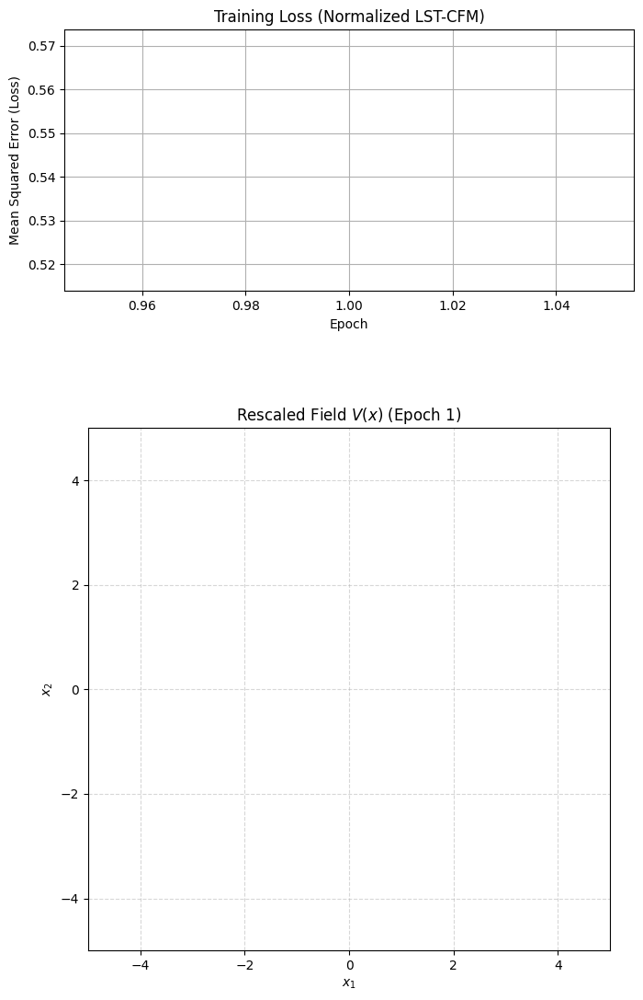

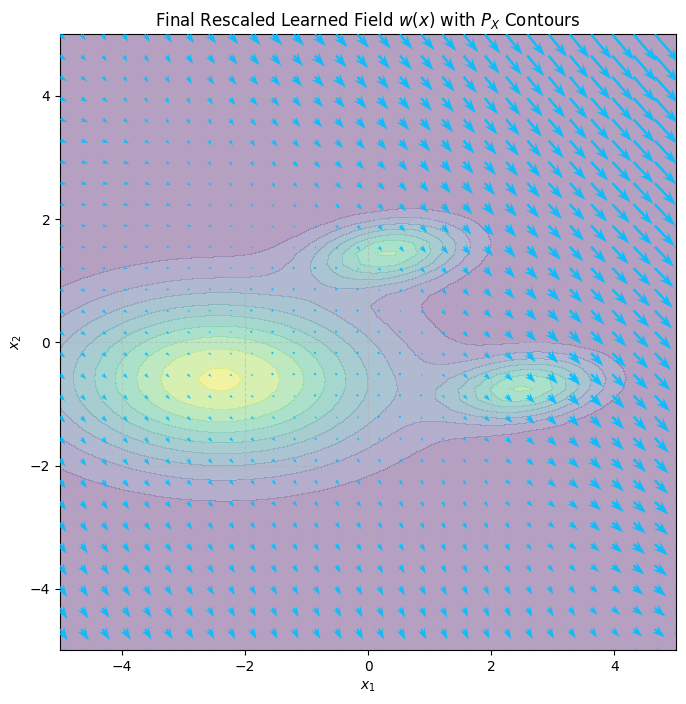

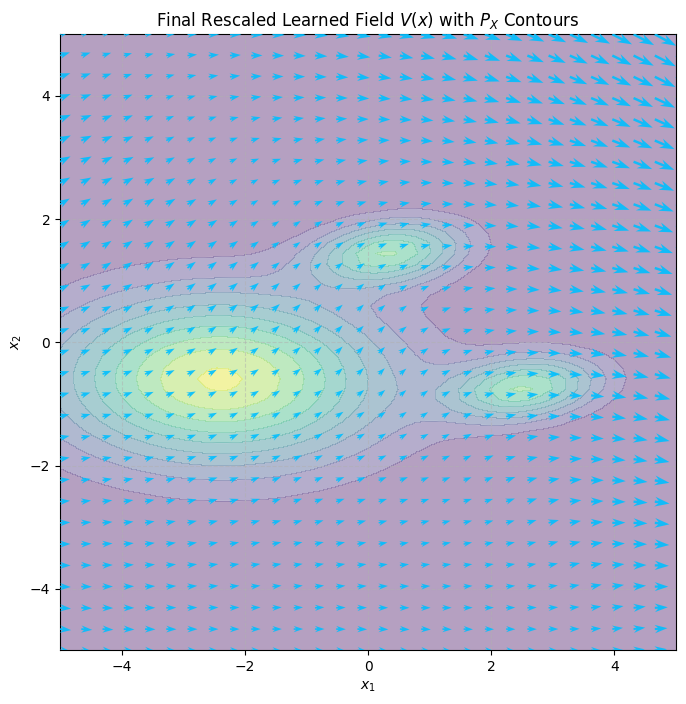

Generating 20 final trajectories (target $\Delta f = 8.00$)...


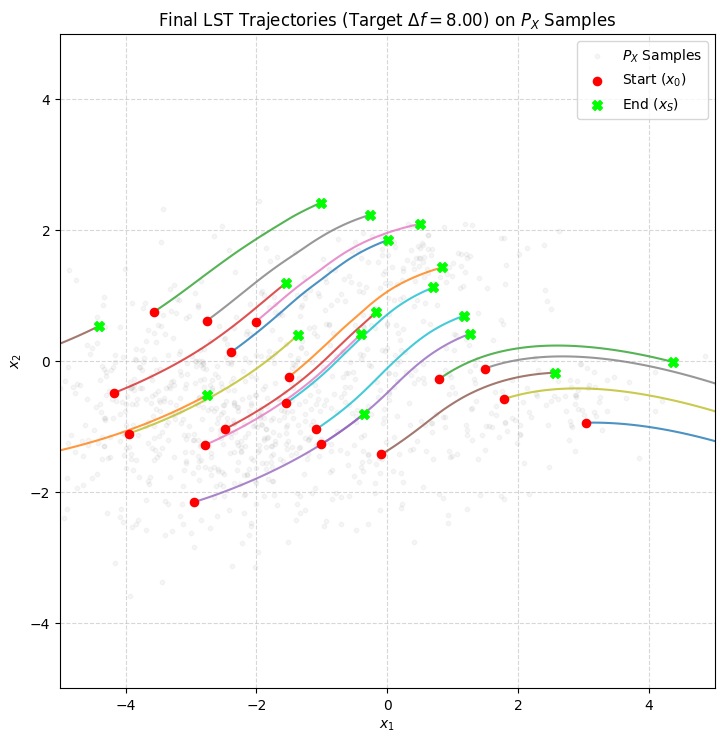

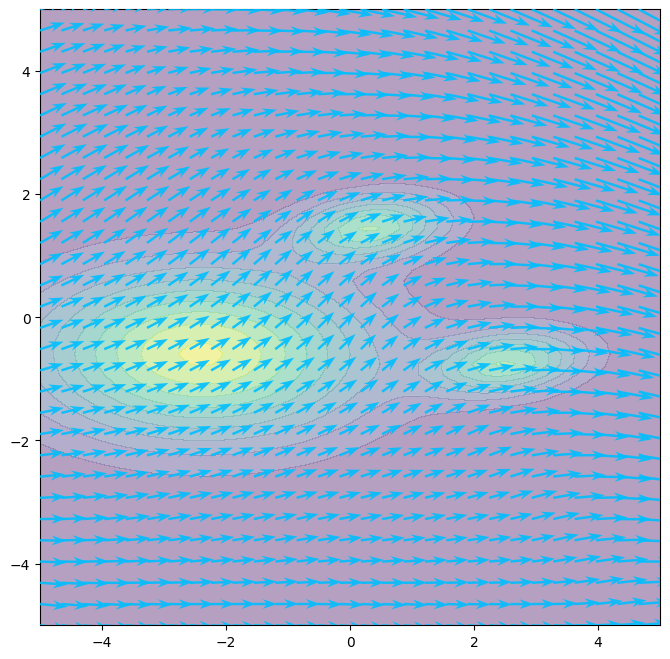

Detailed final LST flow visualization finished.
tensor([[0.0195, 0.0707],
        [5.6187, 0.1909],
        [3.6050, 0.1664],
        ...,
        [2.3641, 0.2982],
        [2.7573, 0.2484],
        [2.4840, 0.4264]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0128, 0.2975],
        [2.1868, 0.3179],
        [0.0146, 0.2108],
        ...,
        [0.1231, 0.1899],
        [0.4983, 0.0582],
        [0.4139, 0.1002]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[1.4396, 0.4088],
        [1.5349, 0.1888],
        [0.0204, 0.2594],
        ...,
        [0.7873, 0.0477],
        [0.7990, 0.0437],
        [2.6874, 0.0566]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.4981, 0.5498],
        [1.9569, 0.1792],
        [2.4881, 0.2639],
        ...,
        [2.2850, 0.1794],
        [0.0218, 0.1541],
        [0.4769, 0.0563]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0153, 0.3885],
        [2.0993, 0.2824],
        [0.9313, 0.4521],
        ...,
        [0.3388, 0.02

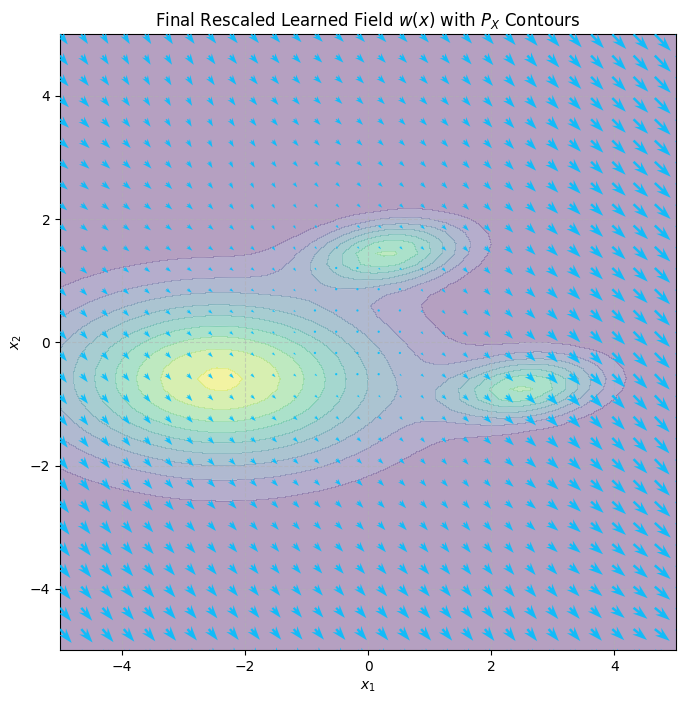

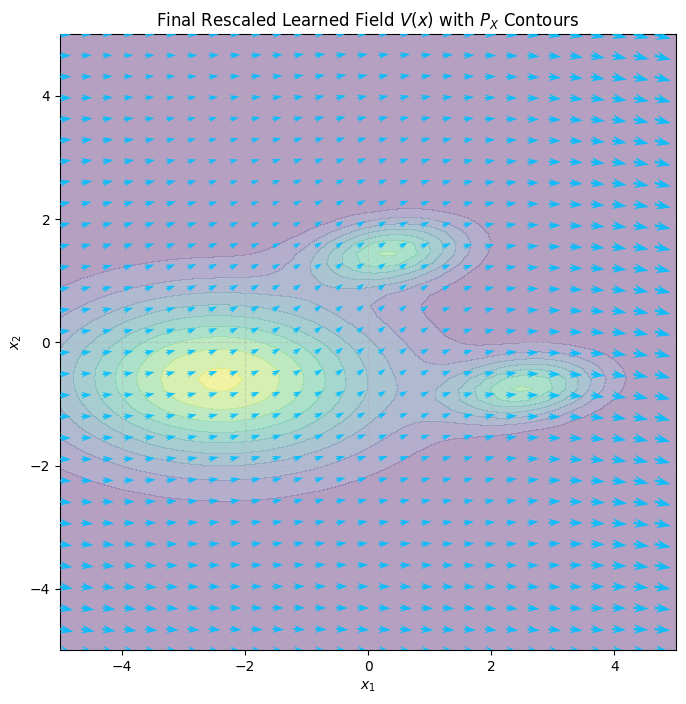

Generating 20 final trajectories (target $\Delta f = 8.00$)...


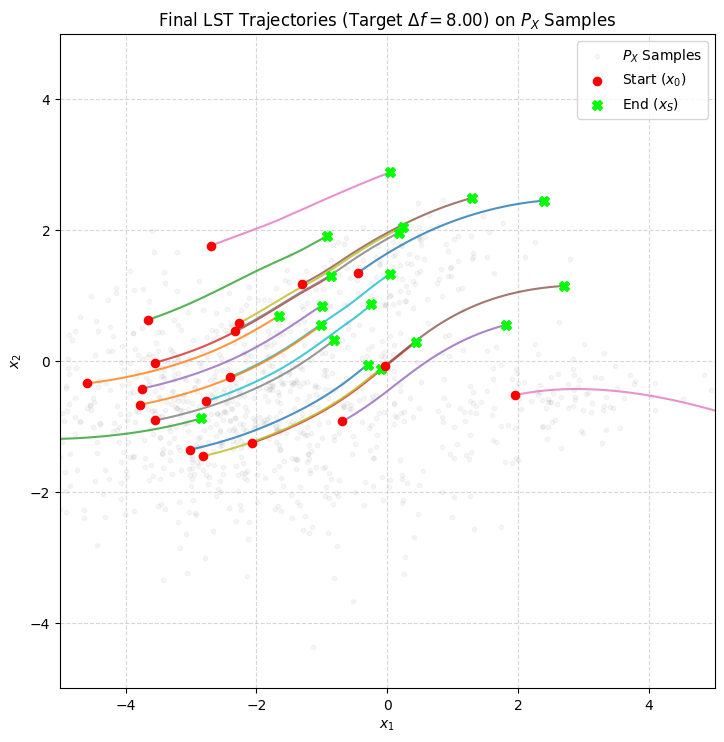

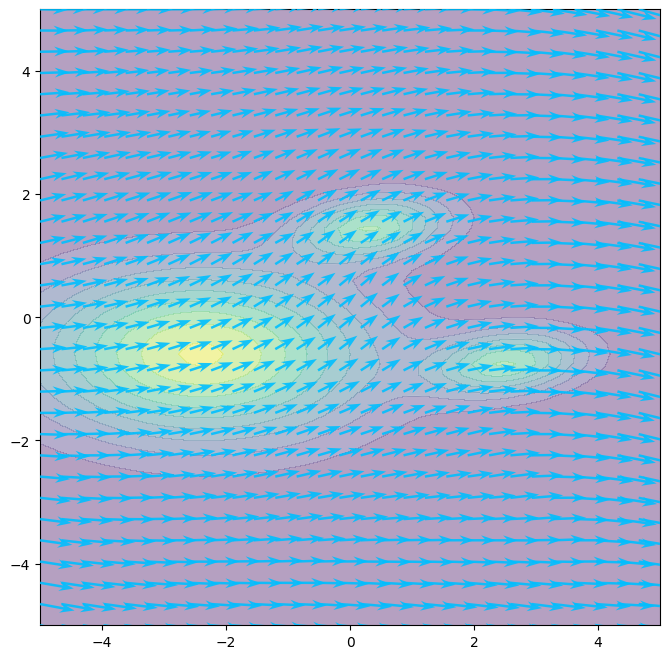

Detailed final LST flow visualization finished.
tensor([[0.0166, 0.5543],
        [0.8456, 0.2654],
        [1.4801, 0.4187],
        ...,
        [2.8901, 0.5242],
        [5.7280, 0.0731],
        [2.0452, 0.4185]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.7887, 0.0896],
        [0.1641, 0.3699],
        [0.0200, 0.3429],
        ...,
        [2.4738, 0.0601],
        [1.9626, 0.1433],
        [1.6100, 0.2428]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.1962, 0.3697],
        [1.2227, 0.3744],
        [2.8286, 0.3632],
        ...,
        [1.9153, 0.1192],
        [2.1820, 0.2891],
        [2.0439, 0.0449]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[2.6426, 0.1101],
        [0.7986, 0.2909],
        [1.9754, 0.2696],
        ...,
        [0.8217, 0.0689],
        [1.5173, 0.0627],
        [1.8374, 0.1631]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.4235, 0.2790],
        [2.1139, 0.2874],
        [0.0232, 0.4257],
        ...,
        [2.6303, 0.09

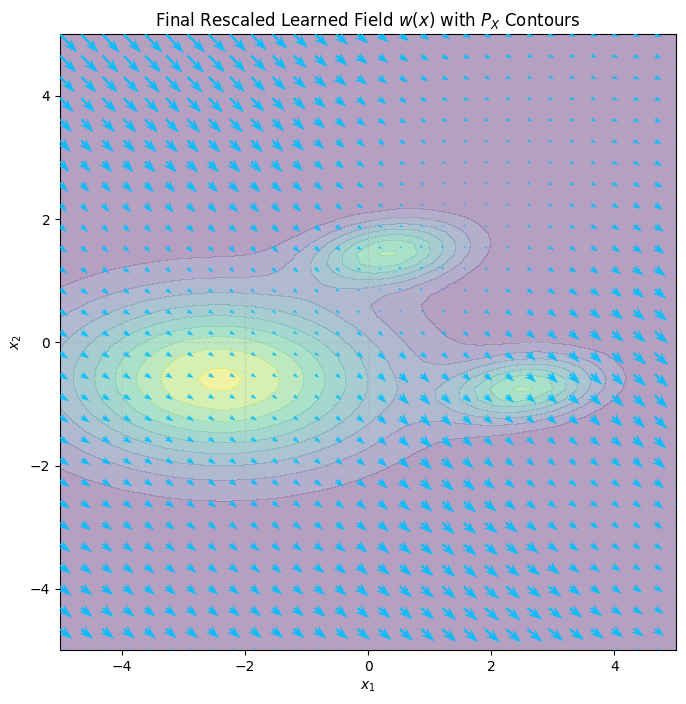

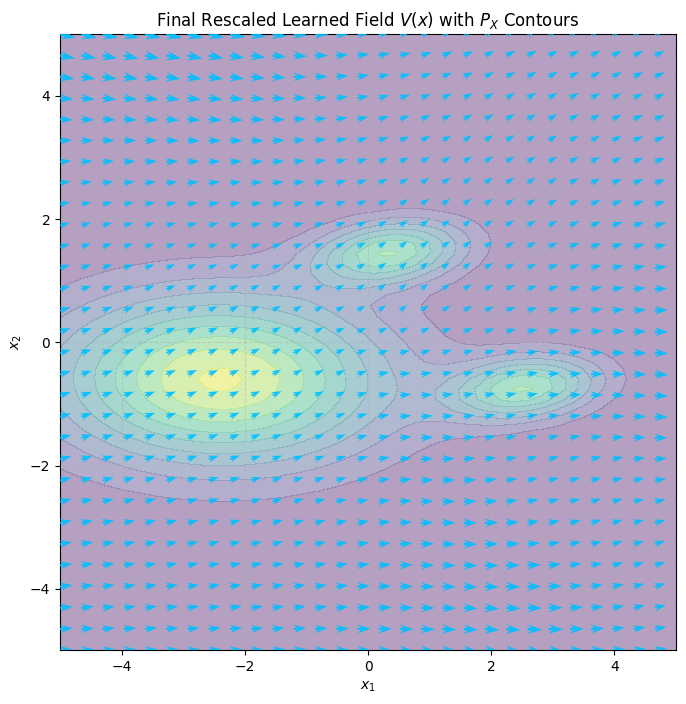

Generating 20 final trajectories (target $\Delta f = 8.00$)...


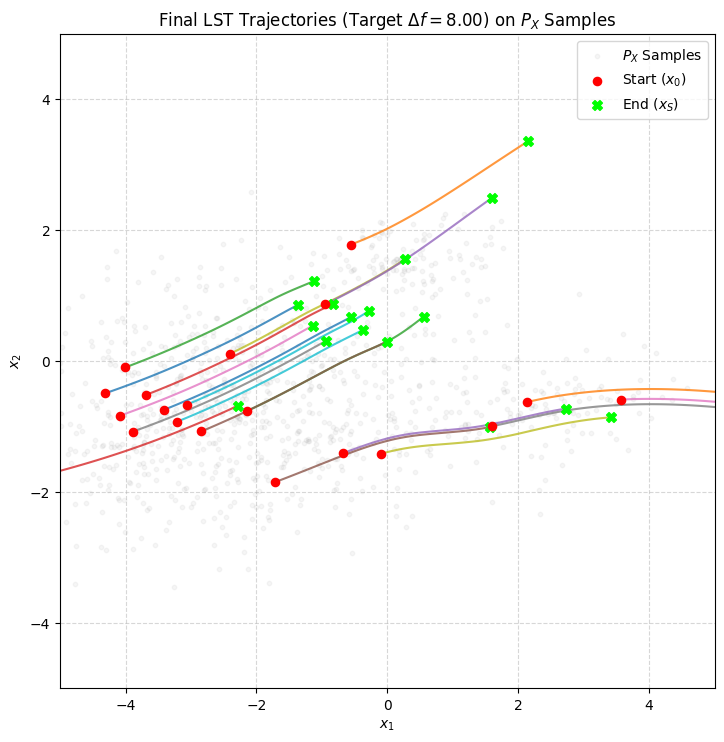

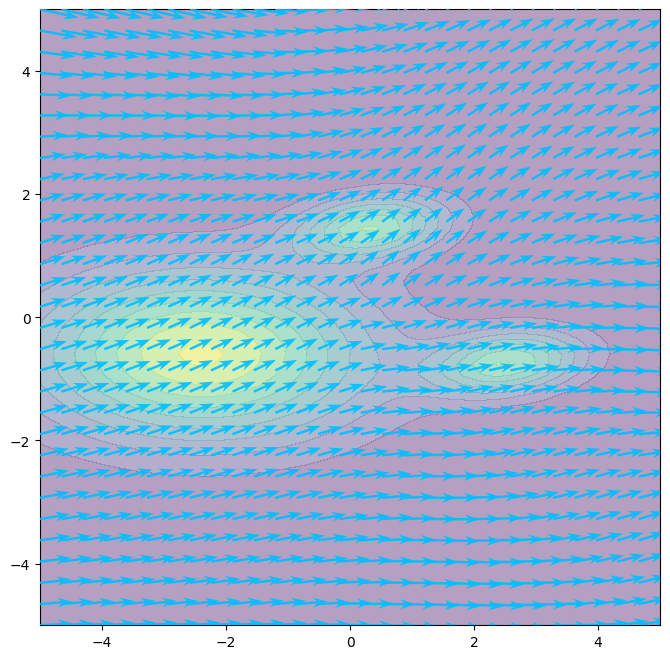

Detailed final LST flow visualization finished.
tensor([[1.8009, 0.1653],
        [1.4155, 0.1308],
        [1.7382, 0.1613],
        ...,
        [3.5058, 0.2375],
        [1.9633, 0.1933],
        [1.1190, 0.1968]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0158, 0.2639],
        [0.0060, 0.1612],
        [0.5932, 0.2076],
        ...,
        [0.0066, 0.0614],
        [1.5234, 0.1424],
        [3.5214, 0.0730]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0607, 0.1949],
        [1.4714, 0.1529],
        [0.7161, 0.1742],
        ...,
        [0.9648, 0.1248],
        [3.7972, 0.1468],
        [2.0329, 0.3101]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[5.0428e+00, 3.3158e-01],
        [1.9225e-02, 3.0919e-01],
        [1.2031e-02, 2.6988e-01],
        ...,
        [9.7635e-01, 6.2711e-02],
        [3.1471e-03, 7.7611e-02],
        [5.4774e+00, 3.0900e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[3.0498e-03, 3.0661e-01],
        [2.4877e-02, 9.6598e-0

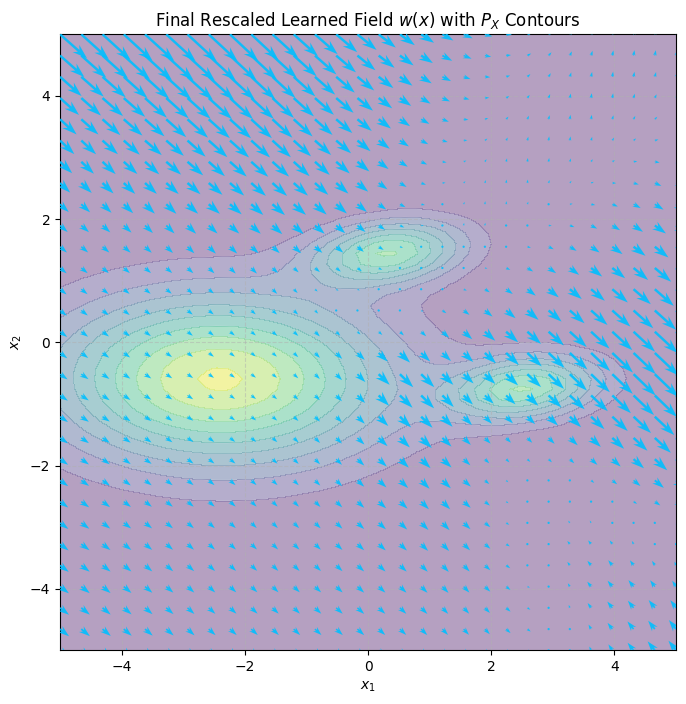

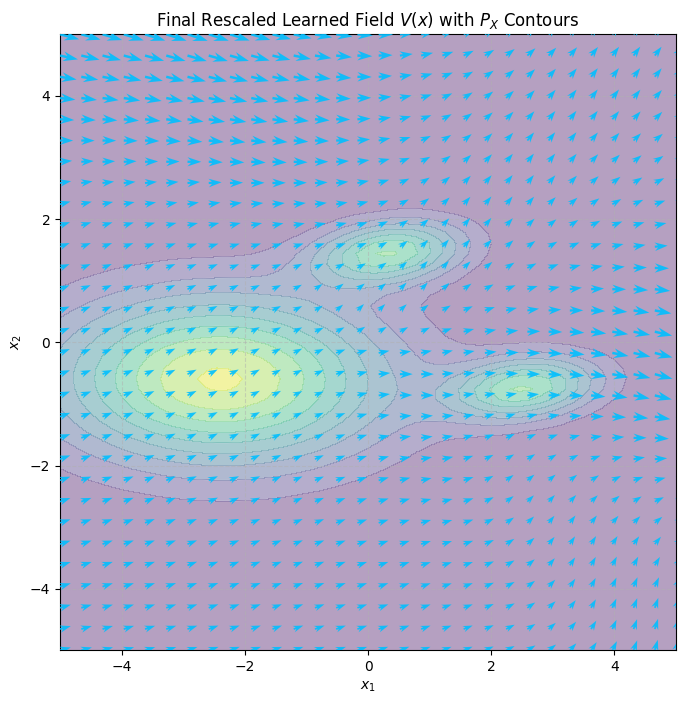

Generating 20 final trajectories (target $\Delta f = 8.00$)...


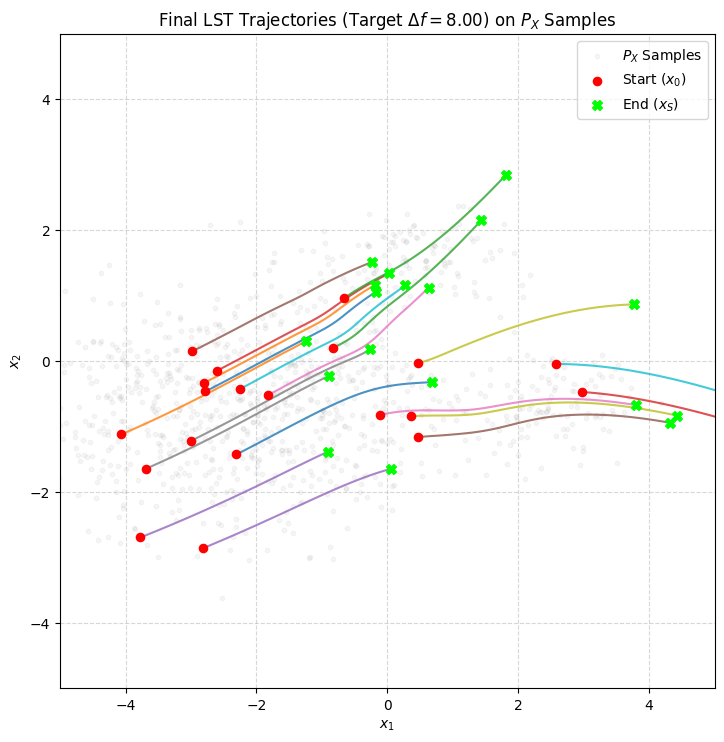

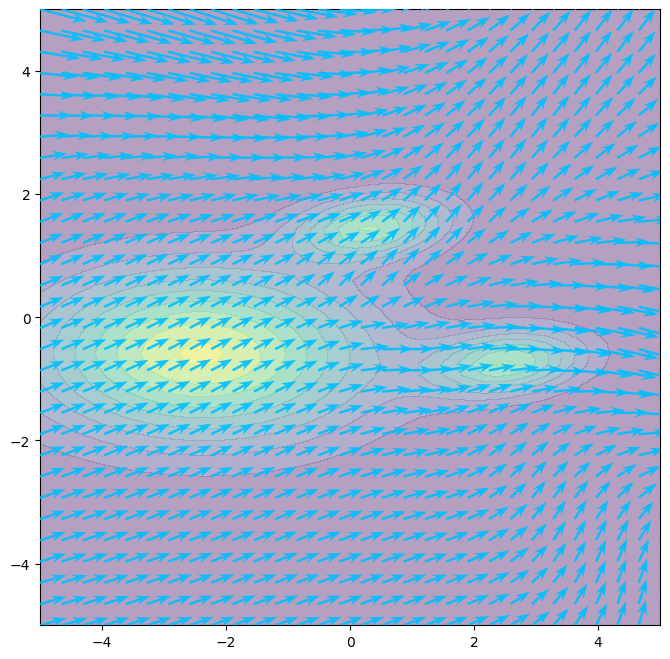

Detailed final LST flow visualization finished.
tensor([[1.9644, 0.1600],
        [1.1568, 0.2023],
        [0.0084, 0.2174],
        ...,
        [1.3629, 0.1326],
        [0.5463, 0.3638],
        [0.6709, 0.2037]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[3.6554, 0.2712],
        [1.3218, 0.2572],
        [1.5604, 0.2376],
        ...,
        [0.7388, 0.2700],
        [1.9719, 0.3140],
        [2.8489, 0.1854]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[1.6937, 0.1554],
        [0.0089, 0.3072],
        [2.6190, 0.2837],
        ...,
        [1.3495, 0.1738],
        [0.9658, 0.1755],
        [2.0144, 0.0221]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[3.6622, 0.1791],
        [0.1394, 0.2165],
        [0.0304, 0.2325],
        ...,
        [1.3360, 0.2082],
        [0.9603, 0.1406],
        [3.9791, 0.0368]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0117, 0.2104],
        [3.9323, 0.1842],
        [0.0182, 0.3435],
        ...,
        [3.7646, 0.07

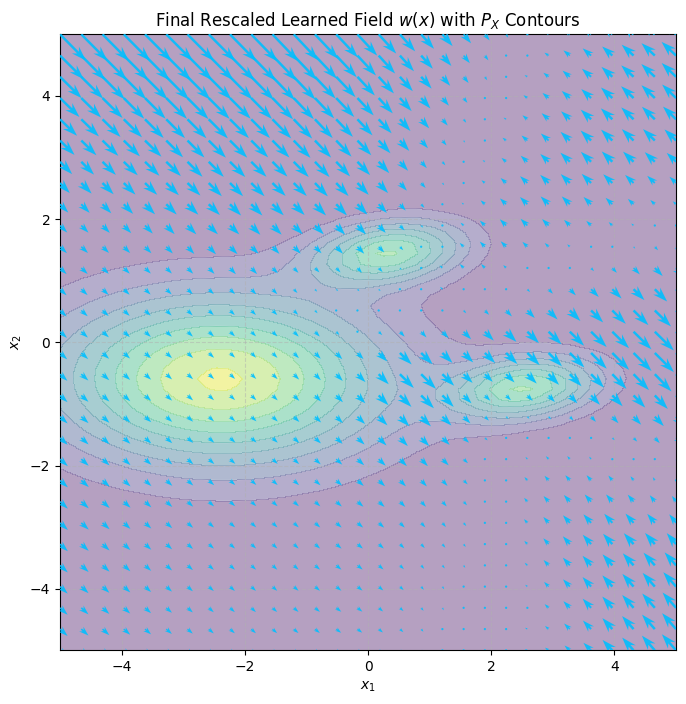

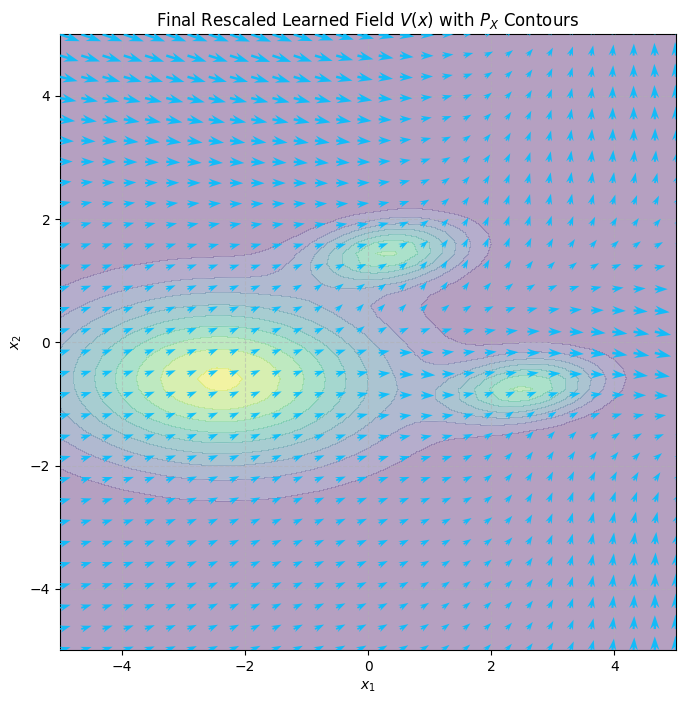

Generating 20 final trajectories (target $\Delta f = 8.00$)...


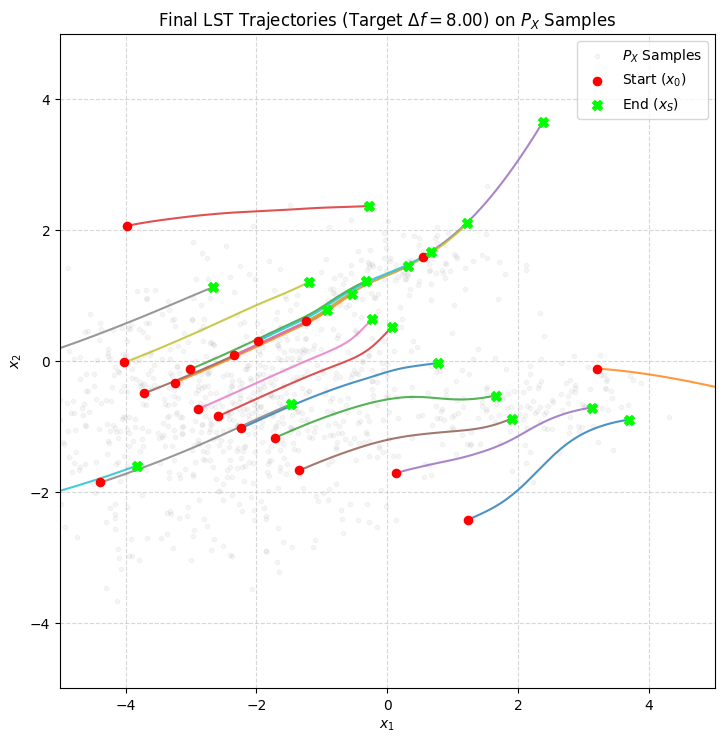

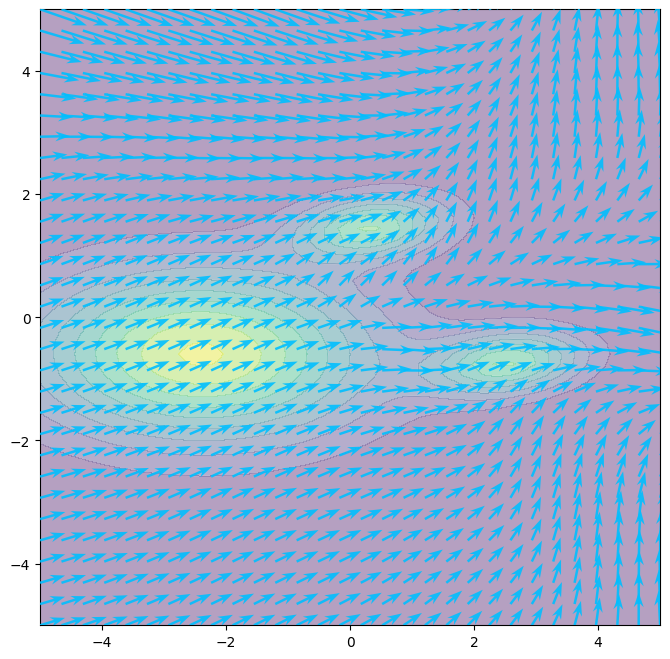

Detailed final LST flow visualization finished.
tensor([[0.0579, 0.2604],
        [1.0470, 0.2782],
        [2.1640, 0.1519],
        ...,
        [1.5554, 0.1641],
        [3.0644, 0.1228],
        [2.8279, 0.2210]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.5396, 0.1903],
        [0.0092, 0.3163],
        [0.0057, 0.1450],
        ...,
        [1.5503, 0.2480],
        [1.4665, 0.1546],
        [3.9134, 0.2502]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0272, 0.1963],
        [0.0060, 0.3774],
        [0.0188, 0.1407],
        ...,
        [0.1865, 0.0748],
        [0.8194, 0.2487],
        [1.0451, 0.3423]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[4.1266e+00, 3.6985e-01],
        [1.1182e-02, 1.9315e-01],
        [2.3784e-04, 3.0571e-01],
        ...,
        [6.4239e-01, 1.6647e-01],
        [5.9535e-01, 1.5640e-01],
        [1.4900e+00, 2.2284e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0193, 0.1884],
        [2.4243, 0.2083],
        [0.1

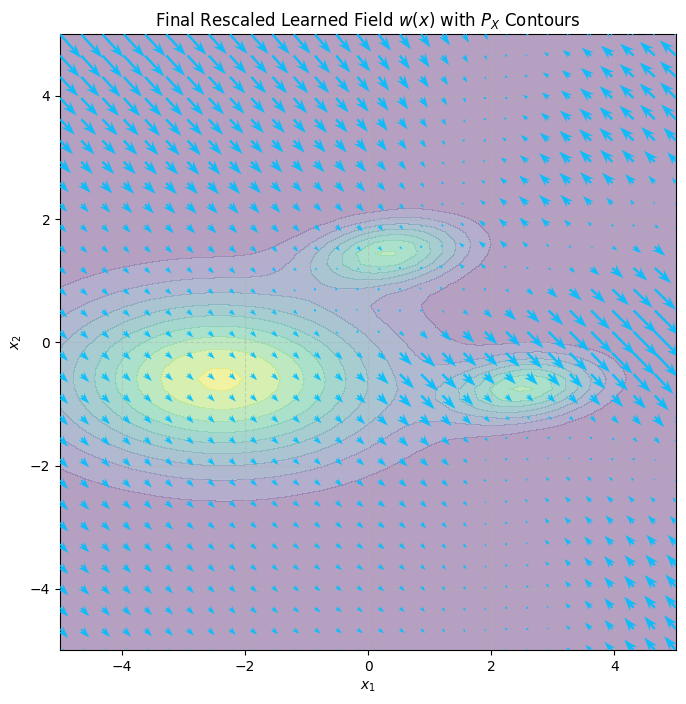

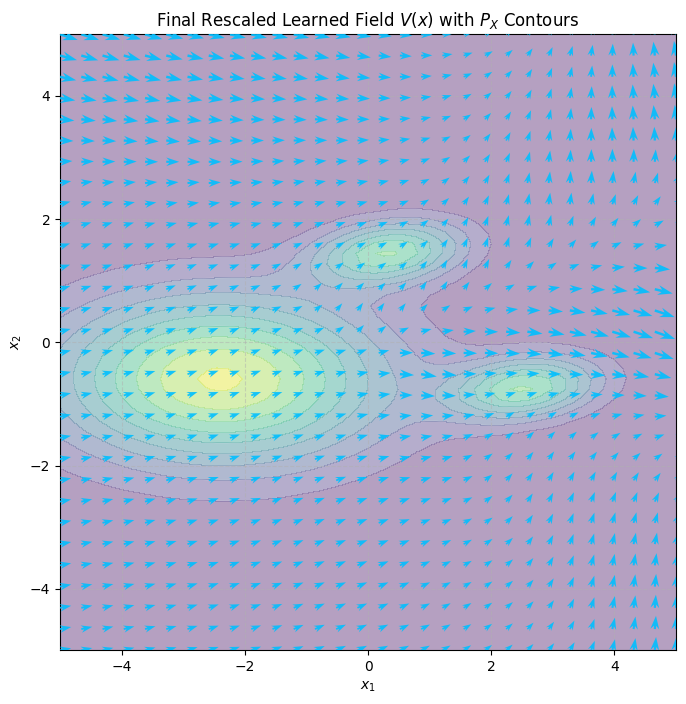

Generating 20 final trajectories (target $\Delta f = 8.00$)...


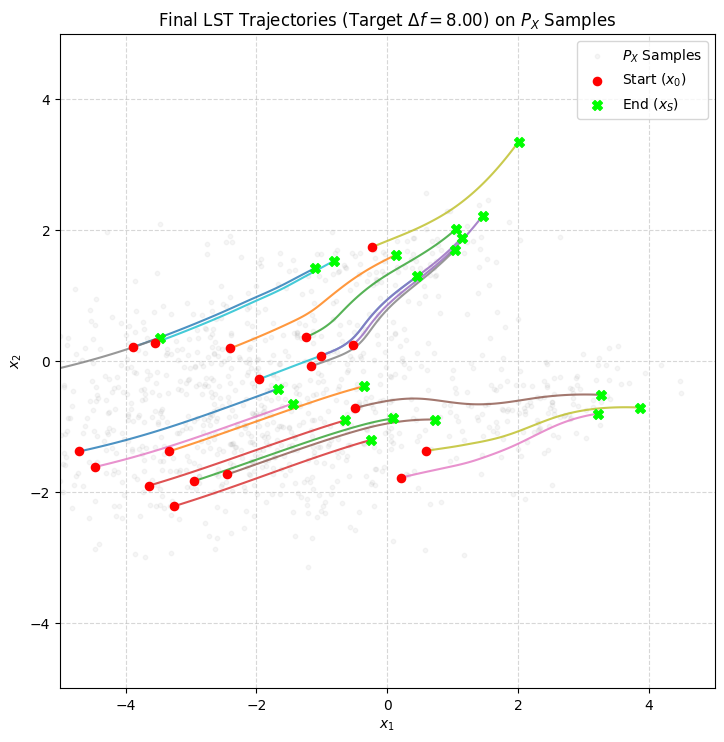

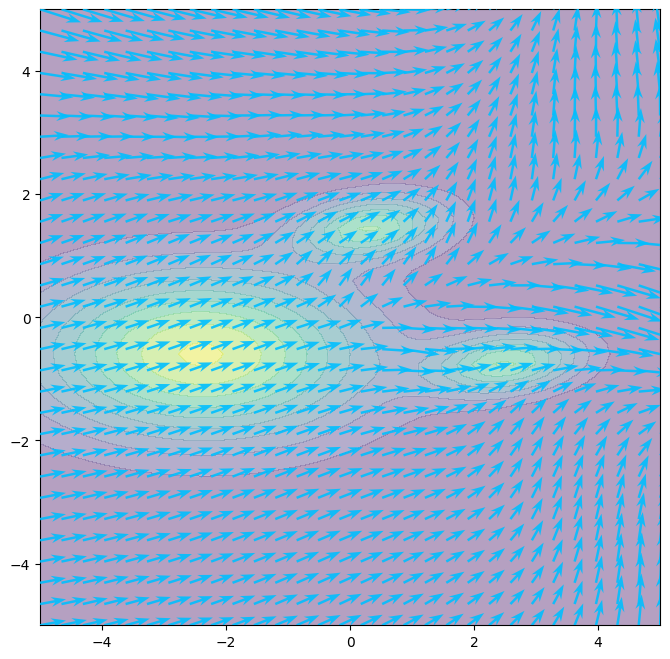

Detailed final LST flow visualization finished.
tensor([[2.7473, 0.2101],
        [0.0063, 0.3499],
        [1.0229, 0.2251],
        ...,
        [1.3929, 0.1232],
        [1.0838, 0.2408],
        [0.3623, 0.2154]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[3.9847, 0.1766],
        [0.0133, 0.2312],
        [0.0109, 0.1750],
        ...,
        [3.6429, 0.3078],
        [0.4904, 0.1697],
        [0.8321, 0.1520]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[2.8343e+00, 2.6206e-01],
        [1.9140e-03, 2.1669e-01],
        [4.4136e-03, 2.1005e-01],
        ...,
        [1.1626e+00, 2.3812e-01],
        [2.8643e+00, 1.7402e-01],
        [3.3853e-01, 3.0642e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[1.6225e-03, 2.1344e-01],
        [7.5630e-01, 2.0892e-01],
        [5.7110e+00, 1.3407e-01],
        ...,
        [8.4020e-03, 6.6890e-02],
        [1.3699e+00, 1.0266e-01],
        [3.1097e+00, 3.5984e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[2.1059,

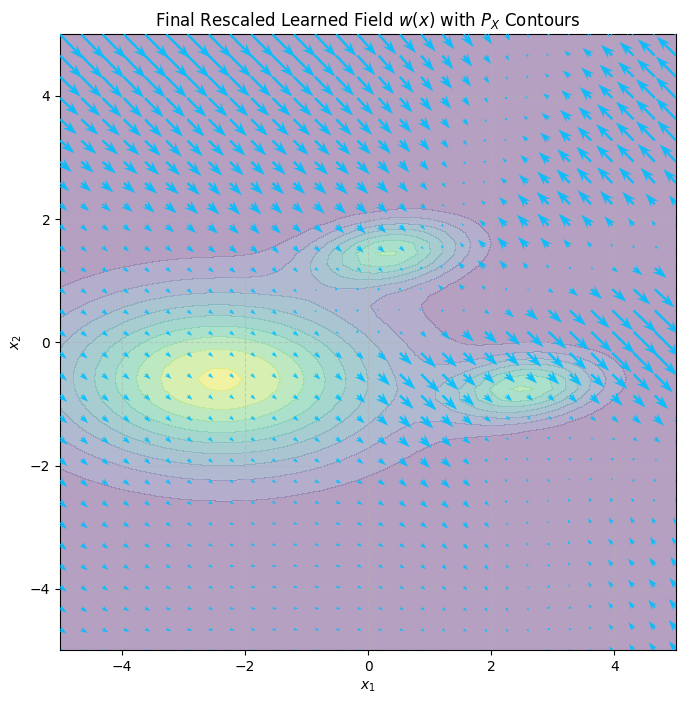

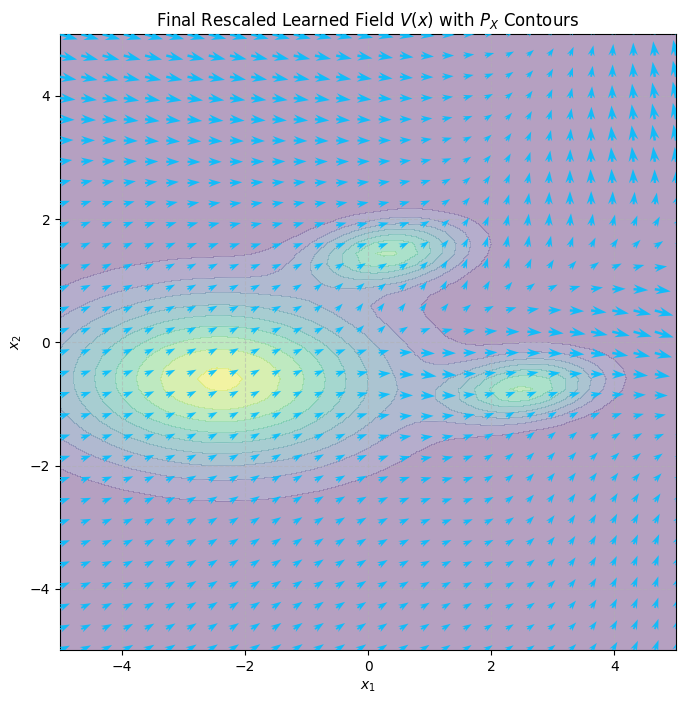

Generating 20 final trajectories (target $\Delta f = 8.00$)...


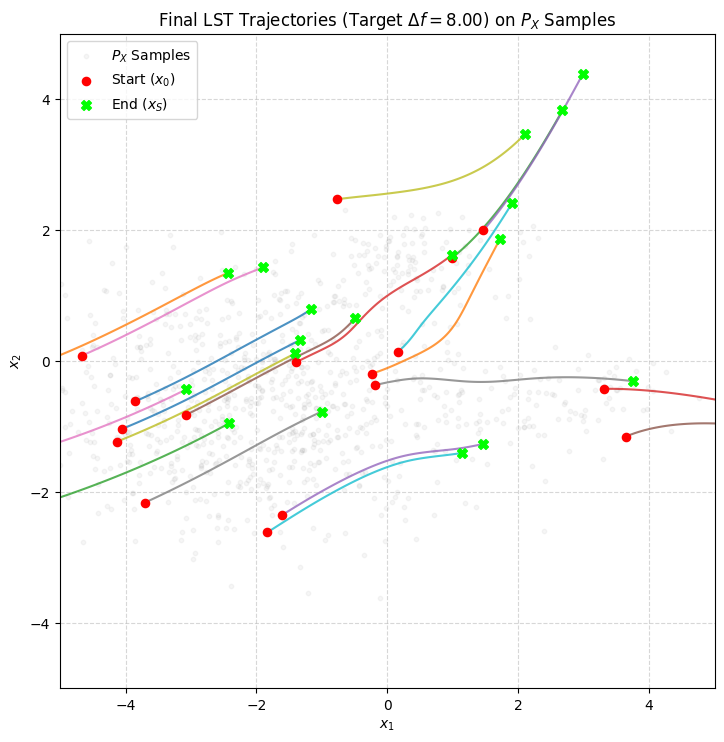

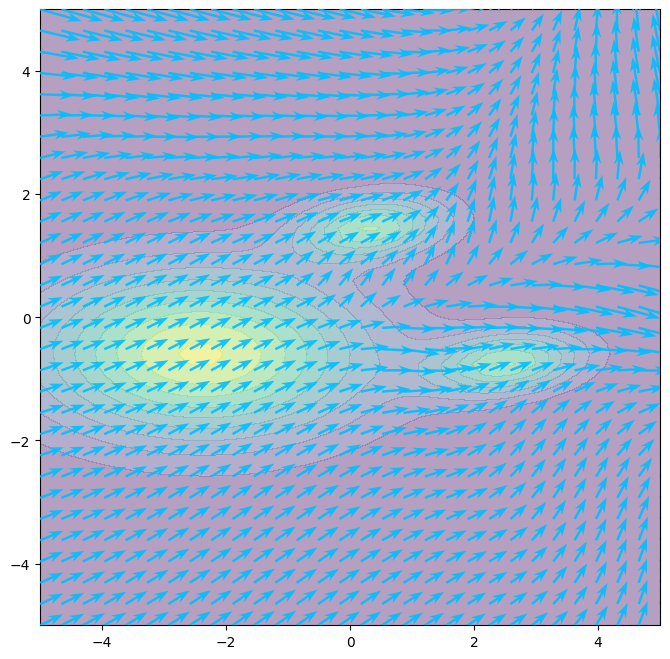

Detailed final LST flow visualization finished.
tensor([[3.9824e+00, 1.9104e-01],
        [5.8061e-01, 1.7919e-01],
        [5.8328e-04, 1.8106e-01],
        ...,
        [3.7580e-03, 5.9476e-02],
        [8.2642e-01, 1.4634e-01],
        [5.0592e+00, 3.3394e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.0080, 0.2529],
        [1.0739, 0.2162],
        [0.0307, 0.2060],
        ...,
        [0.5149, 0.1366],
        [2.8262, 0.1549],
        [2.6012, 0.0957]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[0.6150, 0.2912],
        [1.5127, 0.1633],
        [0.7786, 0.2546],
        ...,
        [2.4928, 0.0218],
        [1.3378, 0.2780],
        [1.2293, 0.1294]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[1.2370e-04, 2.1973e-01],
        [1.8878e+00, 2.1257e-01],
        [2.7563e+00, 2.0968e-01],
        ...,
        [2.9775e+00, 2.7105e-01],
        [5.4692e-01, 1.7484e-01],
        [2.3825e+00, 3.4203e-01]], device='mps:0', grad_fn=<CatBackward0>)
tensor([[1.2717,

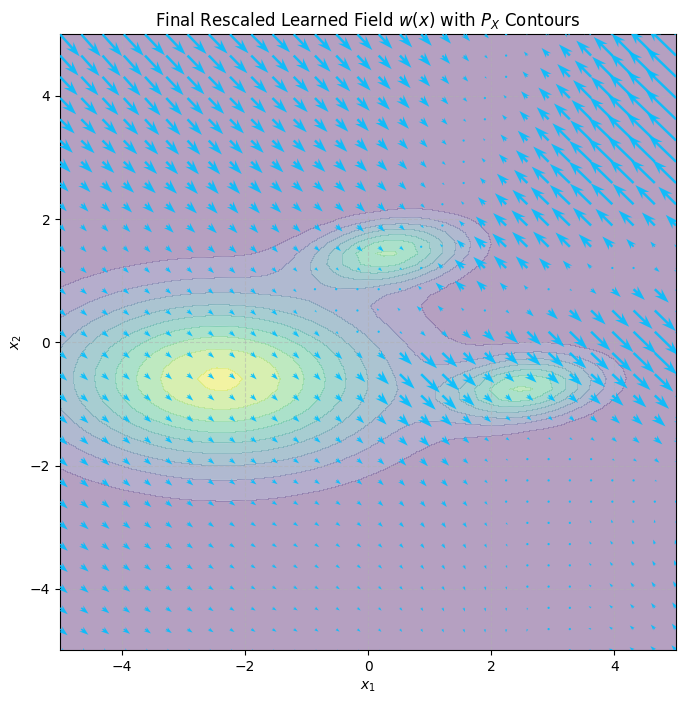

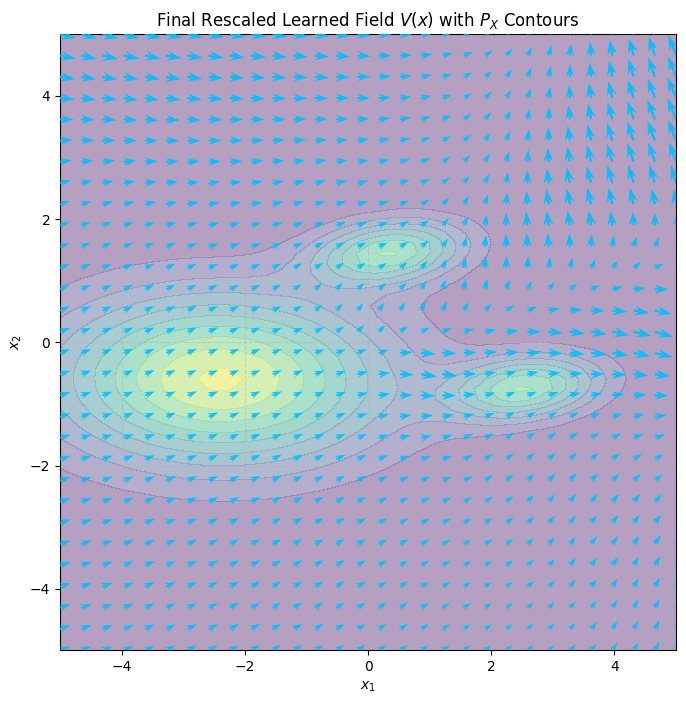

Generating 20 final trajectories (target $\Delta f = 8.00$)...


KeyboardInterrupt: 

In [10]:

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
# ConditionalFlowMatcher itself is not directly used for loss, but utils might be if needed.
# from torchcfm.conditional_flow_matching import ConditionalFlowMatcher 
from torchdiffeq import odeint
from tqdm import tqdm # For progress bars
import torch
from torch.utils.data import Dataset
from tqdm import tqdm

# Assume DEVICE and DTYPE are defined globally as in your previous script
# DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# DTYPE = torch.float64
# --- Global Settings ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "mps")
DTYPE = torch.float32
print(f"Using device: {DEVICE}, Dtype: {DTYPE}")

class HuberLoss(nn.Module):
    def __init__(self, delta=1.0):
        super().__init__()
        self.delta = delta
        if delta <= 0:
            raise ValueError("HuberLoss delta must be positive.")

    def forward(self, predictions, targets):
        # Ensure predictions and targets have the same shape
        if predictions.shape != targets.shape:
            raise ValueError(f"Predictions shape {predictions.shape} must match targets shape {targets.shape}")
        targets = targets.to(dtype=predictions.dtype)        
        error = torch.abs(targets - predictions)
        sum_error = (error**2).sum(dim=-1)
        
        quadratic_part_condition = (sum_error <= self.delta)
        linear_part_condition = (sum_error > self.delta) # Same as ~quadratic_part_condition
        
        # Initialize loss tensor
        loss_values = torch.zeros(predictions.shape[0], dtype=predictions.dtype, device=predictions.device)
        
        # Quadratic part for elements where |error| <= delta
        loss_values[quadratic_part_condition] = 0.5 * sum_error[quadratic_part_condition].to(dtype=predictions.dtype)
        
        # Linear part for elements where |error| > delta
        loss_values[linear_part_condition] = self.delta * (error[linear_part_condition].sum(dim=-1) - 0.5 * self.delta).to(dtype=predictions.dtype)
        
        return loss_values.mean()
huber = HuberLoss(.4)
# --- 6. Training Loop ---
def train_level_set_transport_model(p_distribution, f_func, grad_f_func, config, dataset):
    print("Starting Level-Set Transport model training...")
    if len(dataset) == 0:
        print("Dataset is empty. Aborting training.")
        return None
        
    if not isinstance(dataset, DataLoader):
        dataloader = DataLoader(dataset, batch_size=config['batch_size'], shuffle=True, num_workers=0)
    else:
        dataloader = dataset

    model_V_hat = VectorFieldTransformer(
        f_module(f_func),
        dim=2,
        depth=3,
        # dim_head=32,
        # num_heads=6,
        # num_registers=16,
        # condition_dim=20,
        add_rating_gradient=False,
        # dropout=0.2
    ).to(DEVICE)
    model_V_hat = VectorFieldModel2(
        f_module(f_func),
        input_dim=3,
        hidden_dims=[1024, 1024, 1024],
        output_dim=2,
        activation=torch.nn.ReLU(),
        dropout_rate=0.1,
        add_rating_gradient=False,
    ).to(DEVICE)
    
    optimizer = optim.AdamW(model_V_hat.parameters(), lr=config['lr'], weight_decay=0.001)
    # optimizer = Lamb(
    #     model_V_hat.parameters(),
    #     lr=config['lr'],
    #     betas=(0.9, 0.999),
    #     weight_decay=0.01,
    #     eps=1e-8
    # )
    # Removed plt.ion() as the magic command handles interactivity
    fig_dynamic, (ax_loss, ax_vf) = plt.subplots(2, 1, figsize=(8, 13), gridspec_kw={'height_ratios': [1, 2]})
    plt.subplots_adjust(hspace=0.35)

    losses_history = []
    ax_loss.set_xlabel("Epoch")
    ax_loss.set_ylabel("Mean Squared Error (Loss)")
    ax_loss.set_title("Training Loss (Normalized LST-CFM)")
    ax_loss.grid(True)
    line_loss, = ax_loss.plot([], [], 'b-') 

    ax_vf.set_xlabel("$x_1$")
    ax_vf.set_ylabel("$x_2$")
    ax_vf.set_aspect('equal', adjustable='box')
    ax_vf.set_xlim(config['vis_grid_extents'])
    ax_vf.set_ylim(config['vis_grid_extents'])
    ax_vf.grid(True, linestyle='--', alpha=0.5)

    model_V_hat.train()
    global batches
    try:
        for epoch in range(config['num_epochs']):
            real_i = 0
            epoch_loss_sum = 0.0
            model_V_hat.train()
            for i, (x0_batch, x1_batch, u_hat_target_batch) in enumerate(dataloader):
                x0_batch = x0_batch.to(DEVICE, dtype=DTYPE)
                x1_batch = x1_batch.to(DEVICE, dtype=DTYPE)
                u_hat_target_batch = u_hat_target_batch.to(DEVICE, dtype=DTYPE)
                batches.append((x0_batch,x1_batch, u_hat_target_batch))
                
                
                optimizer.zero_grad()
                
                t_batch = torch.rand(x0_batch.shape[0], device=DEVICE, dtype=DTYPE)

                xt_batch = (1 - t_batch.unsqueeze(-1)) * x0_batch + t_batch.unsqueeze(-1) * x1_batch #+ torch.randn_like(x0_batch, device=DEVICE, dtype=DTYPE)
                xt_grad_batch = grad_f_func(xt_batch, f_func)/torch.linalg.norm(grad_f_func(xt_batch, f_func), dim=-1, keepdim=True)
                # plt.quiver(xt_batch[:,0].cpu().numpy(), xt_batch[:,1].cpu().numpy(), u_hat_target_batch[:,0].cpu().numpy(), u_hat_target_batch[:,1].cpu().numpy(), scale=20, headwidth=4)
                # plt.show()
                u_hat_target_batch = (u_hat_target_batch-xt_grad_batch*torch.sum(u_hat_target_batch*xt_grad_batch, dim=-1, keepdim=True))
                # #plot the vector field at xt_batch in the direction of u_hat_target_batch, large arrow tip
                # plt.quiver(xt_batch[:,0].cpu().numpy(), xt_batch[:,1].cpu().numpy(), u_hat_target_batch[:,0].cpu().numpy(), u_hat_target_batch[:,1].cpu().numpy(), scale=20, width=0.003)
                # plt.show()
                w_hat_pred_batch = model_V_hat(xt_batch)
                w_hat_pred_norm = torch.linalg.norm(w_hat_pred_batch, dim=-1, keepdim=True)         
                loss = huber(w_hat_pred_batch, u_hat_target_batch) #+ .1*torch.mean(torch.relu(w_hat_pred_norm-1))
                
                loss.backward()
                optimizer.step()
                epoch_loss_sum += loss.item()

                print(torch.cat([u_hat_target_batch.norm(dim=-1,keepdim=True),w_hat_pred_norm],dim=-1))       

                if len(batches)>50:
                    for j in range(25):
                        #randomly select a batch from batches
                        batch_idx = np.random.randint(0, len(batches))
                        x0_batch, x1_batch, u_hat_target_batch = batches[batch_idx]

                        t_batch = torch.rand(x0_batch.shape[0], device=DEVICE, dtype=DTYPE)

                        xt_batch = (1 - t_batch.unsqueeze(-1)) * x0_batch + t_batch.unsqueeze(-1) * x1_batch #+ torch.randn_like(x0_batch, device=DEVICE, dtype=DTYPE)
                        xt_grad_batch = grad_f_func(xt_batch, f_func)/torch.linalg.norm(grad_f_func(xt_batch, f_func), dim=-1, keepdim=True)
                        u_hat_target_batch = (u_hat_target_batch-xt_grad_batch*torch.sum(u_hat_target_batch*xt_grad_batch, dim=-1, keepdim=True))

                        w_hat_pred_batch = model_V_hat(xt_batch)
                        w_hat_pred_norm = torch.linalg.norm(w_hat_pred_batch, dim=-1, keepdim=True)
                        loss = huber(w_hat_pred_batch, u_hat_target_batch) #+ .1*torch.mean(torch.relu(w_hat_pred_norm-1))
                        
                        loss.backward()
                        optimizer.step()
                        epoch_loss_sum += loss.item()
                        real_i += 1

                

                
                if real_i==1000:
                    break
            
            avg_epoch_loss = epoch_loss_sum / len(dataloader)
            losses_history.append(avg_epoch_loss)

            if (epoch + 1) % config.get('print_loss_every_epochs', 1) == 0:
                 print(f"Epoch [{epoch+1}/{config['num_epochs']}], Loss: {avg_epoch_loss:.6e}")
            
            if (epoch + 1) % config.get('update_plot_every_epochs', 1) == 0:
                line_loss.set_data(range(1, len(losses_history) + 1), losses_history)
                ax_loss.relim()
                ax_loss.autoscale_view(tight=False) 
                fig_dynamic.canvas.draw_idle() 


            if (epoch + 1) % config.get('plot_field_every_epochs', 20) == 0 or epoch == config['num_epochs'] - 1 :
                ax_vf.clear() 
                ax_vf.set_xlabel("$x_1$"); ax_vf.set_ylabel("$x_2$")
                ax_vf.set_title(f"Rescaled Field $V(x)$ (Epoch {epoch+1})")
                ax_vf.set_aspect('equal', adjustable='box')
                ax_vf.set_xlim(config['vis_grid_extents']); ax_vf.set_ylim(config['vis_grid_extents'])
                ax_vf.grid(True, linestyle='--', alpha=0.5)

                # _plot_current_rescaled_field_and_contours(
                #     model_V_hat, p_distribution, f_func, grad_f_function, ax_vf,
                #     grid_extents=config['vis_grid_extents'],
                #     grid_points=config.get('vis_grid_points_dynamic', 15),
                #     device=DEVICE, dtype=DTYPE,
                #     stability_eps=config.get('rescaling_stability_eps', 1e-4)
                # )
                
                # fig_dynamic.canvas.draw_idle() # Use draw_idle for better responsiveness

                visualize_final_lst_flow(
                    model_V_hat, 
                    p_distribution, 
                    f_potential_func, grad_f_function,
                    grid_extents=shared_vis_grid_extents, 
                    grid_points=30, 
                    num_trajectories=20,
                    S_final=8.0, # Target increase in f for trajectory plot
                    stability_eps=lst_config['rescaling_stability_eps']
                )
                plt.show()
                # plt.pause(0.01) # You might be able to remove or reduce this if updates are fast
    finally:
        # Removed plt.ioff()
        # plt.show() # This will keep the final plot open in Jupyter until you close it or run another cell
        pass # In Jupyter, the plot will persist without an explicit plt.show() after the cell finishes.
    print("Training finished.")
    return model_V_hat


# --- Define p(x) ---
mix_probs = torch.tensor([0.8, 0.1,0.1], device=DEVICE, dtype=DTYPE)
means = torch.tensor([[-1.5, -1.5], [2, -.2], [-.2,2]], device=DEVICE, dtype=DTYPE)
std_devs = torch.tensor([0.7, 0.3, 0.3], device=DEVICE, dtype=DTYPE)*1.9


cov_mats_list = []
for std in std_devs:
    cov_mats_list.append(torch.eye(2, device=DEVICE, dtype=DTYPE) * (std**2) + torch.tensor([[0.0, (std*0.4)*2/3], [(std*0.4)*2/3, 0.0]], device=DEVICE, dtype=DTYPE))
cov_mats = torch.stack(cov_mats_list)

p_dist_param_device = DEVICE 
mix = torch.distributions.Categorical(mix_probs.to(p_dist_param_device))
comp = torch.distributions.MultivariateNormal(means.to(p_dist_param_device), cov_mats.to(p_dist_param_device))
p_distribution = torch.distributions.MixtureSameFamily(mix, comp)

class SkewedDistribution(torch.distributions.Distribution):
    def __init__(self, base_distribution, device=None, dtype=None):
        self.base_distribution = base_distribution
        self.device = device or DEVICE
        self.dtype = dtype or DTYPE
        super().__init__()
    
    def log_prob(self, coords_tensor):
        # Apply the skewing transformation
        skewed_coords = coords_tensor + (coords_tensor @ torch.tensor([[1.],[1.]], device=self.device, dtype=self.dtype)) * torch.tensor([[-.3,.3]], device=self.device, dtype=self.dtype)
        return self.base_distribution.log_prob(skewed_coords)
    
    def sample(self, sample_shape=torch.Size()):
        # Approximate sampling using rejection sampling
        # Sample from base distribution and apply inverse skewing approximation
        base_samples = self.base_distribution.sample(sample_shape)
        
        # Approximate inverse transformation using iterative method
        # Start with base samples as initial guess
        coords = base_samples.clone()
        
        # Apply a few iterations of Newton-like method to approximate inverse
        for _ in range(3):  # Few iterations for approximation
            # Current skewing transformation
            skew_term = (coords @ torch.tensor([[1.],[1.]], device=self.device, dtype=self.dtype)) * torch.tensor([[-.3,.3]], device=self.device, dtype=self.dtype)
            skewed_coords = coords + skew_term
            
            # Approximate correction (simplified inverse)
            correction = base_samples - skewed_coords
            coords = coords + 0.5 * correction  # Damped update
        
        return coords

skewed_distribution = SkewedDistribution(p_distribution, device=DEVICE, dtype=DTYPE)

def skewed_density(coords_tensor):
    return torch.exp(skewed_distribution.log_prob(coords_tensor))


def f_potential_func(coords_tensor): # coords_tensor is (N, 2)
    return torch.sum(coords_tensor**2, dim=-1) / 300.0 +torch.sum(coords_tensor, dim=-1)*2

@torch.enable_grad()
def grad_f_function(x_coords, f_func_ref=f_potential_func):
    """ Computes gradient of f_func_ref w.r.t. x_coords using autograd """
    # x_coords shape: (N, 2)
    # Ensure x_coords requires grad for this operation without affecting original
    temp_x = x_coords.detach().clone().requires_grad_(True)
    f_values = f_func_ref(temp_x) # (N,)
    
    # Summing f_values to create a scalar for .backward() is one way,
    # but torch.autograd.grad is more direct for per-sample gradients.
    grad_outputs_tensor = torch.ones_like(f_values, device=f_values.device, dtype=f_values.dtype)
    gradients = torch.autograd.grad(
        outputs=f_values,
        inputs=temp_x,
        grad_outputs=grad_outputs_tensor,
        create_graph=False, 
        retain_graph=False,
        allow_unused=False 
    )[0] # Output shape: (N, 2)
    return gradients
# --- Main Execution ---


class f_module(torch.nn.Module):
    def __init__(self, f_potential_func):
        super(f_module, self).__init__()
        self.f_potential_func = f_potential_func

    def forward(self, x):
        return self.f_potential_func(x)




if __name__ == "__main__":
    shared_vis_grid_extents = (-5.0, 5.0) 

    lst_config = {
        'dataset_pool_size': 100_000, # Number of initial samples to find pairs from
        'min_f_diff': 0.0001,        # Minimum f(x1)-f(x0) to form a pair
        'batch_size': 2048,
        
        'num_epochs': 100,       # Adjust for more/less training
        
        'lr': 1e-5,
        'model_hidden_dim': 512,
        # Plotting config
        'print_loss_every_epochs': 1,
        'update_plot_every_epochs': 1, 
        'plot_field_every_epochs': 1, 
        'vis_grid_extents': shared_vis_grid_extents,
        'vis_grid_points_dynamic': 15, 
        'rescaling_stability_eps': 1e-3, # Epsilon for V(x) rescaling denominator
    }


    pool_dataset = PoolDataset(
        skewed_distribution, 
        f_potential_func, 
        pool_size=lst_config['dataset_pool_size'],
        device=DEVICE, # Store pool data on the main training device
        dtype=DTYPE
    )
    train_dataloader = DataLoader(
        pool_dataset,
        batch_size=int(lst_config['batch_size'] * 2.21),
        shuffle=True, # Shuffles indices from PoolDataset before fetching
        collate_fn=custom_collate,
        num_workers=0, # Start with 0 workers for simplicity, then increase if I/O bound
        drop_last=True # Ensures collate_fn always gets an even number of samples if dataloader_batch_size is even
    )

    trained_V_hat_model = train_level_set_transport_model(
        skewed_distribution, f_potential_func, grad_f_function, lst_config, train_dataloader
    )

    if trained_V_hat_model:
        visualize_final_lst_flow(
            trained_V_hat_model, 
            skewed_distribution, 
            f_potential_func, grad_f_function,
            grid_extents=shared_vis_grid_extents, 
            grid_points=30, 
            num_trajectories=15,
            S_final=8.0, # Target increase in f for trajectory plot
            stability_eps=lst_config['rescaling_stability_eps']
        )